In [1]:
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import datetime
%matplotlib inline

In [2]:
n_sensors=16

In [3]:
x = np.linspace(0, 1, 101)
y = np.linspace(0, 1, 101)

In [4]:
t = np.linspace(0, 1, 41)

In [5]:
xrange = np.linspace(0, 1, 101)
yrange = np.linspace(0, 1, 101)
xmesh, ymesh = np.meshgrid(xrange, yrange)

In [6]:
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

$$ f_1(x, y, t) = e^{-t}(cos2\pi xcos2\pi y + sin2\pi xsin2\pi y) $$
$$ f_2(x, y, t) = x + y + t $$
$$ f_3(x, y, t) = e^{-t}(2sin2\pi x + sin2\pi xcos2\pi y) $$

Case 1: f1

In [7]:
out1 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out1[i, j, k] = np.exp(-t[i])*(np.cos(2*np.pi*x[j])*np.cos(2*np.pi*y[k])
                                           + np.sin(2*np.pi*x[j])*np.sin(2*np.pi*y[k]))

In [8]:
out1[0, :, :]

array([[1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ],
       [0.99802673, 1.        , 0.99802673, ..., 0.98228725, 0.9921147 ,
        0.99802673],
       [0.9921147 , 0.99802673, 1.        , ..., 0.96858316, 0.98228725,
        0.9921147 ],
       ...,
       [0.9921147 , 0.98228725, 0.96858316, ..., 1.        , 0.99802673,
        0.9921147 ],
       [0.99802673, 0.9921147 , 0.98228725, ..., 0.99802673, 1.        ,
        0.99802673],
       [1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ]])

In [9]:
sensor1 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor1[i, j, k] = out1[i, 20*(j+1)+1, 20*(k+1)+1]

In [10]:
sensor1.shape

(41, 4, 4)

In [11]:
sensor1 = sensor1.reshape(41, 16, 1)

In [12]:
sensor1.shape

(41, 16, 1)

In [13]:
x_train1, x_test1, y_train1, y_test1, t_train, t_test = train_test_split(sensor1, out1, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [14]:
t_train

array([[0.725],
       [0.15 ],
       [0.65 ],
       [0.3  ],
       [0.425],
       [0.225],
       [0.375],
       [0.8  ],
       [0.4  ],
       [0.875],
       [0.85 ],
       [0.   ],
       [0.675],
       [0.125],
       [0.275],
       [0.025],
       [0.75 ],
       [0.525],
       [0.05 ],
       [0.775],
       [0.925],
       [0.075],
       [0.9  ],
       [0.575],
       [0.825],
       [0.25 ],
       [0.55 ],
       [0.45 ],
       [0.5  ],
       [0.175],
       [0.35 ],
       [0.7  ],
       [0.95 ]])

In [15]:
x_train1

array([[[ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457]],

       [[ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798]],

       [[ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
       

In [16]:
x_test1

array([[[ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164]],

       [[ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735]],

       [[ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
       

In [17]:
input_time = tf.keras.Input(shape=(1))
reshape = tf.keras.layers.Reshape((1,))(input_time)

x_ = tf.keras.layers.Dense(units=16, activation='relu', name='firstHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=16, activation='relu', name='secondHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=16, activation='relu', name='thirdHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=16, activation=None, name='outputLayerSensor')(x_)
output_sensor = tf.keras.layers.Reshape((16, 1))(output_data)
# MLP
sensor_pred1 = tf.keras.Model(input_time, output_sensor)
sensor_pred2 = tf.keras.Model(input_time, output_sensor)
sensor_pred3 = tf.keras.Model(input_time, output_sensor)

In [18]:
sensor_pred1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 reshape (Reshape)           (None, 1)                 0         
                                                                 
 firstHiddenLayerSensor (Den  (None, 16)               32        
 se)                                                             
                                                                 
 batch_normalization (BatchN  (None, 16)               64        
 ormalization)                                                   
                                                                 
 secondHiddenLayerSensor (De  (None, 16)               272       
 nse)                                                            
                                                             

In [19]:
sensor_pred1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [20]:
start1 = datetime.datetime.now()
history1 = sensor_pred1.fit(t_train, x_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 3s 9ms/step - loss: 1.4521 - rmse: 1.1901
Epoch 2/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4331 - rmse: 1.1822
Epoch 3/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4164 - rmse: 1.1751
Epoch 4/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4038 - rmse: 1.1697
Epoch 5/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3868 - rmse: 1.1624
Epoch 6/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3741 - rmse: 1.1570
Epoch 7/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3528 - rmse: 1.1477
Epoch 8/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3343 - rmse: 1.1396
Epoch 9/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3212 - rmse: 1.1339
Epoch 10/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3051 - rmse: 1.1268
Epoch 11/10000
2/2 [=============================

2/2 [==============================] - 0s 9ms/step - loss: 0.6711 - rmse: 0.7980
Epoch 87/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6620 - rmse: 0.7923
Epoch 88/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6548 - rmse: 0.7878
Epoch 89/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.6536 - rmse: 0.7870
Epoch 90/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6521 - rmse: 0.7861
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.6523 - rmse: 0.7862
Epoch 92/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.6493 - rmse: 0.7843
Epoch 93/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.6465 - rmse: 0.7825
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.6446 - rmse: 0.7813
Epoch 95/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.6407 - rmse: 0.7789
Epoch 96/10000
2/2 [==============================] - 

2/2 [==============================] - 0s 8ms/step - loss: 0.4830 - rmse: 0.6709
Epoch 171/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4798 - rmse: 0.6685
Epoch 172/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4815 - rmse: 0.6698
Epoch 173/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4799 - rmse: 0.6686
Epoch 174/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4791 - rmse: 0.6680
Epoch 175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4774 - rmse: 0.6667
Epoch 176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4700 - rmse: 0.6612
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4699 - rmse: 0.6611
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4761 - rmse: 0.6658
Epoch 179/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4667 - rmse: 0.6587
Epoch 180/10000
2/2 [======================

2/2 [==============================] - 0s 11ms/step - loss: 0.3656 - rmse: 0.5779
Epoch 255/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3643 - rmse: 0.5767
Epoch 256/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3607 - rmse: 0.5736
Epoch 257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3599 - rmse: 0.5729
Epoch 258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3602 - rmse: 0.5732
Epoch 259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3608 - rmse: 0.5737
Epoch 260/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3530 - rmse: 0.5669
Epoch 261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3532 - rmse: 0.5671
Epoch 262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3486 - rmse: 0.5631
Epoch 263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3477 - rmse: 0.5622
Epoch 264/10000
2/2 [=====================

2/2 [==============================] - 0s 7ms/step - loss: 0.2789 - rmse: 0.4983
Epoch 339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2774 - rmse: 0.4968
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2804 - rmse: 0.4999
Epoch 341/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2779 - rmse: 0.4974
Epoch 342/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2769 - rmse: 0.4963
Epoch 343/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2751 - rmse: 0.4946
Epoch 344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2737 - rmse: 0.4931
Epoch 345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2741 - rmse: 0.4936
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2767 - rmse: 0.4962
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2714 - rmse: 0.4909
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.2243 - rmse: 0.4414
Epoch 423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2256 - rmse: 0.4428
Epoch 424/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2234 - rmse: 0.4404
Epoch 425/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2223 - rmse: 0.4391
Epoch 426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2217 - rmse: 0.4385
Epoch 427/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2220 - rmse: 0.4388
Epoch 428/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2208 - rmse: 0.4375
Epoch 429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2212 - rmse: 0.4380
Epoch 430/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2197 - rmse: 0.4363
Epoch 431/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2210 - rmse: 0.4378
Epoch 432/10000
2/2 [===================

2/2 [==============================] - 0s 7ms/step - loss: 0.1839 - rmse: 0.3943
Epoch 507/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1866 - rmse: 0.3978
Epoch 508/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1825 - rmse: 0.3925
Epoch 509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1820 - rmse: 0.3920
Epoch 510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1818 - rmse: 0.3917
Epoch 511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1835 - rmse: 0.3939
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1809 - rmse: 0.3906
Epoch 513/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1813 - rmse: 0.3911
Epoch 514/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1821 - rmse: 0.3921
Epoch 515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1811 - rmse: 0.3909
Epoch 516/10000
2/2 [====================

2/2 [==============================] - 0s 9ms/step - loss: 0.1511 - rmse: 0.3516
Epoch 591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1506 - rmse: 0.3510
Epoch 592/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1503 - rmse: 0.3505
Epoch 593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1500 - rmse: 0.3501
Epoch 594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1524 - rmse: 0.3536
Epoch 595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1507 - rmse: 0.3512
Epoch 596/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1515 - rmse: 0.3523
Epoch 597/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1501 - rmse: 0.3504
Epoch 598/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1486 - rmse: 0.3482
Epoch 599/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1495 - rmse: 0.3495
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.1266 - rmse: 0.3163
Epoch 675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1283 - rmse: 0.3191
Epoch 676/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1258 - rmse: 0.3151
Epoch 677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1251 - rmse: 0.3140
Epoch 678/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1244 - rmse: 0.3129
Epoch 679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1246 - rmse: 0.3132
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1239 - rmse: 0.3121
Epoch 681/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1263 - rmse: 0.3160
Epoch 682/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1230 - rmse: 0.3108
Epoch 683/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1249 - rmse: 0.3138
Epoch 684/10000
2/2 [=====================

2/2 [==============================] - 0s 6ms/step - loss: 0.1036 - rmse: 0.2792
Epoch 759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1042 - rmse: 0.2802
Epoch 760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1051 - rmse: 0.2820
Epoch 761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1031 - rmse: 0.2783
Epoch 762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1027 - rmse: 0.2776
Epoch 763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1027 - rmse: 0.2777
Epoch 764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1026 - rmse: 0.2775
Epoch 765/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1023 - rmse: 0.2770
Epoch 766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1010 - rmse: 0.2747
Epoch 767/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1021 - rmse: 0.2766
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 10ms/step - loss: 0.0836 - rmse: 0.2425
Epoch 843/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0836 - rmse: 0.2424
Epoch 844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0854 - rmse: 0.2461
Epoch 845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0844 - rmse: 0.2441
Epoch 846/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0832 - rmse: 0.2416
Epoch 847/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0831 - rmse: 0.2413
Epoch 848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0832 - rmse: 0.2416
Epoch 849/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0850 - rmse: 0.2453
Epoch 850/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0824 - rmse: 0.2401
Epoch 851/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0820 - rmse: 0.2391
Epoch 852/10000
2/2 [===================

2/2 [==============================] - 0s 6ms/step - loss: 0.0688 - rmse: 0.2114
Epoch 927/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0690 - rmse: 0.2118
Epoch 928/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0671 - rmse: 0.2074
Epoch 929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0684 - rmse: 0.2105
Epoch 930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0672 - rmse: 0.2077
Epoch 931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0680 - rmse: 0.2096
Epoch 932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0666 - rmse: 0.2062
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0662 - rmse: 0.2052
Epoch 934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0675 - rmse: 0.2084
Epoch 935/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0660 - rmse: 0.2048
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 11ms/step - loss: 0.0586 - rmse: 0.1877
Epoch 1011/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0555 - rmse: 0.1790
Epoch 1012/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0557 - rmse: 0.1799
Epoch 1013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0549 - rmse: 0.1776
Epoch 1014/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0553 - rmse: 0.1787
Epoch 1015/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0555 - rmse: 0.1792
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0555 - rmse: 0.1791
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0544 - rmse: 0.1761
Epoch 1018/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0542 - rmse: 0.1757
Epoch 1019/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0553 - rmse: 0.1788
Epoch 1020/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0451 - rmse: 0.1495
Epoch 1094/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0476 - rmse: 0.1577
Epoch 1095/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0448 - rmse: 0.1485
Epoch 1096/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0452 - rmse: 0.1497
Epoch 1097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0472 - rmse: 0.1565
Epoch 1098/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0450 - rmse: 0.1493
Epoch 1099/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0444 - rmse: 0.1473
Epoch 1100/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0468 - rmse: 0.1551
Epoch 1101/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0444 - rmse: 0.1473
Epoch 1102/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0447 - rmse: 0.1482
Epoch 1103/10000
2/2 [==========

2/2 [==============================] - 0s 8ms/step - loss: 0.0393 - rmse: 0.1309
Epoch 1177/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0392 - rmse: 0.1304
Epoch 1178/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0380 - rmse: 0.1257
Epoch 1179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0388 - rmse: 0.1290
Epoch 1180/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0394 - rmse: 0.1315
Epoch 1181/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0375 - rmse: 0.1240
Epoch 1182/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0381 - rmse: 0.1265
Epoch 1183/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0392 - rmse: 0.1308
Epoch 1184/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0383 - rmse: 0.1274
Epoch 1185/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0381 - rmse: 0.1265
Epoch 1186/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0330 - rmse: 0.1070
Epoch 1260/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0333 - rmse: 0.1082
Epoch 1261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0330 - rmse: 0.1070
Epoch 1262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0330 - rmse: 0.1072
Epoch 1263/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0325 - rmse: 0.1046
Epoch 1264/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0329 - rmse: 0.1064
Epoch 1265/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0331 - rmse: 0.1075
Epoch 1266/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0327 - rmse: 0.1055
Epoch 1267/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0361 - rmse: 0.1207
Epoch 1268/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0324 - rmse: 0.1044
Epoch 1269/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0302 - rmse: 0.0958
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0311 - rmse: 0.1006
Epoch 1344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0305 - rmse: 0.0976
Epoch 1345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0313 - rmse: 0.1012
Epoch 1346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0308 - rmse: 0.0989
Epoch 1347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0302 - rmse: 0.0960
Epoch 1348/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0323 - rmse: 0.1063
Epoch 1349/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0301 - rmse: 0.0955
Epoch 1350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0308 - rmse: 0.0992
Epoch 1351/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0302 - rmse: 0.0962
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0278 - rmse: 0.0855
Epoch 1426/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0278 - rmse: 0.0853
Epoch 1427/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0276 - rmse: 0.0841
Epoch 1428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0282 - rmse: 0.0878
Epoch 1429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0297 - rmse: 0.0961
Epoch 1430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0289 - rmse: 0.0917
Epoch 1431/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0273 - rmse: 0.0827
Epoch 1432/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0290 - rmse: 0.0923
Epoch 1433/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0283 - rmse: 0.0885
Epoch 1434/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0283 - rmse: 0.0884
Epoch 1435/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0253 - rmse: 0.0727
Epoch 1509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0264 - rmse: 0.0802
Epoch 1510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0273 - rmse: 0.0857
Epoch 1511/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0265 - rmse: 0.0809
Epoch 1512/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0252 - rmse: 0.0724
Epoch 1513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0259 - rmse: 0.0773
Epoch 1514/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0260 - rmse: 0.0778
Epoch 1515/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0256 - rmse: 0.0755
Epoch 1516/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0275 - rmse: 0.0872
Epoch 1517/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0272 - rmse: 0.0851
Epoch 1518/10000
2/2 [=============

2/2 [==============================] - 0s 9ms/step - loss: 0.0239 - rmse: 0.0662
Epoch 1592/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0238 - rmse: 0.0655
Epoch 1593/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0237 - rmse: 0.0650
Epoch 1594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0255 - rmse: 0.0775
Epoch 1595/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0271 - rmse: 0.0875
Epoch 1596/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0248 - rmse: 0.0730
Epoch 1597/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0244 - rmse: 0.0700
Epoch 1598/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0238 - rmse: 0.0660
Epoch 1599/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0265 - rmse: 0.0842
Epoch 1600/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0252 - rmse: 0.0756
Epoch 1601/10000
2/2 [============

2/2 [==============================] - 0s 16ms/step - loss: 0.0234 - rmse: 0.0662
Epoch 1675/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0229 - rmse: 0.0621
Epoch 1676/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0232 - rmse: 0.0650
Epoch 1677/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0227 - rmse: 0.0605
Epoch 1678/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0228 - rmse: 0.0619
Epoch 1679/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0239 - rmse: 0.0697
Epoch 1680/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0235 - rmse: 0.0672
Epoch 1681/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0239 - rmse: 0.0702
Epoch 1682/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0234 - rmse: 0.0664
Epoch 1683/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0229 - rmse: 0.0628
Epoch 1684/10000
2/2 [==========

2/2 [==============================] - 0s 8ms/step - loss: 0.0232 - rmse: 0.0679
Epoch 1758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0230 - rmse: 0.0665
Epoch 1759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0220 - rmse: 0.0583
Epoch 1760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0223 - rmse: 0.0610
Epoch 1761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0219 - rmse: 0.0576
Epoch 1762/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0231 - rmse: 0.0673
Epoch 1763/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0229 - rmse: 0.0663
Epoch 1764/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0220 - rmse: 0.0593
Epoch 1765/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0220 - rmse: 0.0587
Epoch 1766/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0228 - rmse: 0.0655
Epoch 1767/10000
2/2 [==========

2/2 [==============================] - 0s 7ms/step - loss: 0.0214 - rmse: 0.0571
Epoch 1841/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0215 - rmse: 0.0581
Epoch 1842/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0223 - rmse: 0.0647
Epoch 1843/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0211 - rmse: 0.0549
Epoch 1844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0216 - rmse: 0.0592
Epoch 1845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0214 - rmse: 0.0576
Epoch 1846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0213 - rmse: 0.0566
Epoch 1847/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0214 - rmse: 0.0573
Epoch 1848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0214 - rmse: 0.0574
Epoch 1849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0211 - rmse: 0.0554
Epoch 1850/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0210 - rmse: 0.0573
Epoch 1924/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0208 - rmse: 0.0555
Epoch 1925/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0206 - rmse: 0.0542
Epoch 1926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0204 - rmse: 0.0526
Epoch 1927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0204 - rmse: 0.0526
Epoch 1928/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0203 - rmse: 0.0515
Epoch 1929/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0220 - rmse: 0.0659
Epoch 1930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0214 - rmse: 0.0616
Epoch 1931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0206 - rmse: 0.0549
Epoch 1932/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0203 - rmse: 0.0513
Epoch 1933/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0203 - rmse: 0.0550
Epoch 2007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0206 - rmse: 0.0580
Epoch 2008/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0208 - rmse: 0.0601
Epoch 2009/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0210 - rmse: 0.0618
Epoch 2010/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0207 - rmse: 0.0591
Epoch 2011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0200 - rmse: 0.0528
Epoch 2012/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0202 - rmse: 0.0549
Epoch 2013/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0221 - rmse: 0.0702
Epoch 2014/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0204 - rmse: 0.0568
Epoch 2015/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0202 - rmse: 0.0547
Epoch 2016/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0194 - rmse: 0.0512
Epoch 2090/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0202 - rmse: 0.0580
Epoch 2091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0204 - rmse: 0.0597
Epoch 2092/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0195 - rmse: 0.0518
Epoch 2093/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0198 - rmse: 0.0548
Epoch 2094/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0200 - rmse: 0.0564
Epoch 2095/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0193 - rmse: 0.0502
Epoch 2096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0192 - rmse: 0.0494
Epoch 2097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0192 - rmse: 0.0490
Epoch 2098/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0204 - rmse: 0.0600
Epoch 2099/10000
2/2 [============

2/2 [==============================] - 0s 12ms/step - loss: 0.0188 - rmse: 0.0491
Epoch 2173/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0191 - rmse: 0.0519
Epoch 2174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0185 - rmse: 0.0463
Epoch 2175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0192 - rmse: 0.0533
Epoch 2176/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0194 - rmse: 0.0551
Epoch 2177/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0208 - rmse: 0.0663
Epoch 2178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0193 - rmse: 0.0539
Epoch 2179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0190 - rmse: 0.0512
Epoch 2180/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0189 - rmse: 0.0501
Epoch 2181/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0189 - rmse: 0.0501
Epoch 2182/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0184 - rmse: 0.0486
Epoch 2256/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0190 - rmse: 0.0548
Epoch 2257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0183 - rmse: 0.0483
Epoch 2258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0192 - rmse: 0.0563
Epoch 2259/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0184 - rmse: 0.0486
Epoch 2260/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0181 - rmse: 0.0462
Epoch 2261/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0184 - rmse: 0.0493
Epoch 2262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0204 - rmse: 0.0667
Epoch 2263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0179 - rmse: 0.0443
Epoch 2264/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0182 - rmse: 0.0477
Epoch 2265/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0179 - rmse: 0.0476
Epoch 2339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0198 - rmse: 0.0651
Epoch 2340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0181 - rmse: 0.0502
Epoch 2341/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0178 - rmse: 0.0472
Epoch 2342/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0177 - rmse: 0.0464
Epoch 2343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0193 - rmse: 0.0607
Epoch 2344/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0178 - rmse: 0.0472
Epoch 2345/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0182 - rmse: 0.0516
Epoch 2346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0178 - rmse: 0.0467
Epoch 2347/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0192 - rmse: 0.0605
Epoch 2348/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0175 - rmse: 0.0478
Epoch 2422/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0171 - rmse: 0.0438
Epoch 2423/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0181 - rmse: 0.0539
Epoch 2424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0169 - rmse: 0.0413
Epoch 2425/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0169 - rmse: 0.0412
Epoch 2426/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0171 - rmse: 0.0438
Epoch 2427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0170 - rmse: 0.0423
Epoch 2428/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0178 - rmse: 0.0507
Epoch 2429/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0172 - rmse: 0.0448
Epoch 2430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0175 - rmse: 0.0481
Epoch 2431/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0164 - rmse: 0.0398
Epoch 2505/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0175 - rmse: 0.0517
Epoch 2506/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0164 - rmse: 0.0398
Epoch 2507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0164 - rmse: 0.0392
Epoch 2508/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0172 - rmse: 0.0492
Epoch 2509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0162 - rmse: 0.0377
Epoch 2510/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0168 - rmse: 0.0440
Epoch 2511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0176 - rmse: 0.0524
Epoch 2512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0162 - rmse: 0.0378
Epoch 2513/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0162 - rmse: 0.0379
Epoch 2514/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0163 - rmse: 0.0430
Epoch 2588/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0160 - rmse: 0.0395
Epoch 2589/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0162 - rmse: 0.0417
Epoch 2590/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0172 - rmse: 0.0526
Epoch 2591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0171 - rmse: 0.0512
Epoch 2592/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0163 - rmse: 0.0430
Epoch 2593/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0165 - rmse: 0.0448
Epoch 2594/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0170 - rmse: 0.0502
Epoch 2595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0160 - rmse: 0.0398
Epoch 2596/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0168 - rmse: 0.0484
Epoch 2597/10000
2/2 [==========

2/2 [==============================] - 0s 7ms/step - loss: 0.0155 - rmse: 0.0374
Epoch 2671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0176 - rmse: 0.0594
Epoch 2672/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0156 - rmse: 0.0393
Epoch 2673/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0159 - rmse: 0.0424
Epoch 2674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0154 - rmse: 0.0359
Epoch 2675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0157 - rmse: 0.0403
Epoch 2676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0156 - rmse: 0.0388
Epoch 2677/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0157 - rmse: 0.0408
Epoch 2678/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0157 - rmse: 0.0402
Epoch 2679/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0155 - rmse: 0.0382
Epoch 2680/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0165 - rmse: 0.0525
Epoch 2754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0152 - rmse: 0.0379
Epoch 2755/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0152 - rmse: 0.0382
Epoch 2756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0151 - rmse: 0.0367
Epoch 2757/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0152 - rmse: 0.0379
Epoch 2758/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0162 - rmse: 0.0492
Epoch 2759/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0150 - rmse: 0.0359
Epoch 2760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0151 - rmse: 0.0371
Epoch 2761/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0157 - rmse: 0.0450
Epoch 2762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0149 - rmse: 0.0339
Epoch 2763/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0152 - rmse: 0.0427
Epoch 2837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0149 - rmse: 0.0389
Epoch 2838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0147 - rmse: 0.0362
Epoch 2839/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0145 - rmse: 0.0336
Epoch 2840/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0166 - rmse: 0.0565
Epoch 2841/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0153 - rmse: 0.0438
Epoch 2842/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0146 - rmse: 0.0356
Epoch 2843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0165 - rmse: 0.0561
Epoch 2844/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0149 - rmse: 0.0394
Epoch 2845/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0153 - rmse: 0.0443
Epoch 2846/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 0.0143 - rmse: 0.0349
Epoch 2920/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0146 - rmse: 0.0393
Epoch 2921/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0151 - rmse: 0.0449
Epoch 2922/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0151 - rmse: 0.0451
Epoch 2923/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0149 - rmse: 0.0435
Epoch 2924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0145 - rmse: 0.0376
Epoch 2925/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0142 - rmse: 0.0336
Epoch 2926/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0152 - rmse: 0.0463
Epoch 2927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0147 - rmse: 0.0404
Epoch 2928/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0147 - rmse: 0.0414
Epoch 2929/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0143 - rmse: 0.0397
Epoch 3003/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0136 - rmse: 0.0303
Epoch 3004/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0141 - rmse: 0.0377
Epoch 3005/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0139 - rmse: 0.0351
Epoch 3006/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0145 - rmse: 0.0417
Epoch 3007/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0151 - rmse: 0.0487
Epoch 3008/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0140 - rmse: 0.0358
Epoch 3009/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0153 - rmse: 0.0513
Epoch 3010/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0142 - rmse: 0.0392
Epoch 3011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0137 - rmse: 0.0315
Epoch 3012/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0133 - rmse: 0.0304
Epoch 3086/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0137 - rmse: 0.0364
Epoch 3087/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0140 - rmse: 0.0401
Epoch 3088/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0133 - rmse: 0.0306
Epoch 3089/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0133 - rmse: 0.0298
Epoch 3090/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0135 - rmse: 0.0332
Epoch 3091/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0142 - rmse: 0.0422
Epoch 3092/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0132 - rmse: 0.0280
Epoch 3093/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0131 - rmse: 0.0276
Epoch 3094/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0141 - rmse: 0.0413
Epoch 3095/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0128 - rmse: 0.0271
Epoch 3169/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0138 - rmse: 0.0414
Epoch 3170/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0151 - rmse: 0.0550
Epoch 3171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0133 - rmse: 0.0344
Epoch 3172/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0133 - rmse: 0.0351
Epoch 3173/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0135 - rmse: 0.0378
Epoch 3174/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0135 - rmse: 0.0376
Epoch 3175/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0136 - rmse: 0.0389
Epoch 3176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0130 - rmse: 0.0306
Epoch 3177/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0136 - rmse: 0.0388
Epoch 3178/10000
2/2 [=========

2/2 [==============================] - 0s 7ms/step - loss: 0.0134 - rmse: 0.0399
Epoch 3252/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0131 - rmse: 0.0361
Epoch 3253/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0134 - rmse: 0.0409
Epoch 3254/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0141 - rmse: 0.0483
Epoch 3255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0131 - rmse: 0.0364
Epoch 3256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0130 - rmse: 0.0346
Epoch 3257/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0125 - rmse: 0.0279
Epoch 3258/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0146 - rmse: 0.0531
Epoch 3259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0128 - rmse: 0.0330
Epoch 3260/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0129 - rmse: 0.0336
Epoch 3261/10000
2/2 [==========

2/2 [==============================] - 0s 8ms/step - loss: 0.0135 - rmse: 0.0445
Epoch 3335/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0120 - rmse: 0.0239
Epoch 3336/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0124 - rmse: 0.0301
Epoch 3337/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0119 - rmse: 0.0212
Epoch 3338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0130 - rmse: 0.0398
Epoch 3339/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0130 - rmse: 0.0391
Epoch 3340/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0129 - rmse: 0.0387
Epoch 3341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0121 - rmse: 0.0248
Epoch 3342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0120 - rmse: 0.0233
Epoch 3343/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0120 - rmse: 0.0227
Epoch 3344/10000
2/2 [==========

2/2 [==============================] - 0s 7ms/step - loss: 0.0126 - rmse: 0.0375
Epoch 3418/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0125 - rmse: 0.0358
Epoch 3419/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0120 - rmse: 0.0286
Epoch 3420/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0120 - rmse: 0.0283
Epoch 3421/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0118 - rmse: 0.0242
Epoch 3422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0116 - rmse: 0.0209
Epoch 3423/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0117 - rmse: 0.0238
Epoch 3424/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0120 - rmse: 0.0290
Epoch 3425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0120 - rmse: 0.0290
Epoch 3426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0123 - rmse: 0.0338
Epoch 3427/10000
2/2 [===========

2/2 [==============================] - 0s 11ms/step - loss: 0.0112 - rmse: 0.0185
Epoch 3501/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0117 - rmse: 0.0281
Epoch 3502/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0127 - rmse: 0.0429
Epoch 3503/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0112 - rmse: 0.0187
Epoch 3504/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0112 - rmse: 0.0188
Epoch 3505/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0136 - rmse: 0.0521
Epoch 3506/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0119 - rmse: 0.0326
Epoch 3507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0117 - rmse: 0.0290
Epoch 3508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0122 - rmse: 0.0361
Epoch 3509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0117 - rmse: 0.0295
Epoch 3510/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0116 - rmse: 0.0312
Epoch 3584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0207
Epoch 3585/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0112 - rmse: 0.0240
Epoch 3586/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0114 - rmse: 0.0287
Epoch 3587/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0120 - rmse: 0.0368
Epoch 3588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0113 - rmse: 0.0271
Epoch 3589/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0118 - rmse: 0.0347
Epoch 3590/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0121 - rmse: 0.0382
Epoch 3591/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0113 - rmse: 0.0259
Epoch 3592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0131 - rmse: 0.0502
Epoch 3593/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0113 - rmse: 0.0302
Epoch 3667/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0274
Epoch 3668/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0112 - rmse: 0.0299
Epoch 3669/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0106 - rmse: 0.0166
Epoch 3670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0114 - rmse: 0.0324
Epoch 3671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0109 - rmse: 0.0243
Epoch 3672/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0110 - rmse: 0.0257
Epoch 3673/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0107 - rmse: 0.0184
Epoch 3674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0107 - rmse: 0.0177
Epoch 3675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0113 - rmse: 0.0303
Epoch 3676/10000
2/2 [==========

2/2 [==============================] - 0s 12ms/step - loss: 0.0105 - rmse: 0.0187
Epoch 3750/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0114 - rmse: 0.0359
Epoch 3751/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0106 - rmse: 0.0231
Epoch 3752/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0104 - rmse: 0.0179
Epoch 3753/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0110 - rmse: 0.0303
Epoch 3754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0110 - rmse: 0.0297
Epoch 3755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0104 - rmse: 0.0167
Epoch 3756/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0113 - rmse: 0.0348
Epoch 3757/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0107 - rmse: 0.0245
Epoch 3758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0114 - rmse: 0.0356
Epoch 3759/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0105 - rmse: 0.0246
Epoch 3833/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0104 - rmse: 0.0240
Epoch 3834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0109 - rmse: 0.0316
Epoch 3835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0102 - rmse: 0.0178
Epoch 3836/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0105 - rmse: 0.0248
Epoch 3837/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0105 - rmse: 0.0262
Epoch 3838/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0120 - rmse: 0.0467
Epoch 3839/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0103 - rmse: 0.0224
Epoch 3840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0101 - rmse: 0.0168
Epoch 3841/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0105 - rmse: 0.0249
Epoch 3842/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0100 - rmse: 0.0185
Epoch 3916/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0100 - rmse: 0.0204
Epoch 3917/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0105 - rmse: 0.0300
Epoch 3918/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0114 - rmse: 0.0417
Epoch 3919/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0107 - rmse: 0.0330
Epoch 3920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0101 - rmse: 0.0218
Epoch 3921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0103 - rmse: 0.0260
Epoch 3922/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0120 - rmse: 0.0490
Epoch 3923/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0105 - rmse: 0.0300
Epoch 3924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0155
Epoch 3925/10000
2/2 [==========

2/2 [==============================] - 0s 12ms/step - loss: 0.0102 - rmse: 0.0287
Epoch 3999/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0116 - rmse: 0.0464
Epoch 4000/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0100 - rmse: 0.0253
Epoch 4001/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0157
Epoch 4002/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0105 - rmse: 0.0335
Epoch 4003/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0099 - rmse: 0.0229
Epoch 4004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0118 - rmse: 0.0486
Epoch 4005/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0098 - rmse: 0.0209
Epoch 4006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0097 - rmse: 0.0164
Epoch 4007/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0246
Epoch 4008/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0136
Epoch 4082/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0104 - rmse: 0.0345
Epoch 4083/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0103 - rmse: 0.0337
Epoch 4084/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0113 - rmse: 0.0460
Epoch 4085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0185
Epoch 4086/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.0305
Epoch 4087/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0096 - rmse: 0.0216
Epoch 4088/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0110 - rmse: 0.0431
Epoch 4089/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0104 - rmse: 0.0348
Epoch 4090/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0137
Epoch 4091/10000
2/2 [==========

2/2 [==============================] - 0s 12ms/step - loss: 0.0113 - rmse: 0.0484
Epoch 4165/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0168
Epoch 4166/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0113 - rmse: 0.0483
Epoch 4167/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0110 - rmse: 0.0452
Epoch 4168/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0098 - rmse: 0.0279
Epoch 4169/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0095 - rmse: 0.0238
Epoch 4170/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0100 - rmse: 0.0317
Epoch 4171/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0101 - rmse: 0.0344
Epoch 4172/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0192
Epoch 4173/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0099 - rmse: 0.0306
Epoch 4174/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0098 - rmse: 0.0327
Epoch 4248/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0091 - rmse: 0.0184
Epoch 4249/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0090 - rmse: 0.0144
Epoch 4250/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0089 - rmse: 0.0123
Epoch 4251/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - rmse: 0.0342
Epoch 4252/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0109 - rmse: 0.0463
Epoch 4253/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0092 - rmse: 0.0209
Epoch 4254/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0168
Epoch 4255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0226
Epoch 4256/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0099 - rmse: 0.0345
Epoch 4257/10000
2/2 [==========

2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0162
Epoch 4331/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0131
Epoch 4332/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0340
Epoch 4333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0094
Epoch 4334/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0091 - rmse: 0.0227
Epoch 4335/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0089 - rmse: 0.0182
Epoch 4336/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0098 - rmse: 0.0351
Epoch 4337/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0097 - rmse: 0.0332
Epoch 4338/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0091 - rmse: 0.0235
Epoch 4339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0091 - rmse: 0.0243
Epoch 4340/10000
2/2 [==========

2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0120
Epoch 4414/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0085 - rmse: 0.0127
Epoch 4415/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0326
Epoch 4416/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0227
Epoch 4417/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - rmse: 0.0391
Epoch 4418/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0089 - rmse: 0.0227
Epoch 4419/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0104 - rmse: 0.0449
Epoch 4420/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0094 - rmse: 0.0315
Epoch 4421/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0167
Epoch 4422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0104 - rmse: 0.0447
Epoch 4423/10000
2/2 [==========

2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0158
Epoch 4497/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0306
Epoch 4498/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0280
Epoch 4499/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0393
Epoch 4500/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0086 - rmse: 0.0211
Epoch 4501/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0248
Epoch 4502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0184
Epoch 4503/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0222
Epoch 4504/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0131
Epoch 4505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0086 - rmse: 0.0210
Epoch 4506/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0099 - rmse: 0.0434
Epoch 4580/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0185
Epoch 4581/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0309
Epoch 4582/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0293
Epoch 4583/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0304
Epoch 4584/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0169
Epoch 4585/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0167
Epoch 4586/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0191
Epoch 4587/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0096 - rmse: 0.0403
Epoch 4588/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0134
Epoch 4589/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0227
Epoch 4663/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0296
Epoch 4664/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0437
Epoch 4665/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0409
Epoch 4666/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0296
Epoch 4667/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0309
Epoch 4668/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0297
Epoch 4669/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0269
Epoch 4670/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0242
Epoch 4671/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0312
Epoch 4672/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0205
Epoch 4746/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0228
Epoch 4747/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0224
Epoch 4748/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0135
Epoch 4749/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0131
Epoch 4750/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0339
Epoch 4751/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0256
Epoch 4752/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0089 - rmse: 0.0355
Epoch 4753/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0260
Epoch 4754/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0203
Epoch 4755/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0084
Epoch 4829/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0345
Epoch 4830/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0086
Epoch 4831/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0106
Epoch 4832/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0076 - rmse: 0.0084
Epoch 4833/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0295
Epoch 4834/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0083
Epoch 4835/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0099 - rmse: 0.0488
Epoch 4836/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0312
Epoch 4837/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0223
Epoch 4838/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0146
Epoch 4912/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0282
Epoch 4913/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0305
Epoch 4914/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0097 - rmse: 0.0487
Epoch 4915/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0299
Epoch 4916/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0194
Epoch 4917/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0147
Epoch 4918/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0344
Epoch 4919/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0096
Epoch 4920/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0098 - rmse: 0.0497
Epoch 4921/10000
2/2 [==========

2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0393
Epoch 4995/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0280
Epoch 4996/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0161
Epoch 4997/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0342
Epoch 4998/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0206
Epoch 4999/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0123
Epoch 5000/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0461
Epoch 5001/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0162
Epoch 5002/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0279
Epoch 5003/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0149
Epoch 5004/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0303
Epoch 5078/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0116
Epoch 5079/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0223
Epoch 5080/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0071 - rmse: 0.0100
Epoch 5081/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0334
Epoch 5082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0091
Epoch 5083/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0109
Epoch 5084/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0095
Epoch 5085/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0457
Epoch 5086/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0105
Epoch 5087/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0443
Epoch 5161/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0275
Epoch 5162/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0086 - rmse: 0.0411
Epoch 5163/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0285
Epoch 5164/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0129
Epoch 5165/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0105
Epoch 5166/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0320
Epoch 5167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0456
Epoch 5168/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0096
Epoch 5169/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0198
Epoch 5170/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0330
Epoch 5244/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0273
Epoch 5245/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0250
Epoch 5246/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0455
Epoch 5247/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0085 - rmse: 0.0416
Epoch 5248/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0149
Epoch 5249/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0160
Epoch 5250/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0073 - rmse: 0.0241
Epoch 5251/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0231
Epoch 5252/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0340
Epoch 5253/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0281
Epoch 5327/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0086 - rmse: 0.0444
Epoch 5328/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0198
Epoch 5329/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0306
Epoch 5330/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0200
Epoch 5331/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0279
Epoch 5332/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0419
Epoch 5333/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0248
Epoch 5334/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0300
Epoch 5335/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0159
Epoch 5336/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0334
Epoch 5410/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0217
Epoch 5411/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0187
Epoch 5412/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0151
Epoch 5413/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0293
Epoch 5414/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0243
Epoch 5415/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0221
Epoch 5416/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0428
Epoch 5417/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0130
Epoch 5418/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0128
Epoch 5419/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0188
Epoch 5493/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0090
Epoch 5494/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0490
Epoch 5495/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0338
Epoch 5496/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0277
Epoch 5497/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0292
Epoch 5498/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0279
Epoch 5499/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0214
Epoch 5500/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0086 - rmse: 0.0481
Epoch 5501/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0227
Epoch 5502/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0313
Epoch 5576/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0141
Epoch 5577/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0107
Epoch 5578/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0457
Epoch 5579/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0088
Epoch 5580/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0100
Epoch 5581/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0266
Epoch 5582/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0262
Epoch 5583/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0087
Epoch 5584/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0229
Epoch 5585/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0179
Epoch 5659/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0189
Epoch 5660/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0188
Epoch 5661/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0435
Epoch 5662/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0100
Epoch 5663/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0225
Epoch 5664/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0450
Epoch 5665/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0229
Epoch 5666/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0327
Epoch 5667/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0132
Epoch 5668/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0297
Epoch 5742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0324
Epoch 5743/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0253
Epoch 5744/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0124
Epoch 5745/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0115
Epoch 5746/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0233
Epoch 5747/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0191
Epoch 5748/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0336
Epoch 5749/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0286
Epoch 5750/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0271
Epoch 5751/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0449
Epoch 5825/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0172
Epoch 5826/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0192
Epoch 5827/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0382
Epoch 5828/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0334
Epoch 5829/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0273
Epoch 5830/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0185
Epoch 5831/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0202
Epoch 5832/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0153
Epoch 5833/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0281
Epoch 5834/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0178
Epoch 5908/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0098
Epoch 5909/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0338
Epoch 5910/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0480
Epoch 5911/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0297
Epoch 5912/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0125
Epoch 5913/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0121
Epoch 5914/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0108
Epoch 5915/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0348
Epoch 5916/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0092
Epoch 5917/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0228
Epoch 5991/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0110
Epoch 5992/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0178
Epoch 5993/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0196
Epoch 5994/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0213
Epoch 5995/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0293
Epoch 5996/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0390
Epoch 5997/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0160
Epoch 5998/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0296
Epoch 5999/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0060 - rmse: 0.0202
Epoch 6000/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0389
Epoch 6074/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0290
Epoch 6075/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0449
Epoch 6076/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0109
Epoch 6077/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0271
Epoch 6078/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0137
Epoch 6079/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0106
Epoch 6080/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0392
Epoch 6081/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0202
Epoch 6082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0327
Epoch 6083/10000
2/2 [==========

2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0318
Epoch 6157/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0278
Epoch 6158/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0330
Epoch 6159/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0133
Epoch 6160/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0312
Epoch 6161/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0261
Epoch 6162/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0125
Epoch 6163/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0101
Epoch 6164/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0125
Epoch 6165/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0106
Epoch 6166/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0117
Epoch 6240/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0245
Epoch 6241/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0109
Epoch 6242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0276
Epoch 6243/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0081
Epoch 6244/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0139
Epoch 6245/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0203
Epoch 6246/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0117
Epoch 6247/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0192
Epoch 6248/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0423
Epoch 6249/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0331
Epoch 6323/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0259
Epoch 6324/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0356
Epoch 6325/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0159
Epoch 6326/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0171
Epoch 6327/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0408
Epoch 6328/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0076 - rmse: 0.0498
Epoch 6329/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0263
Epoch 6330/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0248
Epoch 6331/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0303
Epoch 6332/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0331
Epoch 6406/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0225
Epoch 6407/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0400
Epoch 6408/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0342
Epoch 6409/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0245
Epoch 6410/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0168
Epoch 6411/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0233
Epoch 6412/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0262
Epoch 6413/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0221
Epoch 6414/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0322
Epoch 6415/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0139
Epoch 6489/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0203
Epoch 6490/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0340
Epoch 6491/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0086
Epoch 6492/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0085
Epoch 6493/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0289
Epoch 6494/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0096
Epoch 6495/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0223
Epoch 6496/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0299
Epoch 6497/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0121
Epoch 6498/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0335
Epoch 6572/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0303
Epoch 6573/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0329
Epoch 6574/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0193
Epoch 6575/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0203
Epoch 6576/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0341
Epoch 6577/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0126
Epoch 6578/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0247
Epoch 6579/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0084
Epoch 6580/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0339
Epoch 6581/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0124
Epoch 6655/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0203
Epoch 6656/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0483
Epoch 6657/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0106
Epoch 6658/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0090
Epoch 6659/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0222
Epoch 6660/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0261
Epoch 6661/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0090
Epoch 6662/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0160
Epoch 6663/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0243
Epoch 6664/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0293
Epoch 6738/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0327
Epoch 6739/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0442
Epoch 6740/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0128
Epoch 6741/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0284
Epoch 6742/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0445
Epoch 6743/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0225
Epoch 6744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0121
Epoch 6745/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0269
Epoch 6746/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0296
Epoch 6747/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0117
Epoch 6821/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0085
Epoch 6822/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0123
Epoch 6823/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0093
Epoch 6824/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0235
Epoch 6825/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0143
Epoch 6826/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0106
Epoch 6827/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0098
Epoch 6828/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0081
Epoch 6829/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0190
Epoch 6830/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0279
Epoch 6904/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0332
Epoch 6905/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0317
Epoch 6906/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0134
Epoch 6907/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0474
Epoch 6908/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0106
Epoch 6909/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0443
Epoch 6910/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0307
Epoch 6911/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0199
Epoch 6912/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0120
Epoch 6913/10000
2/2 [==========

2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0171
Epoch 6987/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0251
Epoch 6988/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0185
Epoch 6989/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0168
Epoch 6990/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0212
Epoch 6991/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0245
Epoch 6992/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0231
Epoch 6993/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0255
Epoch 6994/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0254
Epoch 6995/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0117
Epoch 6996/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0238
Epoch 7070/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0391
Epoch 7071/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0236
Epoch 7072/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0244
Epoch 7073/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0226
Epoch 7074/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0147
Epoch 7075/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0435
Epoch 7076/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0243
Epoch 7077/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0151
Epoch 7078/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0488
Epoch 7079/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0277
Epoch 7153/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0295
Epoch 7154/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0310
Epoch 7155/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0175
Epoch 7156/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0438
Epoch 7157/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0228
Epoch 7158/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0244
Epoch 7159/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0161
Epoch 7160/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0185
Epoch 7161/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0265
Epoch 7162/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0420
Epoch 7236/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0443
Epoch 7237/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0196
Epoch 7238/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0474
Epoch 7239/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0239
Epoch 7240/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0159
Epoch 7241/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0274
Epoch 7242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0107
Epoch 7243/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0116
Epoch 7244/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0486
Epoch 7245/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0195
Epoch 7319/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0213
Epoch 7320/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0311
Epoch 7321/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0346
Epoch 7322/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0138
Epoch 7323/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0173
Epoch 7324/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0286
Epoch 7325/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0141
Epoch 7326/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0313
Epoch 7327/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0106
Epoch 7328/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0417
Epoch 7402/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0258
Epoch 7403/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0159
Epoch 7404/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0169
Epoch 7405/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0232
Epoch 7406/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0303
Epoch 7407/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0121
Epoch 7408/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0108
Epoch 7409/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0332
Epoch 7410/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0206
Epoch 7411/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0096
Epoch 7485/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0303
Epoch 7486/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0128
Epoch 7487/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0220
Epoch 7488/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0187
Epoch 7489/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0151
Epoch 7490/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0241
Epoch 7491/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0195
Epoch 7492/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0254
Epoch 7493/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0324
Epoch 7494/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0441
Epoch 7568/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0240
Epoch 7569/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0167
Epoch 7570/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0447
Epoch 7571/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0094
Epoch 7572/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0165
Epoch 7573/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0161
Epoch 7574/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0177
Epoch 7575/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0219
Epoch 7576/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0285
Epoch 7577/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0119
Epoch 7651/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0119
Epoch 7652/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0339
Epoch 7653/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0301
Epoch 7654/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0302
Epoch 7655/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0299
Epoch 7656/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0137
Epoch 7657/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0171
Epoch 7658/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0348
Epoch 7659/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0167
Epoch 7660/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0217
Epoch 7734/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0210
Epoch 7735/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0095
Epoch 7736/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0216
Epoch 7737/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0209
Epoch 7738/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0333
Epoch 7739/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0122
Epoch 7740/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0318
Epoch 7741/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0105
Epoch 7742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0214
Epoch 7743/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0102
Epoch 7817/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0239
Epoch 7818/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0146
Epoch 7819/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0269
Epoch 7820/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0292
Epoch 7821/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0298
Epoch 7822/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0378
Epoch 7823/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0281
Epoch 7824/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0291
Epoch 7825/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0473
Epoch 7826/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0333
Epoch 7900/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0099
Epoch 7901/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0315
Epoch 7902/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0275
Epoch 7903/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0173
Epoch 7904/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0228
Epoch 7905/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0303
Epoch 7906/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0419
Epoch 7907/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0099
Epoch 7908/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0188
Epoch 7909/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0278
Epoch 7983/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0277
Epoch 7984/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0166
Epoch 7985/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0101
Epoch 7986/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0277
Epoch 7987/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0252
Epoch 7988/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0101
Epoch 7989/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0072
Epoch 7990/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0169
Epoch 7991/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0272
Epoch 7992/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0134
Epoch 8066/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0178
Epoch 8067/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0255
Epoch 8068/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0275
Epoch 8069/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0076
Epoch 8070/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0296
Epoch 8071/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0092
Epoch 8072/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0214
Epoch 8073/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0236
Epoch 8074/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0094
Epoch 8075/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0203
Epoch 8149/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0271
Epoch 8150/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0415
Epoch 8151/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0108
Epoch 8152/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0223
Epoch 8153/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0331
Epoch 8154/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0114
Epoch 8155/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0128
Epoch 8156/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0239
Epoch 8157/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0185
Epoch 8158/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0106
Epoch 8232/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0221
Epoch 8233/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0295
Epoch 8234/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0112
Epoch 8235/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0410
Epoch 8236/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0319
Epoch 8237/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0306
Epoch 8238/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0408
Epoch 8239/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0321
Epoch 8240/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0267
Epoch 8241/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0146
Epoch 8315/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0090
Epoch 8316/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0108
Epoch 8317/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0331
Epoch 8318/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0207
Epoch 8319/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0383
Epoch 8320/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0169
Epoch 8321/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0121
Epoch 8322/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0311
Epoch 8323/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0388
Epoch 8324/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0135
Epoch 8398/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0281
Epoch 8399/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0118
Epoch 8400/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0099
Epoch 8401/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0179
Epoch 8402/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0269
Epoch 8403/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0213
Epoch 8404/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0112
Epoch 8405/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0289
Epoch 8406/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0214
Epoch 8407/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0324
Epoch 8481/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0232
Epoch 8482/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0243
Epoch 8483/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0322
Epoch 8484/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0279
Epoch 8485/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0235
Epoch 8486/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0091
Epoch 8487/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0327
Epoch 8488/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0445
Epoch 8489/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0099
Epoch 8490/10000
2/2 [==========

2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0319
Epoch 8564/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0156
Epoch 8565/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0321
Epoch 8566/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0254
Epoch 8567/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0199
Epoch 8568/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0238
Epoch 8569/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0319
Epoch 8570/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0441
Epoch 8571/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0284
Epoch 8572/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0471
Epoch 8573/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0112
Epoch 8647/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0232
Epoch 8648/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0074
Epoch 8649/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0066
Epoch 8650/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0126
Epoch 8651/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0214
Epoch 8652/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0480
Epoch 8653/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0099
Epoch 8654/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0258
Epoch 8655/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0297
Epoch 8656/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0304
Epoch 8730/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0146
Epoch 8731/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0475
Epoch 8732/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0126
Epoch 8733/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0280
Epoch 8734/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0293
Epoch 8735/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0124
Epoch 8736/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0319
Epoch 8737/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0264
Epoch 8738/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0104
Epoch 8739/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0309
Epoch 8813/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0333
Epoch 8814/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0143
Epoch 8815/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0181
Epoch 8816/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0216
Epoch 8817/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0341
Epoch 8818/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0216
Epoch 8819/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0164
Epoch 8820/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0285
Epoch 8821/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0117
Epoch 8822/10000
2/2 [===========

2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0177
Epoch 8896/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0123
Epoch 8897/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0196
Epoch 8898/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0265
Epoch 8899/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0185
Epoch 8900/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0324
Epoch 8901/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0170
Epoch 8902/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0386
Epoch 8903/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0112
Epoch 8904/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0262
Epoch 8905/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0480
Epoch 8979/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0378
Epoch 8980/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0149
Epoch 8981/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0181
Epoch 8982/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0281
Epoch 8983/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0095
Epoch 8984/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0304
Epoch 8985/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0306
Epoch 8986/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0327
Epoch 8987/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0409
Epoch 8988/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0303
Epoch 9062/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0148
Epoch 9063/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0479
Epoch 9064/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0439
Epoch 9065/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0252
Epoch 9066/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0161
Epoch 9067/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0381
Epoch 9068/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0334
Epoch 9069/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0306
Epoch 9070/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0186
Epoch 9071/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0060
Epoch 9145/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0294
Epoch 9146/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0072
Epoch 9147/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0330
Epoch 9148/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0198
Epoch 9149/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0178
Epoch 9150/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0326
Epoch 9151/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0278
Epoch 9152/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0207
Epoch 9153/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0223
Epoch 9154/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0102
Epoch 9228/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0116
Epoch 9229/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0292
Epoch 9230/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0170
Epoch 9231/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0332
Epoch 9232/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0110
Epoch 9233/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0050
Epoch 9234/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0077
Epoch 9235/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0271
Epoch 9236/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0143
Epoch 9237/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0173
Epoch 9311/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0100
Epoch 9312/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0264
Epoch 9313/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0383
Epoch 9314/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0126
Epoch 9315/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0141
Epoch 9316/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0319
Epoch 9317/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0103
Epoch 9318/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0191
Epoch 9319/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0442
Epoch 9320/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0240
Epoch 9394/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0086
Epoch 9395/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0479
Epoch 9396/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0064
Epoch 9397/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0263
Epoch 9398/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0229
Epoch 9399/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0289
Epoch 9400/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0181
Epoch 9401/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0083
Epoch 9402/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0099
Epoch 9403/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0223
Epoch 9477/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0381
Epoch 9478/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0291
Epoch 9479/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0178
Epoch 9480/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0254
Epoch 9481/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0093
Epoch 9482/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0389
Epoch 9483/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0252
Epoch 9484/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0218
Epoch 9485/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0153
Epoch 9486/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0290
Epoch 9560/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0380
Epoch 9561/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0068
Epoch 9562/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0319
Epoch 9563/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0318
Epoch 9564/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0090
Epoch 9565/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0069
Epoch 9566/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0311
Epoch 9567/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0222
Epoch 9568/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0092
Epoch 9569/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0147
Epoch 9643/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0079
Epoch 9644/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0334
Epoch 9645/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0379
Epoch 9646/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0217
Epoch 9647/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0438
Epoch 9648/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0098
Epoch 9649/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0059
Epoch 9650/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0056
Epoch 9651/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0203
Epoch 9652/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0197
Epoch 9726/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0292
Epoch 9727/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0295
Epoch 9728/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0152
Epoch 9729/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0142
Epoch 9730/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0482
Epoch 9731/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0320
Epoch 9732/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0296
Epoch 9733/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0221
Epoch 9734/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0226
Epoch 9735/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0304
Epoch 9809/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0175
Epoch 9810/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0147
Epoch 9811/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0190
Epoch 9812/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0102
Epoch 9813/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0295
Epoch 9814/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0280
Epoch 9815/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0377
Epoch 9816/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0439
Epoch 9817/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0307
Epoch 9818/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0076
Epoch 9892/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0078
Epoch 9893/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0311
Epoch 9894/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0074
Epoch 9895/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0278
Epoch 9896/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0089
Epoch 9897/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0408
Epoch 9898/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0279
Epoch 9899/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0088
Epoch 9900/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0073
Epoch 9901/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0413
Epoch 9975/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0190
Epoch 9976/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0317
Epoch 9977/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0254
Epoch 9978/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0110
Epoch 9979/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0160
Epoch 9980/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0100
Epoch 9981/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0328
Epoch 9982/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0258
Epoch 9983/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0332
Epoch 9984/10000
2/2 [========

In [21]:
time1_sensor = end1 - start1
print("Training time (Case 1, sensor prediction):", time1_sensor)

Training time (Case 1, sensor prediction): 0:03:31.448896


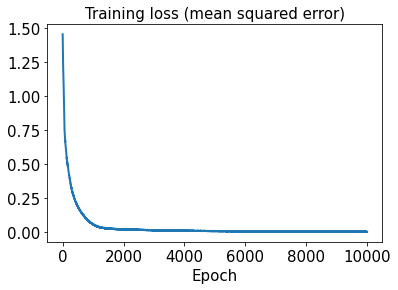

In [22]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

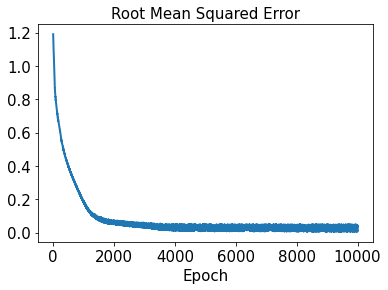

In [23]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [24]:
input_data = tf.keras.Input(shape=(n_sensors, 1))
reshape = tf.keras.layers.Reshape((n_sensors,))(input_data)

x_ = tf.keras.layers.Dense(units=128, activation='relu', name='firstHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='secondHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='thirdHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=101*101, activation=None, name='outputLayer')(x_)
output_img = tf.keras.layers.Reshape((101,101))(output_data)
# Shallow Decoder (SD)
sd1 = tf.keras.Model(input_data, output_img)
sd2 = tf.keras.Model(input_data, output_img)
sd3 = tf.keras.Model(input_data, output_img)

In [25]:
sd1.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 16, 1)]           0         
                                                                 
 reshape_2 (Reshape)         (None, 16)                0         
                                                                 
 firstHiddenLayer (Dense)    (None, 128)               2176      
                                                                 
 batch_normalization_3 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 secondHiddenLayer (Dense)   (None, 128)               16512     
                                                                 
 batch_normalization_4 (Batc  (None, 128)              512       
 hNormalization)                                           

In [26]:
sd1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [27]:
start1 = datetime.datetime.now()
history1 = sd1.fit(x_train1, y_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 17ms/step - loss: 0.5266 - rmse: 0.4950
Epoch 2/10000
2/2 [==============================] - 0s 29ms/step - loss: 0.5212 - rmse: 0.4904
Epoch 3/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5165 - rmse: 0.4867
Epoch 4/10000
2/2 [==============================] - 0s 25ms/step - loss: 0.5119 - rmse: 0.4830
Epoch 5/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.5079 - rmse: 0.4799
Epoch 6/10000
2/2 [==============================] - 0s 34ms/step - loss: 0.5039 - rmse: 0.4767
Epoch 7/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5006 - rmse: 0.4743
Epoch 8/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4976 - rmse: 0.4722
Epoch 9/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4937 - rmse: 0.4691
Epoch 10/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4905 - rmse: 0.4668
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 7ms/step - loss: 0.3924 - rmse: 0.4319
Epoch 87/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3911 - rmse: 0.4314
Epoch 88/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3902 - rmse: 0.4312
Epoch 89/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3889 - rmse: 0.4305
Epoch 90/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3901 - rmse: 0.4328
Epoch 91/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3872 - rmse: 0.4303
Epoch 92/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3870 - rmse: 0.4309
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3845 - rmse: 0.4288
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3833 - rmse: 0.4283
Epoch 95/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3821 - rmse: 0.4278
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 9ms/step - loss: 0.2782 - rmse: 0.3557
Epoch 171/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2761 - rmse: 0.3535
Epoch 172/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2746 - rmse: 0.3520
Epoch 173/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2735 - rmse: 0.3512
Epoch 174/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2733 - rmse: 0.3518
Epoch 175/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2700 - rmse: 0.3477
Epoch 176/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2680 - rmse: 0.3456
Epoch 177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2663 - rmse: 0.3439
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2657 - rmse: 0.3437
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2627 - rmse: 0.3401
Epoch 180/10000
2/2 [====================

2/2 [==============================] - 0s 8ms/step - loss: 0.1533 - rmse: 0.1984
Epoch 255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1514 - rmse: 0.1947
Epoch 256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1510 - rmse: 0.1945
Epoch 257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1500 - rmse: 0.1929
Epoch 258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1486 - rmse: 0.1902
Epoch 259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1486 - rmse: 0.1913
Epoch 260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1483 - rmse: 0.1914
Epoch 261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1456 - rmse: 0.1853
Epoch 262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1448 - rmse: 0.1839
Epoch 263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1444 - rmse: 0.1839
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0944 - rmse: 0.0817
Epoch 339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0929 - rmse: 0.0740
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0925 - rmse: 0.0730
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0923 - rmse: 0.0729
Epoch 342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0918 - rmse: 0.0716
Epoch 343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0918 - rmse: 0.0736
Epoch 344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0919 - rmse: 0.0755
Epoch 345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0908 - rmse: 0.0697
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0915 - rmse: 0.0762
Epoch 347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0899 - rmse: 0.0670
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0702 - rmse: 0.0363
Epoch 423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0698 - rmse: 0.0330
Epoch 424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0699 - rmse: 0.0370
Epoch 425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0699 - rmse: 0.0387
Epoch 426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0699 - rmse: 0.0419
Epoch 427/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0693 - rmse: 0.0365
Epoch 428/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0690 - rmse: 0.0355
Epoch 429/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0695 - rmse: 0.0438
Epoch 430/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0692 - rmse: 0.0422
Epoch 431/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0683 - rmse: 0.0336
Epoch 432/10000
2/2 [=====================

2/2 [==============================] - 0s 7ms/step - loss: 0.0572 - rmse: 0.0454
Epoch 507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0554 - rmse: 0.0201
Epoch 508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0554 - rmse: 0.0243
Epoch 509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0554 - rmse: 0.0271
Epoch 510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0550 - rmse: 0.0206
Epoch 511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0557 - rmse: 0.0361
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0555 - rmse: 0.0351
Epoch 513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0551 - rmse: 0.0307
Epoch 514/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0545 - rmse: 0.0219
Epoch 515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0542 - rmse: 0.0192
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 10ms/step - loss: 0.0456 - rmse: 0.0299
Epoch 591/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0456 - rmse: 0.0322
Epoch 592/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0459 - rmse: 0.0377
Epoch 593/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0447 - rmse: 0.0174
Epoch 594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0448 - rmse: 0.0228
Epoch 595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0450 - rmse: 0.0282
Epoch 596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0444 - rmse: 0.0171
Epoch 597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0446 - rmse: 0.0246
Epoch 598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0454 - rmse: 0.0390
Epoch 599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0444 - rmse: 0.0254
Epoch 600/10000
2/2 [======================

2/2 [==============================] - 0s 7ms/step - loss: 0.0383 - rmse: 0.0373
Epoch 675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0374 - rmse: 0.0234
Epoch 676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0373 - rmse: 0.0230
Epoch 677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0379 - rmse: 0.0349
Epoch 678/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0374 - rmse: 0.0284
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0368 - rmse: 0.0177
Epoch 680/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0389 - rmse: 0.0495
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0372 - rmse: 0.0292
Epoch 682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0365 - rmse: 0.0137
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0365 - rmse: 0.0159
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0317 - rmse: 0.0245
Epoch 759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0317 - rmse: 0.0257
Epoch 760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0319 - rmse: 0.0305
Epoch 761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0315 - rmse: 0.0242
Epoch 762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0330 - rmse: 0.0463
Epoch 763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0320 - rmse: 0.0338
Epoch 764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0316 - rmse: 0.0292
Epoch 765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0313 - rmse: 0.0242
Epoch 766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0319 - rmse: 0.0352
Epoch 767/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0313 - rmse: 0.0271
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 11ms/step - loss: 0.0269 - rmse: 0.0177
Epoch 843/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0267 - rmse: 0.0125
Epoch 844/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0271 - rmse: 0.0239
Epoch 845/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0266 - rmse: 0.0124
Epoch 846/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0278 - rmse: 0.0373
Epoch 847/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0267 - rmse: 0.0191
Epoch 848/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0272 - rmse: 0.0293
Epoch 849/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0264 - rmse: 0.0121
Epoch 850/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0273 - rmse: 0.0330
Epoch 851/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0267 - rmse: 0.0219
Epoch 852/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0235 - rmse: 0.0130
Epoch 927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0240 - rmse: 0.0278
Epoch 928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0237 - rmse: 0.0210
Epoch 929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0233 - rmse: 0.0105
Epoch 930/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0253 - rmse: 0.0469
Epoch 931/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0234 - rmse: 0.0179
Epoch 932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0239 - rmse: 0.0293
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0235 - rmse: 0.0208
Epoch 934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0239 - rmse: 0.0300
Epoch 935/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0239 - rmse: 0.0306
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 10ms/step - loss: 0.0211 - rmse: 0.0221
Epoch 1011/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0215 - rmse: 0.0310
Epoch 1012/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0208 - rmse: 0.0183
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0207 - rmse: 0.0150
Epoch 1014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0210 - rmse: 0.0238
Epoch 1015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0206 - rmse: 0.0129
Epoch 1016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0214 - rmse: 0.0322
Epoch 1017/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0205 - rmse: 0.0104
Epoch 1018/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0207 - rmse: 0.0192
Epoch 1019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0204 - rmse: 0.0119
Epoch 1020/10000
2/2 [=============

2/2 [==============================] - 0s 7ms/step - loss: 0.0185 - rmse: 0.0141
Epoch 1094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0193 - rmse: 0.0311
Epoch 1095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0205 - rmse: 0.0470
Epoch 1096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0184 - rmse: 0.0108
Epoch 1097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0186 - rmse: 0.0188
Epoch 1098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0201 - rmse: 0.0436
Epoch 1099/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0183 - rmse: 0.0110
Epoch 1100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0186 - rmse: 0.0215
Epoch 1101/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0185 - rmse: 0.0194
Epoch 1102/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0191 - rmse: 0.0320
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0175 - rmse: 0.0325
Epoch 1177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0181 - rmse: 0.0414
Epoch 1178/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0166 - rmse: 0.0123
Epoch 1179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0166 - rmse: 0.0131
Epoch 1180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0168 - rmse: 0.0199
Epoch 1181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0167 - rmse: 0.0201
Epoch 1182/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0173 - rmse: 0.0306
Epoch 1183/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0174 - rmse: 0.0328
Epoch 1184/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0170 - rmse: 0.0269
Epoch 1185/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0165 - rmse: 0.0167
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0153 - rmse: 0.0208
Epoch 1260/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0149 - rmse: 0.0113
Epoch 1261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0156 - rmse: 0.0292
Epoch 1262/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0152 - rmse: 0.0206
Epoch 1263/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0151 - rmse: 0.0184
Epoch 1264/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0152 - rmse: 0.0214
Epoch 1265/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0160 - rmse: 0.0356
Epoch 1266/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0150 - rmse: 0.0175
Epoch 1267/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0150 - rmse: 0.0175
Epoch 1268/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0155 - rmse: 0.0289
Epoch 1269/10000
2/2 [=====

2/2 [==============================] - 0s 7ms/step - loss: 0.0138 - rmse: 0.0186
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0146 - rmse: 0.0344
Epoch 1344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0137 - rmse: 0.0173
Epoch 1345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0143 - rmse: 0.0303
Epoch 1346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0139 - rmse: 0.0241
Epoch 1347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0141 - rmse: 0.0271
Epoch 1348/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0145 - rmse: 0.0346
Epoch 1349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0144 - rmse: 0.0333
Epoch 1350/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0152 - rmse: 0.0434
Epoch 1351/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0137 - rmse: 0.0208
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0125 - rmse: 0.0186
Epoch 1426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0125 - rmse: 0.0180
Epoch 1427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0130 - rmse: 0.0296
Epoch 1428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0130 - rmse: 0.0298
Epoch 1429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0129 - rmse: 0.0284
Epoch 1430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0135 - rmse: 0.0378
Epoch 1431/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0133 - rmse: 0.0340
Epoch 1432/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0126 - rmse: 0.0234
Epoch 1433/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0147 - rmse: 0.0511
Epoch 1434/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0124 - rmse: 0.0193
Epoch 1435/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0124 - rmse: 0.0361
Epoch 1509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0131 - rmse: 0.0450
Epoch 1510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0113 - rmse: 0.0160
Epoch 1511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0119 - rmse: 0.0290
Epoch 1512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0118 - rmse: 0.0271
Epoch 1513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0117 - rmse: 0.0261
Epoch 1514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0112 - rmse: 0.0125
Epoch 1515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0119 - rmse: 0.0301
Epoch 1516/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0119 - rmse: 0.0303
Epoch 1517/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0129 - rmse: 0.0443
Epoch 1518/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0103 - rmse: 0.0155
Epoch 1592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0113 - rmse: 0.0355
Epoch 1593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0121 - rmse: 0.0450
Epoch 1594/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0106 - rmse: 0.0224
Epoch 1595/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.0196
Epoch 1596/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0105 - rmse: 0.0223
Epoch 1597/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0121 - rmse: 0.0460
Epoch 1598/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0103 - rmse: 0.0168
Epoch 1599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0103 - rmse: 0.0181
Epoch 1600/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0108 - rmse: 0.0281
Epoch 1601/10000
2/2 [==============

2/2 [==============================] - 0s 10ms/step - loss: 0.0094 - rmse: 0.0157
Epoch 1675/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0098 - rmse: 0.0238
Epoch 1676/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0111 - rmse: 0.0444
Epoch 1677/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0231
Epoch 1678/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0192
Epoch 1679/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0286
Epoch 1680/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0289
Epoch 1681/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0253
Epoch 1682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0113 - rmse: 0.0464
Epoch 1683/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0180
Epoch 1684/10000
2/2 [=============

2/2 [==============================] - 0s 8ms/step - loss: 0.0091 - rmse: 0.0261
Epoch 1758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0302
Epoch 1759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0241
Epoch 1760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0128
Epoch 1761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0176
Epoch 1762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0092 - rmse: 0.0296
Epoch 1763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0261
Epoch 1764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0108
Epoch 1765/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0245
Epoch 1766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0334
Epoch 1767/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0127
Epoch 1841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0291
Epoch 1842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0090 - rmse: 0.0367
Epoch 1843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0262
Epoch 1844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0306
Epoch 1845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0249
Epoch 1846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0228
Epoch 1847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0264
Epoch 1848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0267
Epoch 1849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0263
Epoch 1850/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 0.0074 - rmse: 0.0221
Epoch 1924/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0403
Epoch 1925/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0072 - rmse: 0.0168
Epoch 1926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0294
Epoch 1927/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0073 - rmse: 0.0196
Epoch 1928/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0074 - rmse: 0.0224
Epoch 1929/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0071 - rmse: 0.0122
Epoch 1930/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0146
Epoch 1931/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0434
Epoch 1932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0188
Epoch 1933/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0352
Epoch 2007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0329
Epoch 2008/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0195
Epoch 2009/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0410
Epoch 2010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0254
Epoch 2011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0199
Epoch 2012/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0305
Epoch 2013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0235
Epoch 2014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0460
Epoch 2015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0264
Epoch 2016/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0087
Epoch 2090/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0240
Epoch 2091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0401
Epoch 2092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0292
Epoch 2093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0150
Epoch 2094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0126
Epoch 2095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0315
Epoch 2096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0157
Epoch 2097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0155
Epoch 2098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0088
Epoch 2099/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0254
Epoch 2173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0334
Epoch 2174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0270
Epoch 2175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0210
Epoch 2176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0319
Epoch 2177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0240
Epoch 2178/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0209
Epoch 2179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0375
Epoch 2180/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0427
Epoch 2181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0259
Epoch 2182/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0287
Epoch 2256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0284
Epoch 2257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0184
Epoch 2258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0295
Epoch 2259/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0197
Epoch 2260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0097
Epoch 2261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0250
Epoch 2262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0202
Epoch 2263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0433
Epoch 2264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0205
Epoch 2265/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0241
Epoch 2339/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0315
Epoch 2340/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0281
Epoch 2341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0212
Epoch 2342/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0185
Epoch 2343/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0117
Epoch 2344/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0208
Epoch 2345/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0125
Epoch 2346/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0102
Epoch 2347/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0245
Epoch 2348/10000
2/2 [======

2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0122
Epoch 2422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0329
Epoch 2423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0129
Epoch 2424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0120
Epoch 2425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0115
Epoch 2426/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0110
Epoch 2427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0220
Epoch 2428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0178
Epoch 2429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0110
Epoch 2430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0105
Epoch 2431/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0461
Epoch 2505/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0275
Epoch 2506/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0323
Epoch 2507/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0190
Epoch 2508/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0265
Epoch 2509/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0310
Epoch 2510/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0144
Epoch 2511/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0177
Epoch 2512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0407
Epoch 2513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0089
Epoch 2514/10000
2/2 [==========

2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0116
Epoch 2588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0107
Epoch 2589/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0183
Epoch 2590/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0270
Epoch 2591/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0164
Epoch 2592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0294
Epoch 2593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0218
Epoch 2594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0122
Epoch 2595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0224
Epoch 2596/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0279
Epoch 2597/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0262
Epoch 2671/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0078
Epoch 2672/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0161
Epoch 2673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0250
Epoch 2674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0308
Epoch 2675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0088
Epoch 2676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0153
Epoch 2677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0267
Epoch 2678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0126
Epoch 2679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0153
Epoch 2680/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0211
Epoch 2754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0296
Epoch 2755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0486
Epoch 2756/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0345
Epoch 2757/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0259
Epoch 2758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0150
Epoch 2759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0262
Epoch 2760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0303
Epoch 2761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0232
Epoch 2762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0245
Epoch 2763/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0193
Epoch 2837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0203
Epoch 2838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0071
Epoch 2839/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0322
Epoch 2840/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0368
Epoch 2841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0160
Epoch 2842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0183
Epoch 2843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0110
Epoch 2844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0094
Epoch 2845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0082
Epoch 2846/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0435
Epoch 2920/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0126
Epoch 2921/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0251
Epoch 2922/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0241
Epoch 2923/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0223
Epoch 2924/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0192
Epoch 2925/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0295
Epoch 2926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0191
Epoch 2927/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0401
Epoch 2928/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0286
Epoch 2929/10000
2/2 [=====

2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0336
Epoch 3003/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0182
Epoch 3004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0159
Epoch 3005/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0164
Epoch 3006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0194
Epoch 3007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0163
Epoch 3008/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0282
Epoch 3009/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0259
Epoch 3010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0103
Epoch 3011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0248
Epoch 3012/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0318
Epoch 3086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0118
Epoch 3087/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0314
Epoch 3088/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0166
Epoch 3089/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0238
Epoch 3090/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0181
Epoch 3091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0101
Epoch 3092/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0172
Epoch 3093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0240
Epoch 3094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0326
Epoch 3095/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0230
Epoch 3169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0373
Epoch 3170/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0302
Epoch 3171/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0086
Epoch 3172/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0247
Epoch 3173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0168
Epoch 3174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0124
Epoch 3175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0088
Epoch 3176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0209
Epoch 3177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0174
Epoch 3178/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0261
Epoch 3252/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0309
Epoch 3253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0231
Epoch 3254/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0208
Epoch 3255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0272
Epoch 3256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0098
Epoch 3257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0183
Epoch 3258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0338
Epoch 3259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0278
Epoch 3260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0269
Epoch 3261/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0306
Epoch 3335/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0068
Epoch 3336/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0082
Epoch 3337/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0238
Epoch 3338/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0127
Epoch 3339/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0154
Epoch 3340/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0127
Epoch 3341/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0157
Epoch 3342/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0285
Epoch 3343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0091
Epoch 3344/10000
2/2 [=====

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0378
Epoch 3418/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0291
Epoch 3419/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0272
Epoch 3420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0210
Epoch 3421/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0212
Epoch 3422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0231
Epoch 3423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0225
Epoch 3424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0299
Epoch 3425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0316
Epoch 3426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0213
Epoch 3427/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0297
Epoch 3501/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0286
Epoch 3502/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0221
Epoch 3503/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0294
Epoch 3504/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0140
Epoch 3505/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0310
Epoch 3506/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0167
Epoch 3507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0159
Epoch 3508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0231
Epoch 3509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0102
Epoch 3510/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0155
Epoch 3584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0136
Epoch 3585/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8502e-04 - rmse: 0.0084
Epoch 3586/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0167
Epoch 3587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0399
Epoch 3588/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9767e-04 - rmse: 0.0093
Epoch 3589/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9478e-04 - rmse: 0.0092
Epoch 3590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0460
Epoch 3591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0198
Epoch 3592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0281
Epoch 3593/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 8.8055e-04 - rmse: 0.0070
Epoch 3667/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9276e-04 - rmse: 0.0079
Epoch 3668/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4849e-04 - rmse: 0.0109
Epoch 3669/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2135e-04 - rmse: 0.0097
Epoch 3670/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0185
Epoch 3671/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0224
Epoch 3672/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7165e-04 - rmse: 0.0121
Epoch 3673/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0320
Epoch 3674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0270
Epoch 3675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0271
Epoch 3676/10000


2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0458
Epoch 3749/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0456
Epoch 3750/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0326
Epoch 3751/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0304
Epoch 3752/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5156e-04 - rmse: 0.0142
Epoch 3753/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0206
Epoch 3754/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0251
Epoch 3755/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.3820e-04 - rmse: 0.0138
Epoch 3756/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0274
Epoch 3757/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0192
Epoch 3758/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0393
Epoch 3831/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0329
Epoch 3832/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0308
Epoch 3833/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9026e-04 - rmse: 0.0175
Epoch 3834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0463
Epoch 3835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0206
Epoch 3836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0222
Epoch 3837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0269
Epoch 3838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0372
Epoch 3839/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9926e-04 - rmse: 0.0179
Epoch 3840/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 7.3691e-04 - rmse: 0.0107
Epoch 3913/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0199
Epoch 3914/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0214
Epoch 3915/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1438e-04 - rmse: 0.0171
Epoch 3916/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0224
Epoch 3917/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0246
Epoch 3918/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3154e-04 - rmse: 0.0177
Epoch 3919/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0403
Epoch 3920/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5750e-04 - rmse: 0.0184
Epoch 3921/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0324
Epoch 3922/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0302
Epoch 3995/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7634e-04 - rmse: 0.0176
Epoch 3996/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0383
Epoch 3997/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0331
Epoch 3998/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0322
Epoch 3999/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7613e-04 - rmse: 0.0146
Epoch 4000/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9431e-04 - rmse: 0.0115
Epoch 4001/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0289
Epoch 4002/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6465e-04 - rmse: 0.0201
Epoch 4003/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2464e-04 - rmse: 0.0128
Epoch 4004/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0226
Epoch 4076/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0320
Epoch 4077/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7233e-04 - rmse: 0.0160
Epoch 4078/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0288
Epoch 4079/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3858e-04 - rmse: 0.0206
Epoch 4080/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0263
Epoch 4081/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6857e-04 - rmse: 0.0074
Epoch 4082/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0321
Epoch 4083/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5768e-04 - rmse: 0.0157
Epoch 4084/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8479e-04 - rmse: 0.0086
Epoch 4085/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0344
Epoch 4158/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8173e-04 - rmse: 0.0106
Epoch 4159/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6033e-04 - rmse: 0.0170
Epoch 4160/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0474
Epoch 4161/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0321
Epoch 4162/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4988e-04 - rmse: 0.0090
Epoch 4163/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9527e-04 - rmse: 0.0113
Epoch 4164/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2874e-04 - rmse: 0.0215
Epoch 4165/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.3527e-04 - rmse: 0.0083
Epoch 4166/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0286
Epoch 4167

2/2 [==============================] - 0s 8ms/step - loss: 7.5727e-04 - rmse: 0.0181
Epoch 4239/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7743e-04 - rmse: 0.0187
Epoch 4240/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0276
Epoch 4241/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0247
Epoch 4242/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1526e-04 - rmse: 0.0137
Epoch 4243/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0343
Epoch 4244/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6444e-04 - rmse: 0.0184
Epoch 4245/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3540e-04 - rmse: 0.0202
Epoch 4246/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4903e-04 - rmse: 0.0206
Epoch 4247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0296
Epoch 4248/10

2/2 [==============================] - 0s 10ms/step - loss: 5.8724e-04 - rmse: 0.0140
Epoch 4321/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0269
Epoch 4322/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6360e-04 - rmse: 0.0193
Epoch 4323/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0296
Epoch 4324/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0288
Epoch 4325/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5994e-04 - rmse: 0.0085
Epoch 4326/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0400
Epoch 4327/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4514e-04 - rmse: 0.0189
Epoch 4328/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2890e-04 - rmse: 0.0119
Epoch 4329/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0298
Epoch 4330/1000

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0280
Epoch 4403/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0395
Epoch 4404/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0306
Epoch 4405/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0332
Epoch 4406/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1871e-04 - rmse: 0.0163
Epoch 4407/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4279e-04 - rmse: 0.0243
Epoch 4408/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0445
Epoch 4409/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3982e-04 - rmse: 0.0170
Epoch 4410/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3097e-04 - rmse: 0.0134
Epoch 4411/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8818e-04 - rmse: 0.0154
Epoch 4412/10000


2/2 [==============================] - 0s 8ms/step - loss: 7.3679e-04 - rmse: 0.0204
Epoch 4484/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8203e-04 - rmse: 0.0161
Epoch 4485/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2668e-04 - rmse: 0.0225
Epoch 4486/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3161e-04 - rmse: 0.0176
Epoch 4487/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0326
Epoch 4488/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0277
Epoch 4489/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2834e-04 - rmse: 0.0247
Epoch 4490/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0334
Epoch 4491/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0280
Epoch 4492/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0435
Epoch 4493/10000


2/2 [==============================] - 0s 8ms/step - loss: 4.1536e-04 - rmse: 0.0111
Epoch 4565/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0296
Epoch 4566/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0395
Epoch 4567/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6304e-04 - rmse: 0.0085
Epoch 4568/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0462e-04 - rmse: 0.0107
Epoch 4569/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7600e-04 - rmse: 0.0093
Epoch 4570/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0270
Epoch 4571/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0309
Epoch 4572/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0432
Epoch 4573/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8361e-04 - rmse: 0.0244
Epoch 4574/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0365
Epoch 4646/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3200e-04 - rmse: 0.0216
Epoch 4647/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0311
Epoch 4648/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8545e-04 - rmse: 0.0250
Epoch 4649/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0321
Epoch 4650/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3660e-04 - rmse: 0.0194
Epoch 4651/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0314
Epoch 4652/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0085e-04 - rmse: 0.0155
Epoch 4653/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6800e-04 - rmse: 0.0175
Epoch 4654/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0308
Epoch 4655/10000


2/2 [==============================] - 0s 10ms/step - loss: 3.8278e-04 - rmse: 0.0120
Epoch 4727/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0316
Epoch 4728/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.0108e-04 - rmse: 0.0258
Epoch 4729/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.0575e-04 - rmse: 0.0238
Epoch 4730/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0277
Epoch 4731/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.6129e-04 - rmse: 0.0269
Epoch 4732/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0324
Epoch 4733/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6612e-04 - rmse: 0.0182
Epoch 4734/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0294
Epoch 4735/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0350
Epoch 4

2/2 [==============================] - 0s 9ms/step - loss: 5.4990e-04 - rmse: 0.0183
Epoch 4808/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1074e-04 - rmse: 0.0098
Epoch 4809/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0313
Epoch 4810/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0293
Epoch 4811/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9125e-04 - rmse: 0.0166
Epoch 4812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0424
Epoch 4813/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0316
Epoch 4814/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6020e-04 - rmse: 0.0254
Epoch 4815/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2274e-04 - rmse: 0.0266
Epoch 4816/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5858e-04 - rmse: 0.0157
Epoch 4817/10

2/2 [==============================] - 0s 7ms/step - loss: 3.5709e-04 - rmse: 0.0128
Epoch 4889/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4808e-04 - rmse: 0.0124
Epoch 4890/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4937e-04 - rmse: 0.0125
Epoch 4891/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0293
Epoch 4892/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3491e-04 - rmse: 0.0253
Epoch 4893/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2739e-04 - rmse: 0.0116
Epoch 4894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0288
Epoch 4895/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0240e-04 - rmse: 0.0145
Epoch 4896/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0383
Epoch 4897/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5197e-04 - rmse: 0.0276
Epoch 489

2/2 [==============================] - 0s 7ms/step - loss: 2.1920e-04 - rmse: 0.0067
Epoch 4970/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6870e-04 - rmse: 0.0097
Epoch 4971/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7329e-04 - rmse: 0.0173
Epoch 4972/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7905e-04 - rmse: 0.0225
Epoch 4973/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0325
Epoch 4974/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0326
Epoch 4975/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8554e-04 - rmse: 0.0106
Epoch 4976/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0154e-04 - rmse: 0.0181
Epoch 4977/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1294e-04 - rmse: 0.0272
Epoch 4978/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7430e-04 - rmse: 0.0142
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0375
Epoch 5051/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8718e-04 - rmse: 0.0114
Epoch 5052/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3649e-04 - rmse: 0.0134
Epoch 5053/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1330e-04 - rmse: 0.0214
Epoch 5054/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8109e-04 - rmse: 0.0112
Epoch 5055/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4866e-04 - rmse: 0.0096
Epoch 5056/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0354e-04 - rmse: 0.0157
Epoch 5057/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2814e-04 - rmse: 0.0131
Epoch 5058/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0433
Epoch 5059/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1338e-04 - rmse: 0.0236
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 2.5214e-04 - rmse: 0.0105
Epoch 5132/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0318
Epoch 5133/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2377e-04 - rmse: 0.0241
Epoch 5134/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1471e-04 - rmse: 0.0193
Epoch 5135/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0329
Epoch 5136/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6042e-04 - rmse: 0.0179
Epoch 5137/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4511e-04 - rmse: 0.0225
Epoch 5138/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5433e-04 - rmse: 0.0248
Epoch 5139/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8874e-04 - rmse: 0.0187
Epoch 5140/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0477
Epoch 514

2/2 [==============================] - 0s 8ms/step - loss: 2.1490e-04 - rmse: 0.0094
Epoch 5213/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6434e-04 - rmse: 0.0117
Epoch 5214/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4035e-04 - rmse: 0.0203
Epoch 5215/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7799e-04 - rmse: 0.0188
Epoch 5216/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5983e-04 - rmse: 0.0116
Epoch 5217/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0852e-04 - rmse: 0.0220
Epoch 5218/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0300
Epoch 5219/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6262e-04 - rmse: 0.0117
Epoch 5220/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0338
Epoch 5221/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6203e-04 - rmse: 0.0154
Epoch

2/2 [==============================] - 0s 10ms/step - loss: 2.8291e-04 - rmse: 0.0130
Epoch 5293/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0379
Epoch 5294/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5102e-04 - rmse: 0.0253
Epoch 5295/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2595e-04 - rmse: 0.0267
Epoch 5296/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.1419e-04 - rmse: 0.0142
Epoch 5297/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9430e-04 - rmse: 0.0280
Epoch 5298/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0470
Epoch 5299/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.1498e-04 - rmse: 0.0142
Epoch 5300/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9362e-04 - rmse: 0.0219
Epoch 5301/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.4919e-04 - rmse: 0.0

2/2 [==============================] - 0s 7ms/step - loss: 4.7138e-04 - rmse: 0.0192
Epoch 5374/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7344e-04 - rmse: 0.0084
Epoch 5375/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6560e-04 - rmse: 0.0215
Epoch 5376/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3311e-04 - rmse: 0.0230
Epoch 5377/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4117e-04 - rmse: 0.0210
Epoch 5378/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9140e-04 - rmse: 0.0095
Epoch 5379/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8794e-04 - rmse: 0.0169
Epoch 5380/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5155e-04 - rmse: 0.0071
Epoch 5381/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8864e-04 - rmse: 0.0242
Epoch 5382/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0316
E

2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0398
Epoch 5454/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0312
Epoch 5455/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4774e-04 - rmse: 0.0256
Epoch 5456/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2896e-04 - rmse: 0.0209
Epoch 5457/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8803e-04 - rmse: 0.0282
Epoch 5458/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8075e-04 - rmse: 0.0198
Epoch 5459/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4098e-04 - rmse: 0.0071
Epoch 5460/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0305
Epoch 5461/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.5555e-04 - rmse: 0.0258
Epoch 5462/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6363e-04 - rmse: 0.0260
Epoch 546

2/2 [==============================] - 0s 7ms/step - loss: 8.9763e-04 - rmse: 0.0286
Epoch 5535/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7534e-04 - rmse: 0.0172
Epoch 5536/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5046e-04 - rmse: 0.0130
Epoch 5537/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.2737e-04 - rmse: 0.0121
Epoch 5538/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3326e-04 - rmse: 0.0235
Epoch 5539/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7069e-04 - rmse: 0.0263
Epoch 5540/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2037e-04 - rmse: 0.0118
Epoch 5541/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1264e-04 - rmse: 0.0288
Epoch 5542/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1187e-04 - rmse: 0.0152
Epoch 5543/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0330
E

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0426
Epoch 5616/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1941e-04 - rmse: 0.0186
Epoch 5617/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1097e-04 - rmse: 0.0118
Epoch 5618/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0676e-04 - rmse: 0.0059
Epoch 5619/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2149e-04 - rmse: 0.0070
Epoch 5620/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5645e-04 - rmse: 0.0242
Epoch 5621/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7030e-04 - rmse: 0.0099
Epoch 5622/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1634e-04 - rmse: 0.0067
Epoch 5623/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0318
Epoch 5624/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 562

2/2 [==============================] - 0s 7ms/step - loss: 4.6759e-04 - rmse: 0.0201
Epoch 5697/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1584e-04 - rmse: 0.0072
Epoch 5698/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6246e-04 - rmse: 0.0283
Epoch 5699/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0425
Epoch 5700/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.6370e-04 - rmse: 0.0283
Epoch 5701/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8236e-04 - rmse: 0.0109
Epoch 5702/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9227e-04 - rmse: 0.0181
Epoch 5703/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6856e-04 - rmse: 0.0175
Epoch 5704/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0319
Epoch 5705/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.3997e-04 - rmse: 0.0296
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 4.5030e-04 - rmse: 0.0198
Epoch 5778/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.7234e-04 - rmse: 0.0285
Epoch 5779/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8068e-04 - rmse: 0.0206
Epoch 5780/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1646e-04 - rmse: 0.0293
Epoch 5781/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0318
Epoch 5782/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8269e-05 - rmse: 0.0056
Epoch 5783/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7971e-04 - rmse: 0.0229
Epoch 5784/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.8558e-04 - rmse: 0.0207
Epoch 5785/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0224e-04 - rmse: 0.0067
Epoch 5786/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2490e-04 - rmse: 0.0192
E

2/2 [==============================] - 0s 7ms/step - loss: 3.8476e-04 - rmse: 0.0183
Epoch 5859/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9951e-04 - rmse: 0.0291
Epoch 5860/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1152e-04 - rmse: 0.0257
Epoch 5861/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 5862/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6343e-04 - rmse: 0.0106
Epoch 5863/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1446e-04 - rmse: 0.0128
Epoch 5864/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 5865/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 5866/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7827e-04 - rmse: 0.0151
Epoch 5867/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4963e-04 - rmse: 0.0141
Epoch 586

2/2 [==============================] - 0s 10ms/step - loss: 9.9778e-04 - rmse: 0.0309
Epoch 5940/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 5941/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4188e-04 - rmse: 0.0098
Epoch 5942/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2098e-04 - rmse: 0.0087
Epoch 5943/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1030e-04 - rmse: 0.0258
Epoch 5944/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1709e-04 - rmse: 0.0239
Epoch 5945/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3082e-04 - rmse: 0.0280
Epoch 5946/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3317e-04 - rmse: 0.0094
Epoch 5947/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5380e-04 - rmse: 0.0202
Epoch 5948/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5159e-04 - rmse: 0.01

2/2 [==============================] - 0s 8ms/step - loss: 1.8754e-04 - rmse: 0.0121
Epoch 6020/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1720e-04 - rmse: 0.0218
Epoch 6021/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 6022/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1329e-04 - rmse: 0.0193
Epoch 6023/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 6024/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2681e-04 - rmse: 0.0298
Epoch 6025/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 6026/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 6027/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6788e-04 - rmse: 0.0270
Epoch 6028/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5155e-04 - rmse: 0.0226
Epoch 6029/10

2/2 [==============================] - 0s 7ms/step - loss: 7.4026e-04 - rmse: 0.0265
Epoch 6100/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 6101/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4135e-04 - rmse: 0.0201
Epoch 6102/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8029e-04 - rmse: 0.0254
Epoch 6103/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2276e-04 - rmse: 0.0093
Epoch 6104/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8549e-04 - rmse: 0.0255
Epoch 6105/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 6106/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 6107/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9260e-04 - rmse: 0.0293
Epoch 6108/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9982e-04 - rmse: 0.0237
Epoch 610

2/2 [==============================] - 0s 8ms/step - loss: 1.2679e-04 - rmse: 0.0097
Epoch 6181/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0432e-04 - rmse: 0.0165
Epoch 6182/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1993e-04 - rmse: 0.0281
Epoch 6183/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8171e-04 - rmse: 0.0158
Epoch 6184/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5085e-05 - rmse: 0.0047
Epoch 6185/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4585e-04 - rmse: 0.0106
Epoch 6186/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9022e-04 - rmse: 0.0256
Epoch 6187/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1936e-04 - rmse: 0.0169
Epoch 6188/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8577e-04 - rmse: 0.0256
Epoch 6189/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8120e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 1.2900e-04 - rmse: 0.0100
Epoch 6261/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4340e-05 - rmse: 0.0080
Epoch 6262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 6263/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2338e-04 - rmse: 0.0097
Epoch 6264/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3262e-04 - rmse: 0.0101
Epoch 6265/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 6266/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4936e-04 - rmse: 0.0228
Epoch 6267/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6581e-04 - rmse: 0.0117
Epoch 6268/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6767e-04 - rmse: 0.0232
Epoch 6269/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4086e-04 - rmse: 0.0226
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 3.4673e-04 - rmse: 0.0179
Epoch 6341/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1215e-05 - rmse: 0.0080
Epoch 6342/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 6343/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0979e-04 - rmse: 0.0168
Epoch 6344/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.4006e-05 - rmse: 0.0069
Epoch 6345/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 6346/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2420e-04 - rmse: 0.0099
Epoch 6347/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.0249e-04 - rmse: 0.0087
Epoch 6348/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8016e-05 - rmse: 0.0085
Epoch 6349/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.3376e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 9.5967e-04 - rmse: 0.0306
Epoch 6421/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1358e-04 - rmse: 0.0281
Epoch 6422/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0814e-05 - rmse: 0.0068
Epoch 6423/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3534e-04 - rmse: 0.0203
Epoch 6424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 6425/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2196e-05 - rmse: 0.0070
Epoch 6426/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6617e-04 - rmse: 0.0210
Epoch 6427/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8516e-05 - rmse: 0.0059
Epoch 6428/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2906e-04 - rmse: 0.0266
Epoch 6429/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4927e-04 - rmse: 0.0250
E

2/2 [==============================] - 0s 11ms/step - loss: 7.4510e-04 - rmse: 0.0269
Epoch 6501/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1801e-04 - rmse: 0.0098
Epoch 6502/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 6503/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8540e-04 - rmse: 0.0162
Epoch 6504/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6274e-05 - rmse: 0.0022
Epoch 6505/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6314e-04 - rmse: 0.0307
Epoch 6506/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2020e-04 - rmse: 0.0099
Epoch 6507/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2676e-04 - rmse: 0.0201
Epoch 6508/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8555e-04 - rmse: 0.0163
Epoch 6509/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3520e-05 - rmse

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 6581/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3438e-04 - rmse: 0.0178
Epoch 6582/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0269e-04 - rmse: 0.0280
Epoch 6583/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9928e-04 - rmse: 0.0134
Epoch 6584/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1301e-04 - rmse: 0.0097
Epoch 6585/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7618e-04 - rmse: 0.0160
Epoch 6586/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0703e-05 - rmse: 0.0085
Epoch 6587/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4998e-04 - rmse: 0.0288
Epoch 6588/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7890e-04 - rmse: 0.0126
Epoch 6589/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6588e-04 - rmse: 0.0291
E

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 6662/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6663/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0029e-04 - rmse: 0.0091
Epoch 6664/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8016e-04 - rmse: 0.0276
Epoch 6665/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 6666/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1402e-04 - rmse: 0.0172
Epoch 6667/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 6668/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3829e-04 - rmse: 0.0228
Epoch 6669/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5836e-04 - rmse: 0.0155
Epoch 6670/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8853e-04 - rmse: 0.0217
Epoch 6671/10

2/2 [==============================] - 0s 8ms/step - loss: 2.9310e-04 - rmse: 0.0167
Epoch 6743/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 6744/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9399e-04 - rmse: 0.0240
Epoch 6745/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 6746/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6562e-04 - rmse: 0.0212
Epoch 6747/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7620e-04 - rmse: 0.0215
Epoch 6748/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3169e-04 - rmse: 0.0147
Epoch 6749/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 6750/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1717e-04 - rmse: 0.0265
Epoch 6751/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1103e-04 - rmse: 0.0172
Epoch 675

2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 6824/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 6825/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6155e-04 - rmse: 0.0254
Epoch 6826/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3970e-04 - rmse: 0.0229
Epoch 6827/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0029e-04 - rmse: 0.0197
Epoch 6828/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 6829/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5599e-04 - rmse: 0.0272
Epoch 6830/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8011e-04 - rmse: 0.0238
Epoch 6831/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 6832/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2182e-04 - rmse: 0.0225
Epoch 6833/10

2/2 [==============================] - 0s 9ms/step - loss: 4.8189e-05 - rmse: 0.0059
Epoch 6905/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 6906/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0945e-04 - rmse: 0.0264
Epoch 6907/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9588e-05 - rmse: 0.0088
Epoch 6908/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2991e-04 - rmse: 0.0204
Epoch 6909/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5906e-04 - rmse: 0.0254
Epoch 6910/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 6911/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5511e-04 - rmse: 0.0185
Epoch 6912/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9289e-04 - rmse: 0.0297
Epoch 6913/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0199e-04 - rmse: 0.0094
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 2.1156e-04 - rmse: 0.0141
Epoch 6985/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7190e-04 - rmse: 0.0276
Epoch 6986/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 6987/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7265e-04 - rmse: 0.0293
Epoch 6988/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0366e-04 - rmse: 0.0171
Epoch 6989/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5802e-04 - rmse: 0.0211
Epoch 6990/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4247e-04 - rmse: 0.0230
Epoch 6991/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6992/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8109e-04 - rmse: 0.0217
Epoch 6993/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6766e-05 - rmse: 0.0050
Epoch

2/2 [==============================] - 0s 13ms/step - loss: 9.4599e-04 - rmse: 0.0306
Epoch 7065/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 7066/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9114e-04 - rmse: 0.0279
Epoch 7067/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.8051e-04 - rmse: 0.0239
Epoch 7068/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2946e-04 - rmse: 0.0303
Epoch 7069/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.9776e-05 - rmse: 0.0044
Epoch 7070/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2116e-04 - rmse: 0.0176
Epoch 7071/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7548e-04 - rmse: 0.0128
Epoch 7072/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7950e-04 - rmse: 0.0277
Epoch 7073/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.

2/2 [==============================] - 0s 7ms/step - loss: 3.3187e-04 - rmse: 0.0179
Epoch 7145/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7822e-04 - rmse: 0.0130
Epoch 7146/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3111e-04 - rmse: 0.0179
Epoch 7147/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3249e-05 - rmse: 0.0080
Epoch 7148/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7242e-04 - rmse: 0.0237
Epoch 7149/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8572e-04 - rmse: 0.0194
Epoch 7150/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 7151/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9135e-04 - rmse: 0.0280
Epoch 7152/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7819e-04 - rmse: 0.0238
Epoch 7153/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1323e-04 - rmse: 0.0224
E

2/2 [==============================] - 0s 7ms/step - loss: 8.9239e-05 - rmse: 0.0090
Epoch 7225/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1204e-04 - rmse: 0.0102
Epoch 7226/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4032e-04 - rmse: 0.0251
Epoch 7227/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8680e-04 - rmse: 0.0279
Epoch 7228/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5165e-05 - rmse: 0.0087
Epoch 7229/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2004e-04 - rmse: 0.0176
Epoch 7230/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5399e-05 - rmse: 0.0041
Epoch 7231/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2463e-04 - rmse: 0.0147
Epoch 7232/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4248e-04 - rmse: 0.0252
Epoch 7233/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7733e-05 - rmse: 0.00

2/2 [==============================] - 0s 8ms/step - loss: 1.7686e-04 - rmse: 0.0130
Epoch 7305/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9435e-04 - rmse: 0.0314
Epoch 7306/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4784e-04 - rmse: 0.0118
Epoch 7307/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 7308/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 7309/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3405e-04 - rmse: 0.0112
Epoch 7310/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4762e-04 - rmse: 0.0307
Epoch 7311/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3333e-04 - rmse: 0.0304
Epoch 7312/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3753e-04 - rmse: 0.0251
Epoch 7313/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7025e-04 - rmse: 0.0237
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 3.3281e-04 - rmse: 0.0180
Epoch 7385/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4938e-04 - rmse: 0.0253
Epoch 7386/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4674e-04 - rmse: 0.0306
Epoch 7387/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4009e-05 - rmse: 0.0082
Epoch 7388/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 7389/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8157e-05 - rmse: 0.0090
Epoch 7390/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8184e-04 - rmse: 0.0296
Epoch 7391/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5644e-04 - rmse: 0.0308
Epoch 7392/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9396e-05 - rmse: 0.0057
Epoch 7393/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5317e-04 - rmse: 0.0308
E

2/2 [==============================] - 0s 11ms/step - loss: 1.8576e-04 - rmse: 0.0134
Epoch 7465/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.9404e-04 - rmse: 0.0137
Epoch 7466/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1537e-04 - rmse: 0.0301
Epoch 7467/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4716e-04 - rmse: 0.0210
Epoch 7468/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 7469/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 7470/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7471/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.9599e-04 - rmse: 0.0197
Epoch 7472/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5759e-05 - rmse: 0.0089
Epoch 7473/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9225e-04 - rmse: 0.0314

2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 7545/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4491e-04 - rmse: 0.0306
Epoch 7546/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8670e-04 - rmse: 0.0195
Epoch 7547/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0548e-04 - rmse: 0.0141
Epoch 7548/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 7549/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2702e-04 - rmse: 0.0149
Epoch 7550/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7342e-04 - rmse: 0.0129
Epoch 7551/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 7552/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3054e-04 - rmse: 0.0150
Epoch 7553/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2539e-04 - rmse: 0.0148
Epoch 755

2/2 [==============================] - 0s 10ms/step - loss: 9.9114e-04 - rmse: 0.0314
Epoch 7626/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4903e-04 - rmse: 0.0120
Epoch 7627/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0405
Epoch 7628/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.2561e-04 - rmse: 0.0228
Epoch 7629/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4572e-04 - rmse: 0.0155
Epoch 7630/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1042e-04 - rmse: 0.0102
Epoch 7631/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8472e-04 - rmse: 0.0195
Epoch 7632/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3178e-04 - rmse: 0.0112
Epoch 7633/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 7634/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8611e-04 - rmse: 0.016

2/2 [==============================] - 0s 7ms/step - loss: 9.7150e-04 - rmse: 0.0311
Epoch 7706/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1149e-05 - rmse: 0.0074
Epoch 7707/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 7708/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7014e-04 - rmse: 0.0163
Epoch 7709/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 7710/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 7711/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6614e-05 - rmse: 0.0084
Epoch 7712/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8166e-04 - rmse: 0.0194
Epoch 7713/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2896e-05 - rmse: 0.0093
Epoch 7714/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0614e-04 - rmse: 0.0224
Epoch 771

2/2 [==============================] - 0s 7ms/step - loss: 4.6093e-04 - rmse: 0.0213
Epoch 7786/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 7787/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3915e-04 - rmse: 0.0289
Epoch 7788/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6528e-04 - rmse: 0.0310
Epoch 7789/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8609e-04 - rmse: 0.0219
Epoch 7790/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7167e-04 - rmse: 0.0129
Epoch 7791/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 7792/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5987e-04 - rmse: 0.0275
Epoch 7793/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0737e-04 - rmse: 0.0101
Epoch 7794/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5680e-04 - rmse: 0.0292
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 4.0771e-04 - rmse: 0.0201
Epoch 7867/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0624e-04 - rmse: 0.0200
Epoch 7868/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8360e-05 - rmse: 0.0079
Epoch 7869/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 7870/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4102e-04 - rmse: 0.0252
Epoch 7871/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4169e-04 - rmse: 0.0183
Epoch 7872/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6721e-05 - rmse: 0.0078
Epoch 7873/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6912e-04 - rmse: 0.0215
Epoch 7874/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0655e-04 - rmse: 0.0101
Epoch 7875/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0760e-04 - rmse: 0.0101
E

2/2 [==============================] - 0s 7ms/step - loss: 4.6722e-04 - rmse: 0.0215
Epoch 7947/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2417e-04 - rmse: 0.0228
Epoch 7948/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4039e-04 - rmse: 0.0153
Epoch 7949/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9451e-04 - rmse: 0.0138
Epoch 7950/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3127e-04 - rmse: 0.0206
Epoch 7951/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5703e-04 - rmse: 0.0159
Epoch 7952/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 7953/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4572e-04 - rmse: 0.0253
Epoch 7954/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7608e-04 - rmse: 0.0131
Epoch 7955/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0451
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 4.3042e-05 - rmse: 0.0062
Epoch 8027/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0423e-04 - rmse: 0.0200
Epoch 8028/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6507e-04 - rmse: 0.0293
Epoch 8029/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9727e-05 - rmse: 0.0067
Epoch 8030/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5037e-05 - rmse: 0.0045
Epoch 8031/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 8032/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.2944e-04 - rmse: 0.0304
Epoch 8033/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4088e-04 - rmse: 0.0154
Epoch 8034/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.3754e-04 - rmse: 0.0252
Epoch 8035/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.3276e-05 - rmse: 

2/2 [==============================] - 0s 7ms/step - loss: 8.9713e-04 - rmse: 0.0299
Epoch 8107/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8100e-05 - rmse: 0.0086
Epoch 8108/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2979e-04 - rmse: 0.0180
Epoch 8109/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2323e-05 - rmse: 0.0094
Epoch 8110/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4692e-04 - rmse: 0.0156
Epoch 8111/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9664e-04 - rmse: 0.0171
Epoch 8112/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8852e-05 - rmse: 0.0092
Epoch 8113/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7677e-04 - rmse: 0.0131
Epoch 8114/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9974e-04 - rmse: 0.0172
Epoch 8115/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5026e-04 - rmse: 0.02

Epoch 8187/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9898e-04 - rmse: 0.0282
Epoch 8188/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5245e-04 - rmse: 0.0157
Epoch 8189/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5450e-04 - rmse: 0.0212
Epoch 8190/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7809e-04 - rmse: 0.0239
Epoch 8191/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3508e-05 - rmse: 0.0054
Epoch 8192/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1852e-04 - rmse: 0.0203
Epoch 8193/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9003e-04 - rmse: 0.0196
Epoch 8194/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2389e-04 - rmse: 0.0179
Epoch 8195/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9254e-05 - rmse: 0.0038
Epoch 8196/10000
2/2 [==============================] - 0s 11ms/step - loss

2/2 [==============================] - 0s 8ms/step - loss: 1.0343e-04 - rmse: 0.0100
Epoch 8268/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4963e-04 - rmse: 0.0211
Epoch 8269/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7781e-04 - rmse: 0.0260
Epoch 8270/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1328e-04 - rmse: 0.0104
Epoch 8271/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6205e-04 - rmse: 0.0309
Epoch 8272/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4634e-05 - rmse: 0.0078
Epoch 8273/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1895e-05 - rmse: 0.0061
Epoch 8274/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6688e-04 - rmse: 0.0294
Epoch 8275/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 8276/10000
2/2 [==============================] - 0s 0s/step - loss: 3.2767e-04 - rmse: 0.0180
Ep

2/2 [==============================] - 0s 10ms/step - loss: 7.8828e-04 - rmse: 0.0280
Epoch 8348/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 8349/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 8350/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4765e-04 - rmse: 0.0185
Epoch 8351/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1190e-04 - rmse: 0.0284
Epoch 8352/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 8353/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0728e-04 - rmse: 0.0143
Epoch 8354/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5351e-04 - rmse: 0.0308
Epoch 8355/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0410e-04 - rmse: 0.0200
Epoch 8356/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9282e-05 - rmse: 0.0050
Epoch 83

2/2 [==============================] - 0s 8ms/step - loss: 3.1685e-04 - rmse: 0.0177
Epoch 8429/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3336e-04 - rmse: 0.0251
Epoch 8430/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7834e-06 - rmse: 0.0016
Epoch 8431/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7426e-05 - rmse: 0.0048
Epoch 8432/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4036e-04 - rmse: 0.0306
Epoch 8433/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9886e-04 - rmse: 0.0315
Epoch 8434/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7796e-06 - rmse: 0.0021
Epoch 8435/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1788e-05 - rmse: 0.0042
Epoch 8436/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3478e-04 - rmse: 0.0152
Epoch 8437/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9736e-04 - rmse: 0.03

2/2 [==============================] - 0s 8ms/step - loss: 7.0311e-04 - rmse: 0.0264
Epoch 8509/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8790e-04 - rmse: 0.0196
Epoch 8510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 8511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 8512/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6860e-04 - rmse: 0.0191
Epoch 8513/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1209e-04 - rmse: 0.0104
Epoch 8514/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5241e-04 - rmse: 0.0122
Epoch 8515/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0779e-04 - rmse: 0.0102
Epoch 8516/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3185e-04 - rmse: 0.0230
Epoch 8517/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3090e-04 - rmse: 0.0230
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 3.3999e-04 - rmse: 0.0183
Epoch 8590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 8591/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9628e-04 - rmse: 0.0243
Epoch 8592/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5983e-04 - rmse: 0.0160
Epoch 8593/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.9609e-04 - rmse: 0.0198
Epoch 8594/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3757e-04 - rmse: 0.0183
Epoch 8595/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9090e-04 - rmse: 0.0137
Epoch 8596/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6823e-05 - rmse: 0.0048
Epoch 8597/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.2797e-05 - rmse: 0.0094
Epoch 8598/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.5644e-04 - rmse: 0

2/2 [==============================] - 0s 7ms/step - loss: 7.9405e-05 - rmse: 0.0087
Epoch 8670/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.0889e-05 - rmse: 0.0088
Epoch 8671/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7790e-04 - rmse: 0.0218
Epoch 8672/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5271e-04 - rmse: 0.0187
Epoch 8673/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7291e-04 - rmse: 0.0311
Epoch 8674/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1602e-04 - rmse: 0.0285
Epoch 8675/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2143e-04 - rmse: 0.0178
Epoch 8676/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0183e-04 - rmse: 0.0099
Epoch 8677/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4332e-04 - rmse: 0.0210
Epoch 8678/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0414e-04 - rmse: 0.01

2/2 [==============================] - 0s 12ms/step - loss: 8.7957e-04 - rmse: 0.0296
Epoch 8750/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.9515e-04 - rmse: 0.0281
Epoch 8751/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3048e-04 - rmse: 0.0151
Epoch 8752/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2403e-05 - rmse: 0.0070
Epoch 8753/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2015e-04 - rmse: 0.0303
Epoch 8754/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9379e-04 - rmse: 0.0315
Epoch 8755/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7874e-05 - rmse: 0.0049
Epoch 8756/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8889e-04 - rmse: 0.0196
Epoch 8757/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4521e-04 - rmse: 0.0185
Epoch 8758/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1979e-04 - rmse: 0

2/2 [==============================] - 0s 7ms/step - loss: 4.1141e-04 - rmse: 0.0202
Epoch 8830/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4911e-06 - rmse: 0.0019
Epoch 8831/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2516e-05 - rmse: 0.0043
Epoch 8832/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1170e-05 - rmse: 0.0027
Epoch 8833/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7093e-04 - rmse: 0.0129
Epoch 8834/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0609e-04 - rmse: 0.0201
Epoch 8835/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5209e-04 - rmse: 0.0291
Epoch 8836/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2878e-05 - rmse: 0.0030
Epoch 8837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 8838/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8842e-05 - rmse: 0.0067
E

2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 8910/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4441e-04 - rmse: 0.0290
Epoch 8911/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8404e-04 - rmse: 0.0297
Epoch 8912/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5603e-04 - rmse: 0.0188
Epoch 8913/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9266e-04 - rmse: 0.0262
Epoch 8914/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4895e-04 - rmse: 0.0211
Epoch 8915/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1673e-04 - rmse: 0.0226
Epoch 8916/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 8917/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3978e-04 - rmse: 0.0252
Epoch 8918/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5204e-04 - rmse: 0.0122
Epoch

Epoch 8990/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2256e-04 - rmse: 0.0148
Epoch 8991/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3295e-04 - rmse: 0.0251
Epoch 8992/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4668e-04 - rmse: 0.0290
Epoch 8993/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9141e-04 - rmse: 0.0197
Epoch 8994/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6091e-04 - rmse: 0.0256
Epoch 8995/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1193e-04 - rmse: 0.0202
Epoch 8996/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8001e-04 - rmse: 0.0296
Epoch 8997/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2630e-04 - rmse: 0.0206
Epoch 8998/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9362e-04 - rmse: 0.0243
Epoch 8999/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1866

2/2 [==============================] - 0s 8ms/step - loss: 6.9795e-04 - rmse: 0.0263
Epoch 9071/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4350e-04 - rmse: 0.0272
Epoch 9072/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3649e-04 - rmse: 0.0115
Epoch 9073/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 9074/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 9075/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2812e-04 - rmse: 0.0180
Epoch 9076/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8574e-04 - rmse: 0.0168
Epoch 9077/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2339e-04 - rmse: 0.0286
Epoch 9078/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 9079/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4141e-04 - rmse: 0.0184
Epoch 908

2/2 [==============================] - 0s 11ms/step - loss: 7.3420e-04 - rmse: 0.0270
Epoch 9151/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1111e-04 - rmse: 0.0104
Epoch 9152/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.8742e-04 - rmse: 0.0261
Epoch 9153/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0460   
Epoch 9154/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.9068e-04 - rmse: 0.0221
Epoch 9155/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6789e-04 - rmse: 0.0294
Epoch 9156/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 9157/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 9158/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7573e-04 - rmse: 0.0165
Epoch 9159/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.4572e-05 - rmse: 0.0

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 9231/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0027e-06 - rmse: 0.0012
Epoch 9232/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3296e-04 - rmse: 0.0151
Epoch 9233/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3538e-04 - rmse: 0.0251
Epoch 9234/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0700e-04 - rmse: 0.0201
Epoch 9235/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7855e-04 - rmse: 0.0240
Epoch 9236/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3079e-05 - rmse: 0.0044
Epoch 9237/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9528e-04 - rmse: 0.0198
Epoch 9238/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8687e-04 - rmse: 0.0135
Epoch 9239/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0318
Epoch

Epoch 9311/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5791e-05 - rmse: 0.0047
Epoch 9312/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3447e-04 - rmse: 0.0305
Epoch 9313/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9370e-04 - rmse: 0.0281
Epoch 9314/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4165e-04 - rmse: 0.0154
Epoch 9315/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4096e-04 - rmse: 0.0306
Epoch 9316/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4793e-04 - rmse: 0.0211
Epoch 9317/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0393
Epoch 9318/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1860e-05 - rmse: 0.0069
Epoch 9319/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8821e-04 - rmse: 0.0280
Epoch 9320/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - r

2/2 [==============================] - 0s 8ms/step - loss: 3.0275e-04 - rmse: 0.0173
Epoch 9392/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5612e-04 - rmse: 0.0292
Epoch 9393/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 9394/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6137e-04 - rmse: 0.0214
Epoch 9395/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7448e-04 - rmse: 0.0131
Epoch 9396/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7456e-04 - rmse: 0.0131
Epoch 9397/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 9398/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8940e-04 - rmse: 0.0196
Epoch 9399/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2050e-04 - rmse: 0.0303
Epoch 9400/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3119e-04 - rmse: 0.0151
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 9473/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0396e-04 - rmse: 0.0245
Epoch 9474/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6967e-04 - rmse: 0.0294
Epoch 9475/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 9476/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1050e-04 - rmse: 0.0225
Epoch 9477/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3884e-04 - rmse: 0.0183
Epoch 9478/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4465e-04 - rmse: 0.0290
Epoch 9479/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1170e-05 - rmse: 0.0082
Epoch 9480/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 9481/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 9482/10

2/2 [==============================] - 0s 11ms/step - loss: 4.9693e-04 - rmse: 0.0222
Epoch 9554/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.6998e-04 - rmse: 0.0258
Epoch 9555/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.6864e-04 - rmse: 0.0311
Epoch 9556/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.3783e-05 - rmse: 0.0071
Epoch 9557/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4869e-05 - rmse: 0.0033
Epoch 9558/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.9099e-05 - rmse: 0.0067
Epoch 9559/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5474e-05 - rmse: 0.0046
Epoch 9560/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9786e-04 - rmse: 0.0315
Epoch 9561/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.3137e-04 - rmse: 0.0251
Epoch 9562/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9290e-04 - 

2/2 [==============================] - 0s 8ms/step - loss: 5.9744e-04 - rmse: 0.0244
Epoch 9634/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 9635/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3066e-04 - rmse: 0.0207
Epoch 9636/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9164e-04 - rmse: 0.0262
Epoch 9637/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 9638/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7370e-04 - rmse: 0.0239
Epoch 9639/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5430e-04 - rmse: 0.0255
Epoch 9640/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0441
Epoch 9641/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 9642/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2509e-04 - rmse: 0.0269
Epoch 9643/10

2/2 [==============================] - 0s 8ms/step - loss: 2.5221e-04 - rmse: 0.0158
Epoch 9714/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3580e-05 - rmse: 0.0071
Epoch 9715/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7866e-04 - rmse: 0.0260
Epoch 9716/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8350e-04 - rmse: 0.0313
Epoch 9717/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6154e-05 - rmse: 0.0096
Epoch 9718/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 9719/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6473e-04 - rmse: 0.0237
Epoch 9720/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.9728e-04 - rmse: 0.0263
Epoch 9721/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2718e-04 - rmse: 0.0111
Epoch 9722/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5822e-04 - rmse: 0.0213
E

Epoch 9794/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3294e-04 - rmse: 0.0207
Epoch 9795/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8212e-05 - rmse: 0.0050
Epoch 9796/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 9797/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5647e-04 - rmse: 0.0309
Epoch 9798/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6744e-04 - rmse: 0.0258
Epoch 9799/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5618e-04 - rmse: 0.0159
Epoch 9800/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4429e-04 - rmse: 0.0210
Epoch 9801/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0322    
Epoch 9802/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6965e-04 - rmse: 0.0258
Epoch 9803/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1147e-04

2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 9875/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1076e-04 - rmse: 0.0246
Epoch 9876/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2503e-04 - rmse: 0.0205
Epoch 9877/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3072e-04 - rmse: 0.0207
Epoch 9878/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0528e-04 - rmse: 0.0101
Epoch 9879/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9432e-04 - rmse: 0.0171
Epoch 9880/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9035e-04 - rmse: 0.0280
Epoch 9881/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7010e-04 - rmse: 0.0258
Epoch 9882/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0103e-04 - rmse: 0.0300
Epoch 9883/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7927e-04 - rmse: 0.0218
E

2/2 [==============================] - 0s 7ms/step - loss: 9.4981e-04 - rmse: 0.0308
Epoch 9956/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8982e-05 - rmse: 0.0060
Epoch 9957/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7515e-04 - rmse: 0.0165
Epoch 9958/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7836e-04 - rmse: 0.0312
Epoch 9959/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7893e-04 - rmse: 0.0218
Epoch 9960/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4817e-04 - rmse: 0.0186
Epoch 9961/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5111e-04 - rmse: 0.0157
Epoch 9962/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.1098e-05 - rmse: 0.0069
Epoch 9963/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3041e-05 - rmse: 0.0095
Epoch 9964/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3508e-05 - rmse

In [28]:
time1 = end1 - start1
print("Training time (Case 1):", time1)

Training time (Case 1): 0:03:02.075302


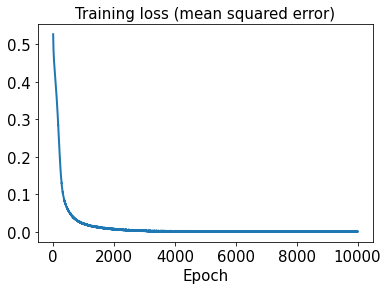

In [29]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

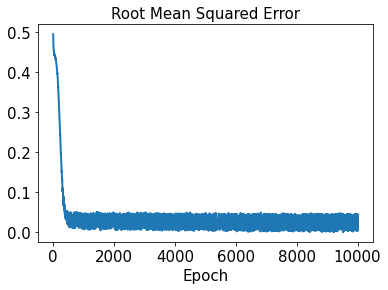

In [30]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [31]:
test_results1 = sd1.evaluate(x_test1)

1/1 [==============================] - 0s 104ms/step - loss: 3.4848e-06 - rmse: 0.0000e+00


In [32]:
decoded_sensor_train1 = sensor_pred1.predict(t_train)

In [33]:
decoded_sensor_test1 = sensor_pred1.predict(t_test)

In [34]:
decoded_train1 = sd1.predict(decoded_sensor_train1)

In [35]:
decoded_test1 = sd1.predict(decoded_sensor_test1)

In [36]:
error_train_abs1 = np.abs(decoded_train1 - y_train1)

In [37]:
error_test_abs1 = np.abs(decoded_test1 - y_test1)

In [38]:
l2_error_train1 = np.sqrt(np.sum((decoded_train1 - y_train1)**2) / np.sum(y_train1**2))
print(l2_error_train1)

0.21646855700440526


In [39]:
l2_error_test1 = np.sqrt(np.sum((decoded_test1 - y_test1)**2) / np.sum(y_test1**2))
print(l2_error_test1)

0.18498029363082114


In [40]:
l2_error_train_list1 = []
for i in range(0, len(x_train1)):
    l2_error_train_data1 = np.sqrt(np.sum((decoded_train1[i] - y_train1[i])**2) / np.sum(y_train1[i]**2))
    l2_error_train_list1.append(l2_error_train_data1)
print(l2_error_train_list1)

[0.41336038403213016, 0.2255524458877882, 0.3394419204296252, 0.15015407856979315, 0.07406746308794698, 0.08662461631608627, 0.10648984462862804, 0.501875942806848, 0.09005625058462136, 0.3353948856116412, 0.40495572526435486, 0.1532933472113476, 0.3624699591929301, 0.2161460407892511, 0.1550632116377826, 0.16471366606677554, 0.4413565426782824, 0.04440948259201326, 0.17585778664715915, 0.47080508679272604, 0.16310221176690587, 0.18626668037110877, 0.2532327909925079, 0.24336662510543078, 0.47087229087303445, 0.10329739811976478, 0.1287400140598515, 0.05657872040492207, 0.016907528988533267, 0.2024257989500159, 0.12248598179448864, 0.3870878434872872, 0.06891000957648262]


In [41]:
l2_error_test_list1 = []
for i in range(0, len(x_test1)):
    l2_error_test_data1 = np.sqrt(np.sum((decoded_test1[i] - y_test1[i])**2) / np.sum(y_test1[i]**2))
    l2_error_test_list1.append(l2_error_test_data1)
print(l2_error_test_list1)

[0.2809581272833742, 0.1370204274670228, 0.14249877683400966, 0.3179382012873847, 0.20166866348652218, 0.09573221384784537, 0.037529904748073765, 0.05465255762972579]


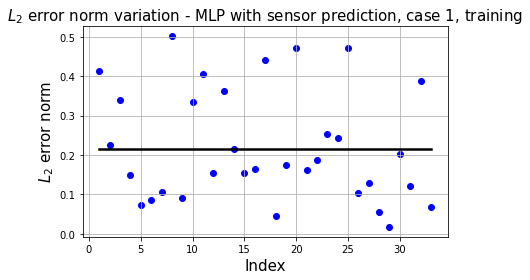

In [42]:
plt.plot(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train1*np.ones(x_train1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

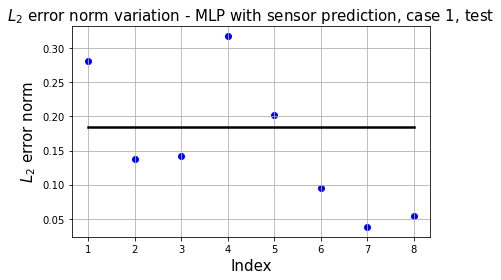

In [43]:
plt.plot(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test1*np.ones(x_test1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

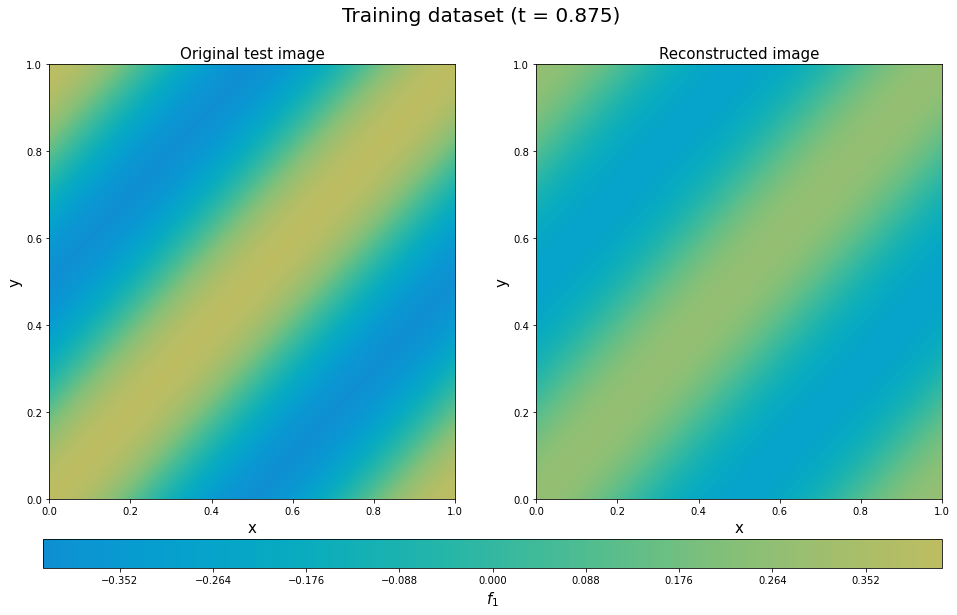

In [44]:
plt.figure(figsize=(16, 8))
y_train1_9_rotate = y_train1[9].T.reshape(101,101)
decoded_rotate1 = decoded_train1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_9_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[35]),fontsize=20)
plt.show()

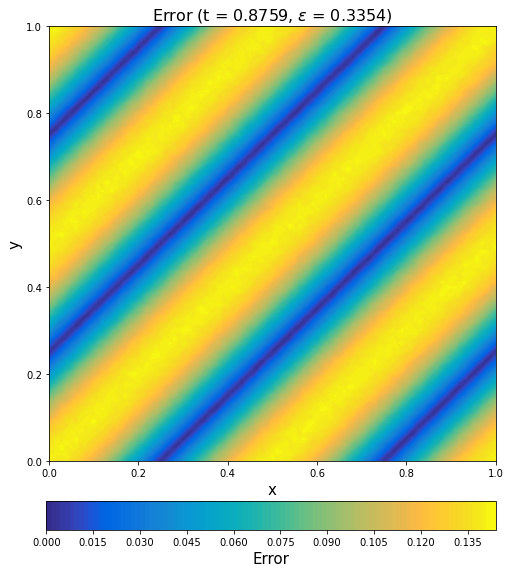

In [45]:
error_train_abs1_rotate9 = error_train_abs1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate9, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.8759, $\epsilon$ = %.4f)' %(l2_error_train_list1[9]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

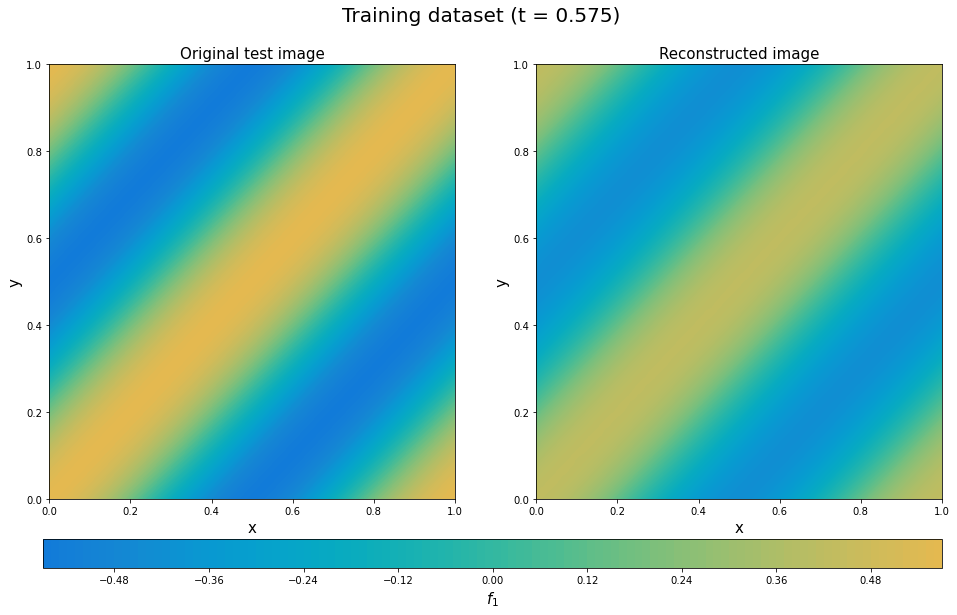

In [46]:
plt.figure(figsize=(16, 8))
y_train1_23_rotate = y_train1[23].T.reshape(101,101)
decoded_rotate1 = decoded_train1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_23_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[23]), fontsize=20)
plt.show()

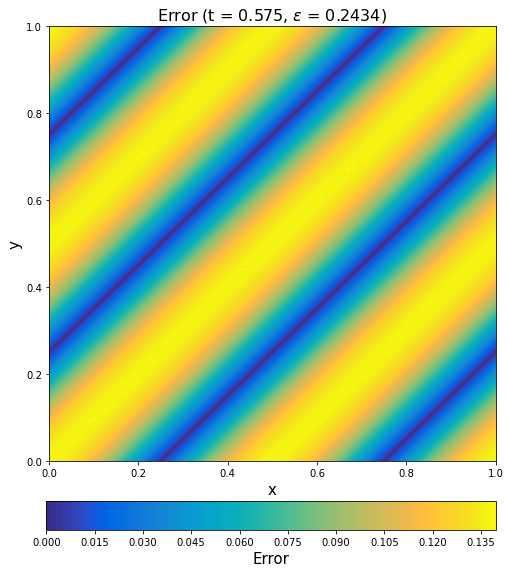

In [47]:
error_train_abs1_rotate23 = error_train_abs1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate23, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.575, $\epsilon$ = %.4f)' %(l2_error_train_list1[23]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

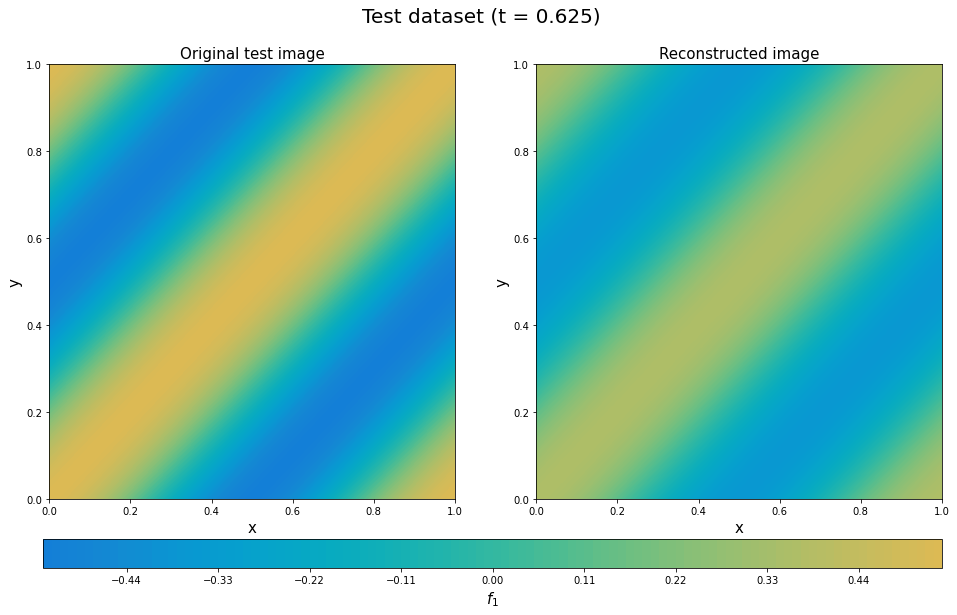

In [48]:
plt.figure(figsize=(16, 8))
y_test1_3_rotate = y_test1[3].T.reshape(101,101)
decoded_rotate1 = decoded_test1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_3_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[25]),fontsize=20)
plt.show()

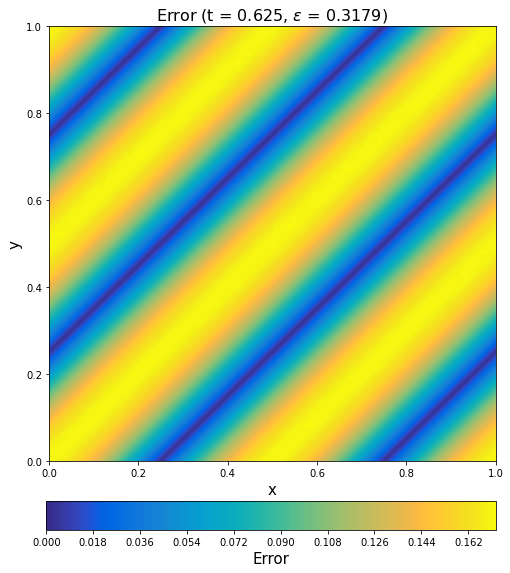

In [49]:
error_test_abs1_rotate3 = error_test_abs1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate3, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.625, $\epsilon$ = %.4f)' %(l2_error_test_list1[3]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

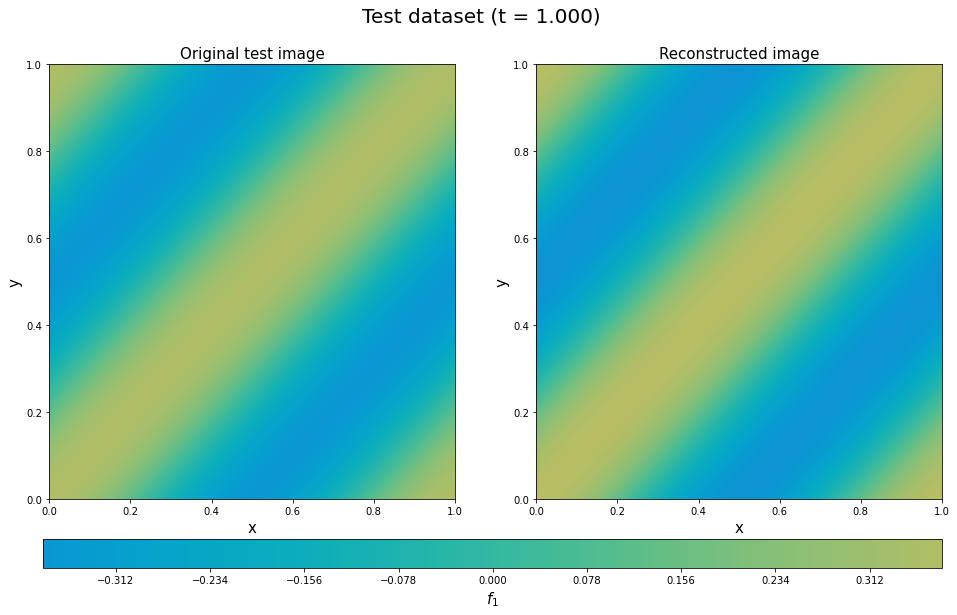

In [50]:
plt.figure(figsize=(16, 8))
y_test1_5_rotate = y_test1[5].T.reshape(101,101)
decoded_rotate1 = decoded_test1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_5_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[40]),fontsize=20)
plt.show()

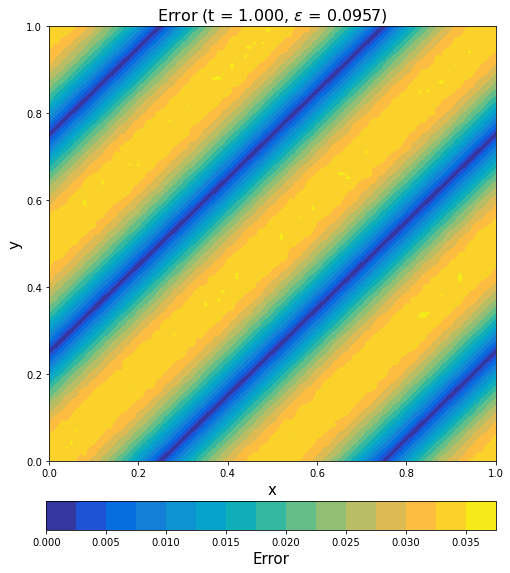

In [51]:
error_test_abs1_rotate5 = error_test_abs1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate5, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 1.000, $\epsilon$ = %.4f)' %(l2_error_test_list1[5]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 2: f2

In [52]:
out2 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out2[i, j, k] = x[j] + y[k] + t[i]

In [53]:
sensor2 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor2[i, j, k] = out2[i, 20*(j+1)+1, 20*(k+1)+1]

In [54]:
sensor2 = sensor2.reshape((41, 16, 1))

In [55]:
sensor2.shape

(41, 16, 1)

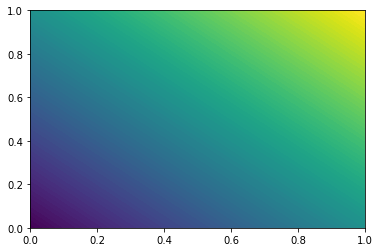

In [56]:
plt.contourf(xmesh, ymesh, out2[0,:,:], levels=128)

In [57]:
x_train2, x_test2, y_train2, y_test2, t_train, t_test = train_test_split(sensor2, out2, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [58]:
x_train2

array([[[1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945],
        [1.545],
        [1.745],
        [1.945],
        [2.145],
        [1.745],
        [1.945],
        [2.145],
        [2.345]],

       [[0.57 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.77 ]],

       [[1.07 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [2.27 ]],

       [[0.72 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [1.52 ],
        [1.12 ],
        [1.32 ],
        

In [59]:
x_test2

array([[[1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [2.22 ]],

       [[0.745],
        [0.945],
        [1.145],
        [1.345],
        [0.945],
        [1.145],
        [1.345],
        [1.545],
        [1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945]],

       [[0.62 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ]],

       [[1.045],
        [1.245],
        [1.445],
        [1.645],
        [1.245],
        [1.445],
        [1.645],
        [1.845],
        [1.445],
        [1.645],
        

In [60]:
sensor_pred2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [61]:
start2 = datetime.datetime.now()
history2 = sensor_pred2.fit(t_train, x_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 13ms/step - loss: 2.5917 - rmse: 1.6093
Epoch 2/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.5840 - rmse: 1.6068
Epoch 3/10000
2/2 [==============================] - 0s 29ms/step - loss: 2.5770 - rmse: 1.6047
Epoch 4/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5710 - rmse: 1.6028
Epoch 5/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.5634 - rmse: 1.6004
Epoch 6/10000
2/2 [==============================] - 0s 20ms/step - loss: 2.5569 - rmse: 1.5984
Epoch 7/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.5507 - rmse: 1.5964
Epoch 8/10000
2/2 [==============================] - 0s 25ms/step - loss: 2.5448 - rmse: 1.5946
Epoch 9/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5391 - rmse: 1.5928
Epoch 10/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5327 - rmse: 1.5908
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 10ms/step - loss: 2.2617 - rmse: 1.5032
Epoch 87/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2614 - rmse: 1.5031
Epoch 88/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2576 - rmse: 1.5018
Epoch 89/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2532 - rmse: 1.5004
Epoch 90/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2507 - rmse: 1.4996
Epoch 91/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2458 - rmse: 1.4979
Epoch 92/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2431 - rmse: 1.4970
Epoch 93/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2435 - rmse: 1.4972
Epoch 94/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2421 - rmse: 1.4967
Epoch 95/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2361 - rmse: 1.4947
Epoch 96/10000
2/2 [==============================] -

2/2 [==============================] - 0s 11ms/step - loss: 2.0246 - rmse: 1.4222
Epoch 171/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0237 - rmse: 1.4219
Epoch 172/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0174 - rmse: 1.4196
Epoch 173/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0147 - rmse: 1.4187
Epoch 174/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0148 - rmse: 1.4187
Epoch 175/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0107 - rmse: 1.4173
Epoch 176/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0100 - rmse: 1.4170
Epoch 177/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0034 - rmse: 1.4147
Epoch 178/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0021 - rmse: 1.4142
Epoch 179/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.9977 - rmse: 1.4127
Epoch 180/10000
2/2 [==================

2/2 [==============================] - 0s 12ms/step - loss: 1.7986 - rmse: 1.3404
Epoch 255/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7954 - rmse: 1.3392
Epoch 256/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7885 - rmse: 1.3366
Epoch 257/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7916 - rmse: 1.3378
Epoch 258/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7857 - rmse: 1.3356
Epoch 259/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7804 - rmse: 1.3336
Epoch 260/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7779 - rmse: 1.3326
Epoch 261/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7785 - rmse: 1.3329
Epoch 262/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7724 - rmse: 1.3306
Epoch 263/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7722 - rmse: 1.3305
Epoch 264/10000
2/2 [====================

2/2 [==============================] - 0s 10ms/step - loss: 1.5794 - rmse: 1.2559
Epoch 339/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5728 - rmse: 1.2533
Epoch 340/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5721 - rmse: 1.2531
Epoch 341/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5677 - rmse: 1.2513
Epoch 342/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5656 - rmse: 1.2505
Epoch 343/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5645 - rmse: 1.2500
Epoch 344/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5651 - rmse: 1.2503
Epoch 345/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5580 - rmse: 1.2474
Epoch 346/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5572 - rmse: 1.2471
Epoch 347/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5579 - rmse: 1.2474
Epoch 348/10000
2/2 [=================

2/2 [==============================] - 0s 9ms/step - loss: 1.3724 - rmse: 1.1707
Epoch 422/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3766 - rmse: 1.1724
Epoch 423/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3668 - rmse: 1.1683
Epoch 424/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3646 - rmse: 1.1673
Epoch 425/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3655 - rmse: 1.1677
Epoch 426/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3626 - rmse: 1.1664
Epoch 427/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3583 - rmse: 1.1646
Epoch 428/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3556 - rmse: 1.1635
Epoch 429/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3545 - rmse: 1.1630
Epoch 430/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3544 - rmse: 1.1629
Epoch 431/10000
2/2 [==================

Epoch 505/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1864 - rmse: 1.0883
Epoch 506/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1842 - rmse: 1.0873
Epoch 507/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1792 - rmse: 1.0850
Epoch 508/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1776 - rmse: 1.0843
Epoch 509/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1750 - rmse: 1.0831
Epoch 510/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1763 - rmse: 1.0837
Epoch 511/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1741 - rmse: 1.0827
Epoch 512/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1689 - rmse: 1.0802
Epoch 513/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1668 - rmse: 1.0793
Epoch 514/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1659 - rmse: 1.0789
Epoch 515/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 1.0115 - rmse: 1.0048
Epoch 589/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0063 - rmse: 1.0022
Epoch 590/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0023 - rmse: 1.0002
Epoch 591/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0012 - rmse: 0.9996
Epoch 592/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.9996 - rmse: 0.9989
Epoch 593/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9976 - rmse: 0.9978
Epoch 594/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9969 - rmse: 0.9975
Epoch 595/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.9943 - rmse: 0.9962
Epoch 596/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9928 - rmse: 0.9954
Epoch 597/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.9900 - rmse: 0.9940
Epoch 598/10000
2/2 [==================

2/2 [==============================] - 0s 11ms/step - loss: 0.8507 - rmse: 0.9213
Epoch 672/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8468 - rmse: 0.9192
Epoch 673/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8502 - rmse: 0.9210
Epoch 674/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8488 - rmse: 0.9203
Epoch 675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8448 - rmse: 0.9181
Epoch 676/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8392 - rmse: 0.9150
Epoch 677/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8409 - rmse: 0.9160
Epoch 678/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8414 - rmse: 0.9162
Epoch 679/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8348 - rmse: 0.9126
Epoch 680/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8324 - rmse: 0.9113
Epoch 681/10000
2/2 [================

Epoch 755/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7082 - rmse: 0.8404
Epoch 756/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7044 - rmse: 0.8381
Epoch 757/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.7001 - rmse: 0.8356
Epoch 758/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6991 - rmse: 0.8350
Epoch 759/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7009 - rmse: 0.8360
Epoch 760/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6989 - rmse: 0.8349
Epoch 761/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6944 - rmse: 0.8322
Epoch 762/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6940 - rmse: 0.8319
Epoch 763/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.6959 - rmse: 0.8330
Epoch 764/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.6884 - rmse: 0.8286
Epoch 765/10000
2/2 [===

2/2 [==============================] - 0s 12ms/step - loss: 0.5793 - rmse: 0.7599
Epoch 839/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5742 - rmse: 0.7565
Epoch 840/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5709 - rmse: 0.7543
Epoch 841/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5736 - rmse: 0.7561
Epoch 842/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5687 - rmse: 0.7528
Epoch 843/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5717 - rmse: 0.7549
Epoch 844/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5654 - rmse: 0.7507
Epoch 845/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5704 - rmse: 0.7540
Epoch 846/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5621 - rmse: 0.7485
Epoch 847/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5618 - rmse: 0.7482
Epoch 848/10000
2/2 [=================

Epoch 922/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4584 - rmse: 0.6757
Epoch 923/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4611 - rmse: 0.6777
Epoch 924/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4600 - rmse: 0.6768
Epoch 925/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4580 - rmse: 0.6754
Epoch 926/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4546 - rmse: 0.6728
Epoch 927/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4519 - rmse: 0.6709
Epoch 928/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.4521 - rmse: 0.6710
Epoch 929/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4512 - rmse: 0.6703
Epoch 930/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4505 - rmse: 0.6698
Epoch 931/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4500 - rmse: 0.6694
Epoch 932/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.3701 - rmse: 0.6068
Epoch 1006/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3699 - rmse: 0.6066
Epoch 1007/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3682 - rmse: 0.6053
Epoch 1008/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3660 - rmse: 0.6034
Epoch 1009/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3673 - rmse: 0.6045
Epoch 1010/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3670 - rmse: 0.6043
Epoch 1011/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3598 - rmse: 0.5982
Epoch 1012/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3620 - rmse: 0.6001
Epoch 1013/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3597 - rmse: 0.5982
Epoch 1014/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3578 - rmse: 0.5966
Epoch 1015/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.2847 - rmse: 0.5318
Epoch 1089/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2784 - rmse: 0.5259
Epoch 1090/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2777 - rmse: 0.5252
Epoch 1091/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2821 - rmse: 0.5294
Epoch 1092/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2759 - rmse: 0.5234
Epoch 1093/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2749 - rmse: 0.5225
Epoch 1094/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2781 - rmse: 0.5256
Epoch 1095/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2747 - rmse: 0.5224
Epoch 1096/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2746 - rmse: 0.5222
Epoch 1097/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2736 - rmse: 0.5213
Epoch 1098/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 0.2139 - rmse: 0.4605
Epoch 1172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2130 - rmse: 0.4595
Epoch 1173/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2136 - rmse: 0.4601
Epoch 1174/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2177 - rmse: 0.4646
Epoch 1175/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2149 - rmse: 0.4616
Epoch 1176/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2105 - rmse: 0.4568
Epoch 1177/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2164 - rmse: 0.4632
Epoch 1178/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2092 - rmse: 0.4553
Epoch 1179/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2106 - rmse: 0.4569
Epoch 1180/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2117 - rmse: 0.4581
Epoch 1181/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.1646 - rmse: 0.4034
Epoch 1255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1600 - rmse: 0.3977
Epoch 1256/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1577 - rmse: 0.3948
Epoch 1257/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1579 - rmse: 0.3950
Epoch 1258/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1624 - rmse: 0.4007
Epoch 1259/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1553 - rmse: 0.3918
Epoch 1260/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1602 - rmse: 0.3980
Epoch 1261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1609 - rmse: 0.3989
Epoch 1262/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1540 - rmse: 0.3900
Epoch 1263/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1596 - rmse: 0.3972
Epoch 1264/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.1246 - rmse: 0.3504
Epoch 1338/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1181 - rmse: 0.3410
Epoch 1339/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1209 - rmse: 0.3451
Epoch 1340/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1199 - rmse: 0.3436
Epoch 1341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1214 - rmse: 0.3458
Epoch 1342/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1208 - rmse: 0.3449
Epoch 1343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1142 - rmse: 0.3351
Epoch 1344/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1139 - rmse: 0.3347
Epoch 1345/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1143 - rmse: 0.3354
Epoch 1346/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1125 - rmse: 0.3327
Epoch 1347/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 0.0880 - rmse: 0.2936
Epoch 1421/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0838 - rmse: 0.2862
Epoch 1422/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0898 - rmse: 0.2966
Epoch 1423/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0848 - rmse: 0.2880
Epoch 1424/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0839 - rmse: 0.2865
Epoch 1425/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0866 - rmse: 0.2912
Epoch 1426/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0816 - rmse: 0.2824
Epoch 1427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0814 - rmse: 0.2821
Epoch 1428/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0803 - rmse: 0.2802
Epoch 1429/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0804 - rmse: 0.2803
Epoch 1430/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0575 - rmse: 0.2359
Epoch 1504/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0637 - rmse: 0.2487
Epoch 1505/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0631 - rmse: 0.2475
Epoch 1506/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0611 - rmse: 0.2435
Epoch 1507/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0574 - rmse: 0.2357
Epoch 1508/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0582 - rmse: 0.2373
Epoch 1509/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0586 - rmse: 0.2382
Epoch 1510/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0560 - rmse: 0.2327
Epoch 1511/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0579 - rmse: 0.2367
Epoch 1512/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0597 - rmse: 0.2406
Epoch 1513/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0437 - rmse: 0.2045
Epoch 1587/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0483 - rmse: 0.2156
Epoch 1588/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0407 - rmse: 0.1972
Epoch 1589/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0414 - rmse: 0.1989
Epoch 1590/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0403 - rmse: 0.1962
Epoch 1591/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0413 - rmse: 0.1988
Epoch 1592/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0399 - rmse: 0.1951
Epoch 1593/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0400 - rmse: 0.1954
Epoch 1594/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0410 - rmse: 0.1978
Epoch 1595/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0429 - rmse: 0.2026
Epoch 1596/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0285 - rmse: 0.1635
Epoch 1670/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0318 - rmse: 0.1733
Epoch 1671/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0340 - rmse: 0.1794
Epoch 1672/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0282 - rmse: 0.1624
Epoch 1673/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0285 - rmse: 0.1633
Epoch 1674/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0279 - rmse: 0.1615
Epoch 1675/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0287 - rmse: 0.1641
Epoch 1676/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0288 - rmse: 0.1644
Epoch 1677/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0308 - rmse: 0.1701
Epoch 1678/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0285 - rmse: 0.1635
Epoch 1679/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0242 - rmse: 0.1496
Epoch 1753/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0232 - rmse: 0.1461
Epoch 1754/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0231 - rmse: 0.1458
Epoch 1755/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0215 - rmse: 0.1404
Epoch 1756/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0214 - rmse: 0.1398
Epoch 1757/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0228 - rmse: 0.1448
Epoch 1758/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0257 - rmse: 0.1544
Epoch 1759/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0197 - rmse: 0.1337
Epoch 1760/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0225 - rmse: 0.1437
Epoch 1761/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0188 - rmse: 0.1304
Epoch 1762/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0168 - rmse: 0.1225
Epoch 1836/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0153 - rmse: 0.1163
Epoch 1837/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0130 - rmse: 0.1060
Epoch 1838/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0132 - rmse: 0.1069
Epoch 1839/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0154 - rmse: 0.1167
Epoch 1840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0189 - rmse: 0.1306
Epoch 1841/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0131 - rmse: 0.1065
Epoch 1842/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0146 - rmse: 0.1130
Epoch 1843/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0127 - rmse: 0.1047
Epoch 1844/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0148 - rmse: 0.1139
Epoch 1845/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0130 - rmse: 0.1057
Epoch 1919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0130 - rmse: 0.1058
Epoch 1920/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0096 - rmse: 0.0883
Epoch 1921/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0139 - rmse: 0.1099
Epoch 1922/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0160 - rmse: 0.1192
Epoch 1923/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0887
Epoch 1924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0870
Epoch 1925/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0131 - rmse: 0.1062
Epoch 1926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0111 - rmse: 0.0966
Epoch 1927/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0104 - rmse: 0.0925
Epoch 1928/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0770
Epoch 2002/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0100 - rmse: 0.0908
Epoch 2003/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0138 - rmse: 0.1095
Epoch 2004/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0087 - rmse: 0.0835
Epoch 2005/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0085 - rmse: 0.0817
Epoch 2006/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0730
Epoch 2007/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0112 - rmse: 0.0971
Epoch 2008/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0729
Epoch 2009/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0805
Epoch 2010/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0806
Epoch 2011/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0870
Epoch 2085/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0679
Epoch 2086/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0630
Epoch 2087/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0599
Epoch 2088/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0597
Epoch 2089/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0761
Epoch 2090/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0832
Epoch 2091/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0807
Epoch 2092/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0833
Epoch 2093/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0716
Epoch 2094/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0478
Epoch 2168/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0814
Epoch 2169/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0472
Epoch 2170/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0559
Epoch 2171/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0802
Epoch 2172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0462
Epoch 2173/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0535
Epoch 2174/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0814
Epoch 2175/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0058 - rmse: 0.0639
Epoch 2176/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0658
Epoch 2177/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0426
Epoch 2251/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0749
Epoch 2252/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0674
Epoch 2253/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0408
Epoch 2254/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0665
Epoch 2255/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0108 - rmse: 0.0953
Epoch 2256/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0521
Epoch 2257/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0605
Epoch 2258/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0108 - rmse: 0.0953
Epoch 2259/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0668
Epoch 2260/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0761
Epoch 2334/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0679
Epoch 2335/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0419
Epoch 2336/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0399
Epoch 2337/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0347
Epoch 2338/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0582
Epoch 2339/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0334
Epoch 2340/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0328
Epoch 2341/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0096 - rmse: 0.0888
Epoch 2342/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0563
Epoch 2343/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0300
Epoch 2417/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0514
Epoch 2418/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0580
Epoch 2419/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0620
Epoch 2420/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0581
Epoch 2421/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0555
Epoch 2422/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0452
Epoch 2423/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0404
Epoch 2424/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0453
Epoch 2425/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0485
Epoch 2426/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0833
Epoch 2500/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0561
Epoch 2501/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0623
Epoch 2502/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0614
Epoch 2503/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0507
Epoch 2504/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0455
Epoch 2505/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0402
Epoch 2506/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0054 - rmse: 0.0609
Epoch 2507/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0600
Epoch 2508/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0091 - rmse: 0.0861
Epoch 2509/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0686
Epoch 2583/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0379
Epoch 2584/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0340
Epoch 2585/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0649
Epoch 2586/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0053 - rmse: 0.0598
Epoch 2587/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0443
Epoch 2588/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0685
Epoch 2589/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0713
Epoch 2590/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0295
Epoch 2591/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0778
Epoch 2592/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0446
Epoch 2666/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0684
Epoch 2667/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0812
Epoch 2668/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0639
Epoch 2669/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0350
Epoch 2670/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0244
Epoch 2671/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0679
Epoch 2672/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0099 - rmse: 0.0903
Epoch 2673/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0301
Epoch 2674/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0082 - rmse: 0.0806
Epoch 2675/10000
2/2 [=====

Epoch 2748/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0396
Epoch 2749/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0836
Epoch 2750/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0295
Epoch 2751/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0861
Epoch 2752/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0219
Epoch 2753/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0757
Epoch 2754/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0297
Epoch 2755/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0803
Epoch 2756/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0555
Epoch 2757/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0671
Epoch 2758/1

2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0663
Epoch 2831/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0618
Epoch 2832/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0521
Epoch 2833/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0228
Epoch 2834/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0232
Epoch 2835/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0284
Epoch 2836/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0457
Epoch 2837/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0175
Epoch 2838/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0135
Epoch 2839/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0526
Epoch 2840/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0375
Epoch 2914/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0219
Epoch 2915/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0452
Epoch 2916/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0401
Epoch 2917/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0674
Epoch 2918/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0059 - rmse: 0.0651
Epoch 2919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0749
Epoch 2920/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0699
Epoch 2921/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0229
Epoch 2922/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0296
Epoch 2923/10000
2/2 [=====

Epoch 2996/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0534
Epoch 2997/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0147
Epoch 2998/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0521
Epoch 2999/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0787
Epoch 3000/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0776
Epoch 3001/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0752
Epoch 3002/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0665
Epoch 3003/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0181
Epoch 3004/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0202
Epoch 3005/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0234
Epoch 3006/

2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0520
Epoch 3079/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0140
Epoch 3080/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0649
Epoch 3081/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0209
Epoch 3082/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0437
Epoch 3083/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0163
Epoch 3084/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0623
Epoch 3085/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0476
Epoch 3086/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0739
Epoch 3087/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0561
Epoch 3088/10000
2/2 [=====

Epoch 3161/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0741
Epoch 3162/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0077 - rmse: 0.0778
Epoch 3163/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0786
Epoch 3164/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0729
Epoch 3165/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0819
Epoch 3166/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0229
Epoch 3167/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0789
Epoch 3168/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0612
Epoch 3169/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0317
Epoch 3170/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0448
Epoch 3171/

2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0653
Epoch 3244/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0817
Epoch 3245/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0384
Epoch 3246/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0410
Epoch 3247/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0882
Epoch 3248/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0327
Epoch 3249/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0534
Epoch 3250/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0286
Epoch 3251/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0200
Epoch 3252/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0381
Epoch 3253/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0774
Epoch 3327/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0485
Epoch 3328/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0553
Epoch 3329/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0398
Epoch 3330/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0775
Epoch 3331/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0159
Epoch 3332/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0784
Epoch 3333/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0428
Epoch 3334/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0641
Epoch 3335/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0336
Epoch 3336/10000
2/2 [=======

Epoch 3409/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0220
Epoch 3410/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0356
Epoch 3411/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0784
Epoch 3412/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0482
Epoch 3413/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0738
Epoch 3414/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0385
Epoch 3415/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0607
Epoch 3416/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0170
Epoch 3417/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0169
Epoch 3418/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0499
Epoch 3419/

2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0346
Epoch 3492/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0844
Epoch 3493/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0406
Epoch 3494/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0243
Epoch 3495/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0281
Epoch 3496/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0559
Epoch 3497/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0212
Epoch 3498/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0096 - rmse: 0.0891
Epoch 3499/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0614
Epoch 3500/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0213
Epoch 3501/10000
2/2 [======

2/2 [==============================] - 0s 13ms/step - loss: 0.0041 - rmse: 0.0503
Epoch 3575/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0219
Epoch 3576/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0071 - rmse: 0.0740
Epoch 3577/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0807
Epoch 3578/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0130
Epoch 3579/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0191
Epoch 3580/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0821
Epoch 3581/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0487
Epoch 3582/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0390
Epoch 3583/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0331
Epoch 3584/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0241
Epoch 3658/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0086 - rmse: 0.0837
Epoch 3659/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0493
Epoch 3660/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0654
Epoch 3661/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0748
Epoch 3662/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0361
Epoch 3663/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0744
Epoch 3664/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0789
Epoch 3665/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0494
Epoch 3666/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0085 - rmse: 0.0829
Epoch 3667/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0645
Epoch 3741/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0810
Epoch 3742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0686
Epoch 3743/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0498
Epoch 3744/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0775
Epoch 3745/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0582
Epoch 3746/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0657
Epoch 3747/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0789
Epoch 3748/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0487
Epoch 3749/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0524
Epoch 3750/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0083 - rmse: 0.0822
Epoch 3824/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0786
Epoch 3825/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0497
Epoch 3826/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0311
Epoch 3827/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0365
Epoch 3828/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0173
Epoch 3829/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0145
Epoch 3830/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0355
Epoch 3831/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0652
Epoch 3832/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0209
Epoch 3833/10000
2/2 [=======

Epoch 3906/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0654
Epoch 3907/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0808
Epoch 3908/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0350
Epoch 3909/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0801
Epoch 3910/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0071 - rmse: 0.0746
Epoch 3911/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0458
Epoch 3912/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0260
Epoch 3913/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0203
Epoch 3914/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0708
Epoch 3915/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0753
Epoch 3916

2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0236
Epoch 3989/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0443
Epoch 3990/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0208
Epoch 3991/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0518
Epoch 3992/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0748
Epoch 3993/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0554
Epoch 3994/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0169
Epoch 3995/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0744
Epoch 3996/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0747
Epoch 3997/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0281
Epoch 3998/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0233
Epoch 4072/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0600
Epoch 4073/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0711
Epoch 4074/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0237
Epoch 4075/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0469
Epoch 4076/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0271
Epoch 4077/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0299
Epoch 4078/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0210
Epoch 4079/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0512
Epoch 4080/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0074 - rmse: 0.0764
Epoch 4081/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0830
Epoch 4155/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0321
Epoch 4156/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0201
Epoch 4157/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0800
Epoch 4158/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0246
Epoch 4159/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0433
Epoch 4160/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0668
Epoch 4161/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0077 - rmse: 0.0784
Epoch 4162/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0440
Epoch 4163/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0698
Epoch 4164/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0282
Epoch 4238/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0431
Epoch 4239/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0441
Epoch 4240/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0829
Epoch 4241/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0444
Epoch 4242/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0615
Epoch 4243/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0150
Epoch 4244/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0463
Epoch 4245/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0144
Epoch 4246/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0690
Epoch 4247/10000
2/2 [=====

Epoch 4320/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0443
Epoch 4321/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0822
Epoch 4322/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0567
Epoch 4323/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0482
Epoch 4324/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0687
Epoch 4325/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0399
Epoch 4326/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0818
Epoch 4327/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0565
Epoch 4328/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0602
Epoch 4329/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0818
Epoch 4330

2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0760
Epoch 4403/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0434
Epoch 4404/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0700
Epoch 4405/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0174
Epoch 4406/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0689
Epoch 4407/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0558
Epoch 4408/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0486
Epoch 4409/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0150
Epoch 4410/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0188
Epoch 4411/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0147
Epoch 4412/10000
2/2 [======

Epoch 4485/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0192
Epoch 4486/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0247
Epoch 4487/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0523
Epoch 4488/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0563
Epoch 4489/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0075 - rmse: 0.0779
Epoch 4490/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0385
Epoch 4491/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0076 - rmse: 0.0784
Epoch 4492/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0499
Epoch 4493/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0583
Epoch 4494/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0887
Epoch 4495/1

2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0813
Epoch 4568/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0274
Epoch 4569/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0240
Epoch 4570/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0392
Epoch 4571/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0383
Epoch 4572/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0238
Epoch 4573/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0462
Epoch 4574/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0084 - rmse: 0.0834
Epoch 4575/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0430
Epoch 4576/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0588
Epoch 4577/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0092 - rmse: 0.0878
Epoch 4651/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0404
Epoch 4652/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0609
Epoch 4653/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0743
Epoch 4654/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0496
Epoch 4655/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0462
Epoch 4656/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0388
Epoch 4657/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0478
Epoch 4658/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0831
Epoch 4659/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0439
Epoch 4660/10000
2/2 [=====

Epoch 4733/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0246
Epoch 4734/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0209
Epoch 4735/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0794
Epoch 4736/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0761
Epoch 4737/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0370
Epoch 4738/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0323
Epoch 4739/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0885
Epoch 4740/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0700
Epoch 4741/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0092 - rmse: 0.0880
Epoch 4742/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0808
Epoch 4743/

2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0263
Epoch 4816/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0272
Epoch 4817/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0478
Epoch 4818/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0148
Epoch 4819/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0793
Epoch 4820/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0107
Epoch 4821/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0126
Epoch 4822/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0616
Epoch 4823/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0177
Epoch 4824/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0188
Epoch 4825/10000
2/2 [======

2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0186
Epoch 4899/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0211
Epoch 4900/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0186
Epoch 4901/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0398
Epoch 4902/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0083 - rmse: 0.0830
Epoch 4903/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0572
Epoch 4904/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0169
Epoch 4905/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0427
Epoch 4906/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0083 - rmse: 0.0830
Epoch 4907/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0797
Epoch 4908/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0185
Epoch 4982/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0157
Epoch 4983/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0319
Epoch 4984/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0567
Epoch 4985/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0182
Epoch 4986/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0802
Epoch 4987/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0661
Epoch 4988/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0214
Epoch 4989/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0622
Epoch 4990/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0206
Epoch 4991/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0050 - rmse: 0.0599
Epoch 5065/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0076 - rmse: 0.0789
Epoch 5066/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0295
Epoch 5067/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0772
Epoch 5068/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0345
Epoch 5069/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0746
Epoch 5070/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0729
Epoch 5071/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0277
Epoch 5072/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0360
Epoch 5073/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0834
Epoch 5074/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0425
Epoch 5148/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0553
Epoch 5149/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0183
Epoch 5150/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0216
Epoch 5151/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0145
Epoch 5152/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0081 - rmse: 0.0820
Epoch 5153/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0574
Epoch 5154/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0049 - rmse: 0.0593
Epoch 5155/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0582
Epoch 5156/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0417
Epoch 5157/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0741
Epoch 5231/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0420
Epoch 5232/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0484
Epoch 5233/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0664
Epoch 5234/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0221
Epoch 5235/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0108
Epoch 5236/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0749
Epoch 5237/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0076 - rmse: 0.0785
Epoch 5238/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0363
Epoch 5239/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0358
Epoch 5240/10000
2/2 [======

Epoch 5313/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0600
Epoch 5314/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0518
Epoch 5315/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0506
Epoch 5316/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0346
Epoch 5317/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0491
Epoch 5318/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0345
Epoch 5319/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0235
Epoch 5320/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0199
Epoch 5321/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0415
Epoch 5322/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0373
Epoch 5323/1

2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0337
Epoch 5396/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0503
Epoch 5397/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0420
Epoch 5398/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0493
Epoch 5399/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0266
Epoch 5400/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0757
Epoch 5401/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0497
Epoch 5402/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0794
Epoch 5403/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0573
Epoch 5404/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0288
Epoch 5405/10000
2/2 [======

Epoch 5478/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0394
Epoch 5479/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0091 - rmse: 0.0882
Epoch 5480/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0572
Epoch 5481/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0271
Epoch 5482/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0839
Epoch 5483/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0750
Epoch 5484/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0139
Epoch 5485/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0662
Epoch 5486/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0075 - rmse: 0.0783
Epoch 5487/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0830
Epoch 5488/1

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0223
Epoch 5561/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0559
Epoch 5562/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0096
Epoch 5563/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0422
Epoch 5564/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0091 - rmse: 0.0880
Epoch 5565/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0519
Epoch 5566/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0352
Epoch 5567/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0749
Epoch 5568/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0390
Epoch 5569/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0481
Epoch 5570/10000
2/2 [======

Epoch 5643/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0448
Epoch 5644/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0156
Epoch 5645/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0838
Epoch 5646/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0238
Epoch 5647/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0196
Epoch 5648/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0421
Epoch 5649/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0731
Epoch 5650/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0421
Epoch 5651/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0665
Epoch 5652/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0483
Epoch 5653/

2/2 [==============================] - 0s 11ms/step - loss: 0.0091 - rmse: 0.0883
Epoch 5726/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0522
Epoch 5727/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0313
Epoch 5728/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0095 - rmse: 0.0906
Epoch 5729/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0359
Epoch 5730/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0358
Epoch 5731/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0310
Epoch 5732/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0785
Epoch 5733/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0880
Epoch 5734/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0323
Epoch 5735/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0402
Epoch 5809/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0343
Epoch 5810/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0325
Epoch 5811/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0373
Epoch 5812/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0198
Epoch 5813/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0834
Epoch 5814/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0713
Epoch 5815/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0577
Epoch 5816/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0588
Epoch 5817/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0458
Epoch 5818/10000
2/2 [=====

Epoch 5891/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0841
Epoch 5892/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0091 - rmse: 0.0881
Epoch 5893/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0664
Epoch 5894/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0082 - rmse: 0.0827
Epoch 5895/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0242
Epoch 5896/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0484
Epoch 5897/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0395
Epoch 5898/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0603
Epoch 5899/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0387
Epoch 5900/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0154
Epoch 5901/

2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0752
Epoch 5974/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0834
Epoch 5975/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0201
Epoch 5976/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0125
Epoch 5977/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0492
Epoch 5978/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0569
Epoch 5979/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0572
Epoch 5980/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0139
Epoch 5981/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0156
Epoch 5982/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0179
Epoch 5983/10000
2/2 [======

Epoch 6056/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0355
Epoch 6057/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0826
Epoch 6058/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0164
Epoch 6059/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0110
Epoch 6060/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0451
Epoch 6061/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0733
Epoch 6062/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0492
Epoch 6063/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0652
Epoch 6064/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0690
Epoch 6065/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0596
Epoch 6066/

2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0178
Epoch 6139/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0431
Epoch 6140/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0773
Epoch 6141/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0241
Epoch 6142/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0335
Epoch 6143/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0572
Epoch 6144/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0190
Epoch 6145/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0505
Epoch 6146/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0683
Epoch 6147/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0421
Epoch 6148/10000
2/2 [=====

Epoch 6221/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0102
Epoch 6222/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0068
Epoch 6223/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0172
Epoch 6224/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0820
Epoch 6225/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0299
Epoch 6226/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0429
Epoch 6227/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0279
Epoch 6228/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0394
Epoch 6229/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0569
Epoch 6230/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0477
Epoch 6231/

2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0437
Epoch 6304/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0433
Epoch 6305/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0553
Epoch 6306/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0219
Epoch 6307/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0084
Epoch 6308/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0277
Epoch 6309/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0381
Epoch 6310/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0599
Epoch 6311/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0775
Epoch 6312/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0817
Epoch 6313/10000
2/2 [======

Epoch 6386/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0845
Epoch 6387/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0464
Epoch 6388/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0512
Epoch 6389/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0337
Epoch 6390/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0789
Epoch 6391/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0212
Epoch 6392/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0771
Epoch 6393/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0338
Epoch 6394/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0504
Epoch 6395/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0787
Epoch 6396

2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0792
Epoch 6469/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0227
Epoch 6470/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0798
Epoch 6471/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0638
Epoch 6472/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0397
Epoch 6473/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0473
Epoch 6474/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0390
Epoch 6475/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0837
Epoch 6476/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0505
Epoch 6477/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0227
Epoch 6478/10000
2/2 [======

Epoch 6551/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0326
Epoch 6552/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0543
Epoch 6553/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0753
Epoch 6554/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0768
Epoch 6555/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0636
Epoch 6556/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0251
Epoch 6557/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0263
Epoch 6558/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0609
Epoch 6559/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0813
Epoch 6560/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0270
Epoch 6561/1

2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0269
Epoch 6634/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0456
Epoch 6635/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0482
Epoch 6636/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0599
Epoch 6637/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0518
Epoch 6638/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0652
Epoch 6639/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0610
Epoch 6640/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0531
Epoch 6641/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0517
Epoch 6642/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0440
Epoch 6643/10000
2/2 [======

Epoch 6716/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0488
Epoch 6717/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0472
Epoch 6718/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0746
Epoch 6719/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0054 - rmse: 0.0641
Epoch 6720/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0651
Epoch 6721/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0149
Epoch 6722/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0182
Epoch 6723/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0438
Epoch 6724/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0276
Epoch 6725/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0480
Epoch 6726

2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0480
Epoch 6799/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0604
Epoch 6800/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0170
Epoch 6801/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0431
Epoch 6802/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0641
Epoch 6803/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0468
Epoch 6804/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0682
Epoch 6805/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0162
Epoch 6806/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0637
Epoch 6807/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0594
Epoch 6808/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0755
Epoch 6882/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0165
Epoch 6883/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0623
Epoch 6884/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0578
Epoch 6885/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0697
Epoch 6886/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0147
Epoch 6887/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0846
Epoch 6888/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0410
Epoch 6889/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0832
Epoch 6890/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0089 - rmse: 0.0877
Epoch 6891/10000
2/2 [======

Epoch 6964/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0111
Epoch 6965/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0741
Epoch 6966/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0735
Epoch 6967/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0264
Epoch 6968/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0091 - rmse: 0.0888
Epoch 6969/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0352
Epoch 6970/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0685
Epoch 6971/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0508
Epoch 6972/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0792
Epoch 6973/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0512
Epoch 6974/

2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0655
Epoch 7047/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0642
Epoch 7048/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0380
Epoch 7049/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0731
Epoch 7050/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0140
Epoch 7051/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0608
Epoch 7052/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0106
Epoch 7053/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0423
Epoch 7054/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0640
Epoch 7055/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0465
Epoch 7056/10000
2/2 [======

Epoch 7129/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0164
Epoch 7130/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0654
Epoch 7131/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0793
Epoch 7132/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0365
Epoch 7133/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0360
Epoch 7134/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0695
Epoch 7135/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0438
Epoch 7136/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0160
Epoch 7137/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0570
Epoch 7138/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0383
Epoch 7139/

2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0378
Epoch 7212/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0382
Epoch 7213/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0394
Epoch 7214/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0436
Epoch 7215/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0741
Epoch 7216/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0125
Epoch 7217/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0595
Epoch 7218/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0231
Epoch 7219/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0186
Epoch 7220/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0875
Epoch 7221/10000
2/2 [=====

Epoch 7294/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0359
Epoch 7295/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0849
Epoch 7296/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0607
Epoch 7297/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0823
Epoch 7298/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0514
Epoch 7299/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0841
Epoch 7300/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0493
Epoch 7301/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0314
Epoch 7302/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0251
Epoch 7303/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0390
Epoch 7304

2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0507
Epoch 7377/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0750
Epoch 7378/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0142
Epoch 7379/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0739
Epoch 7380/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0685
Epoch 7381/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0221
Epoch 7382/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0337
Epoch 7383/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0834
Epoch 7384/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0875
Epoch 7385/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0736
Epoch 7386/10000
2/2 [======

Epoch 7459/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0563
Epoch 7460/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0223
Epoch 7461/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0741
Epoch 7462/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0384
Epoch 7463/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0089 - rmse: 0.0876
Epoch 7464/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0268
Epoch 7465/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0653
Epoch 7466/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0742
Epoch 7467/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0360
Epoch 7468/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0200
Epoch 7469/

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0263
Epoch 7542/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0341
Epoch 7543/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0566
Epoch 7544/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0871
Epoch 7545/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0821
Epoch 7546/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0391
Epoch 7547/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0752
Epoch 7548/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0770
Epoch 7549/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0207
Epoch 7550/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0434
Epoch 7551/10000
2/2 [======

Epoch 7624/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0309
Epoch 7625/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0661
Epoch 7626/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0576
Epoch 7627/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0207
Epoch 7628/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0581
Epoch 7629/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0567
Epoch 7630/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0364
Epoch 7631/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0379
Epoch 7632/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0143
Epoch 7633/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0644
Epoch 7634/

2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0621
Epoch 7707/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0685
Epoch 7708/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0212
Epoch 7709/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0556
Epoch 7710/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0835
Epoch 7711/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0787
Epoch 7712/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0774
Epoch 7713/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0392
Epoch 7714/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0442
Epoch 7715/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0378
Epoch 7716/10000
2/2 [=====

Epoch 7789/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0652
Epoch 7790/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0434
Epoch 7791/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0604
Epoch 7792/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0261
Epoch 7793/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0550
Epoch 7794/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0348
Epoch 7795/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0373
Epoch 7796/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0637
Epoch 7797/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0648
Epoch 7798/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0781
Epoch 7799/

2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0708
Epoch 7872/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0829
Epoch 7873/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0589
Epoch 7874/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0379
Epoch 7875/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0511
Epoch 7876/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0671
Epoch 7877/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0671
Epoch 7878/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0518
Epoch 7879/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0451
Epoch 7880/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0292
Epoch 7881/10000
2/2 [======

Epoch 7954/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0638
Epoch 7955/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0249
Epoch 7956/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0723
Epoch 7957/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0649
Epoch 7958/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0248
Epoch 7959/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0819
Epoch 7960/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0845
Epoch 7961/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0465
Epoch 7962/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0555
Epoch 7963/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0246
Epoch 7964

2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0223
Epoch 8037/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0384
Epoch 8038/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0105
Epoch 8039/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0773
Epoch 8040/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0503
Epoch 8041/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0768
Epoch 8042/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0870
Epoch 8043/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0163
Epoch 8044/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0170
Epoch 8045/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0148
Epoch 8046/10000
2/2 [======

Epoch 8119/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0350
Epoch 8120/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0871
Epoch 8121/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0092
Epoch 8122/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0212
Epoch 8123/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0730
Epoch 8124/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0163
Epoch 8125/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0252
Epoch 8126/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0266
Epoch 8127/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0725
Epoch 8128/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0363
Epoch 8129

2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0078
Epoch 8202/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0820
Epoch 8203/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0095
Epoch 8204/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0781
Epoch 8205/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0474
Epoch 8206/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0420
Epoch 8207/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0685
Epoch 8208/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0195
Epoch 8209/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0167
Epoch 8210/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0105
Epoch 8211/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0648
Epoch 8284/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0253
Epoch 8285/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0339
Epoch 8286/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0782
Epoch 8287/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0607
Epoch 8288/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0603
Epoch 8289/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0818
Epoch 8290/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0597
Epoch 8291/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0391
Epoch 8292/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0088
Epoch 8293/10000
2/2 [=======

Epoch 8366/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0550
Epoch 8367/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0569
Epoch 8368/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0387
Epoch 8369/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0475
Epoch 8370/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0510
Epoch 8371/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0057
Epoch 8372/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0351
Epoch 8373/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0459
Epoch 8374/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0124
Epoch 8375/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0064
Epoch 8376/1

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0181
Epoch 8449/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0467
Epoch 8450/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0686
Epoch 8451/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0383
Epoch 8452/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0222
Epoch 8453/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0745
Epoch 8454/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0058 - rmse: 0.0684
Epoch 8455/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0652
Epoch 8456/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0080
Epoch 8457/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0340
Epoch 8458/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0819
Epoch 8532/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0181
Epoch 8533/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0115
Epoch 8534/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0164
Epoch 8535/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0599
Epoch 8536/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0162
Epoch 8537/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0094
Epoch 8538/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0179
Epoch 8539/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0071 - rmse: 0.0772
Epoch 8540/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0833
Epoch 8541/10000
2/2 [=====

Epoch 8614/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0384
Epoch 8615/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0513
Epoch 8616/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0471
Epoch 8617/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0725
Epoch 8618/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0561
Epoch 8619/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0428
Epoch 8620/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0378
Epoch 8621/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0561
Epoch 8622/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0418
Epoch 8623/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0071 - rmse: 0.0772
Epoch 8624/

2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0161
Epoch 8697/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0792
Epoch 8698/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0875
Epoch 8699/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0213
Epoch 8700/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0647
Epoch 8701/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0824
Epoch 8702/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0237
Epoch 8703/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0188
Epoch 8704/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0293
Epoch 8705/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0513
Epoch 8706/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0604
Epoch 8780/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0873
Epoch 8781/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0340
Epoch 8782/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0219
Epoch 8783/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0671
Epoch 8784/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0816
Epoch 8785/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0075 - rmse: 0.0800
Epoch 8786/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0348
Epoch 8787/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0710
Epoch 8788/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0098
Epoch 8789/10000
2/2 [=====

2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0487
Epoch 8863/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0114
Epoch 8864/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0438
Epoch 8865/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0513
Epoch 8866/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0159
Epoch 8867/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0182
Epoch 8868/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0517
Epoch 8869/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0156
Epoch 8870/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0350
Epoch 8871/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0468
Epoch 8872/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0136
Epoch 8946/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0083 - rmse: 0.0850
Epoch 8947/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0725
Epoch 8948/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0879
Epoch 8949/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0337
Epoch 8950/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0672
Epoch 8951/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0740
Epoch 8952/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0214
Epoch 8953/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0122
Epoch 8954/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0083 - rmse: 0.0848
Epoch 8955/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0813
Epoch 9029/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0653
Epoch 9030/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0815
Epoch 9031/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0088
Epoch 9032/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0815
Epoch 9033/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0872
Epoch 9034/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0565
Epoch 9035/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0512
Epoch 9036/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0163
Epoch 9037/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0653
Epoch 9038/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0448
Epoch 9112/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0071 - rmse: 0.0774
Epoch 9113/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0622
Epoch 9114/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0087 - rmse: 0.0874
Epoch 9115/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0148
Epoch 9116/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0052 - rmse: 0.0643
Epoch 9117/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0385
Epoch 9118/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0510
Epoch 9119/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0643
Epoch 9120/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0092
Epoch 9121/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0696
Epoch 9195/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0126
Epoch 9196/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0871
Epoch 9197/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0768
Epoch 9198/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0551
Epoch 9199/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0054
Epoch 9200/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0139
Epoch 9201/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0683
Epoch 9202/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0476
Epoch 9203/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0266
Epoch 9204/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0288
Epoch 9277/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0682
Epoch 9278/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0421
Epoch 9279/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0329
Epoch 9280/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0507
Epoch 9281/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0222
Epoch 9282/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0682
Epoch 9283/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0142
Epoch 9284/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0390
Epoch 9285/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0421
Epoch 9286/10000
2/2 [=====

Epoch 9359/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0191
Epoch 9360/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0386
Epoch 9361/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0525
Epoch 9362/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0113
Epoch 9363/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0686
Epoch 9364/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0049
Epoch 9365/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0393
Epoch 9366/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0344
Epoch 9367/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0813
Epoch 9368/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0650
Epoch 9369/

2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0473
Epoch 9442/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0651
Epoch 9443/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0641
Epoch 9444/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0820
Epoch 9445/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0513
Epoch 9446/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0618
Epoch 9447/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0683
Epoch 9448/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0448
Epoch 9449/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0593
Epoch 9450/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0480
Epoch 9451/10000
2/2 [======

Epoch 9524/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0132
Epoch 9525/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0656
Epoch 9526/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0138
Epoch 9527/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0782
Epoch 9528/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0872
Epoch 9529/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0272
Epoch 9530/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0608
Epoch 9531/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0391
Epoch 9532/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0428
Epoch 9533/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0134
Epoch 9534/

2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0574
Epoch 9607/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0609
Epoch 9608/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0356
Epoch 9609/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0799
Epoch 9610/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0234
Epoch 9611/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0444
Epoch 9612/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0369
Epoch 9613/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0648
Epoch 9614/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0190
Epoch 9615/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0484
Epoch 9616/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0662
Epoch 9690/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0220
Epoch 9691/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0112
Epoch 9692/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0431
Epoch 9693/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0819
Epoch 9694/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0440
Epoch 9695/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0609
Epoch 9696/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0058 - rmse: 0.0690
Epoch 9697/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0605
Epoch 9698/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0054
Epoch 9699/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0499
Epoch 9773/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0478
Epoch 9774/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0250
Epoch 9775/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0072 - rmse: 0.0783
Epoch 9776/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0280
Epoch 9777/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0510
Epoch 9778/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0281
Epoch 9779/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0093
Epoch 9780/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0053 - rmse: 0.0654
Epoch 9781/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0217
Epoch 9782/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0385
Epoch 9856/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0285
Epoch 9857/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0074
Epoch 9858/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0051 - rmse: 0.0637
Epoch 9859/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0594
Epoch 9860/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0331
Epoch 9861/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0569
Epoch 9862/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0163
Epoch 9863/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0103
Epoch 9864/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0786
Epoch 9865/10000
2/2 [======

2/2 [==============================] - 0s 13ms/step - loss: 0.0058 - rmse: 0.0688
Epoch 9939/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0510
Epoch 9940/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0641
Epoch 9941/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0339
Epoch 9942/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0380
Epoch 9943/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0730
Epoch 9944/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0613
Epoch 9945/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0116
Epoch 9946/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0605
Epoch 9947/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0112
Epoch 9948/10000
2/2 [========

In [62]:
time2_sensor = end2 - start2
print("Training time (Case 2, sensor prediction):", time2_sensor)

Training time (Case 2, sensor prediction): 0:03:54.568853


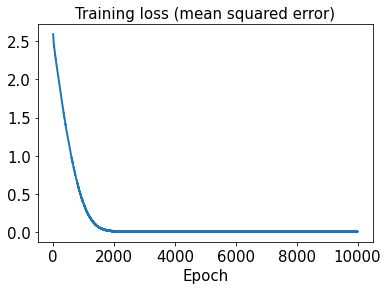

In [63]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

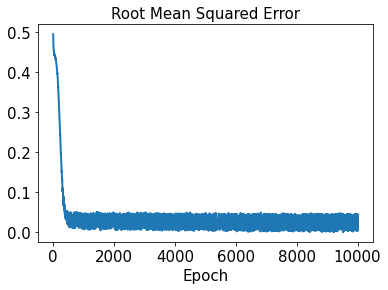

In [64]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [65]:
sd2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [66]:
start2 = datetime.datetime.now()
history2 = sd2.fit(x_train2, y_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 19ms/step - loss: 2.6823 - rmse: 1.6378
Epoch 2/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.6732 - rmse: 1.6350
Epoch 3/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6647 - rmse: 1.6324
Epoch 4/10000
2/2 [==============================] - 0s 22ms/step - loss: 2.6564 - rmse: 1.6298
Epoch 5/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.6481 - rmse: 1.6273
Epoch 6/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6399 - rmse: 1.6248
Epoch 7/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.6317 - rmse: 1.6222
Epoch 8/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6235 - rmse: 1.6197
Epoch 9/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.6154 - rmse: 1.6172
Epoch 10/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6074 - rmse: 1.6147
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 9ms/step - loss: 2.0252 - rmse: 1.4230
Epoch 87/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0169 - rmse: 1.4201
Epoch 88/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0104 - rmse: 1.4178
Epoch 89/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0025 - rmse: 1.4150
Epoch 90/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9999 - rmse: 1.4141
Epoch 91/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9936 - rmse: 1.4119
Epoch 92/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9880 - rmse: 1.4099
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9755 - rmse: 1.4055
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9712 - rmse: 1.4039
Epoch 95/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9641 - rmse: 1.4014
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 6ms/step - loss: 1.4285 - rmse: 1.1952
Epoch 171/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4231 - rmse: 1.1929
Epoch 172/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4113 - rmse: 1.1879
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4053 - rmse: 1.1854
Epoch 174/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3971 - rmse: 1.1819
Epoch 175/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.3944 - rmse: 1.1808
Epoch 176/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3825 - rmse: 1.1757
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3748 - rmse: 1.1725
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3706 - rmse: 1.1707
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3600 - rmse: 1.1661
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.8505 - rmse: 0.9222
Epoch 255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8495 - rmse: 0.9216
Epoch 256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8410 - rmse: 0.9170
Epoch 257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8306 - rmse: 0.9113
Epoch 258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8244 - rmse: 0.9079
Epoch 259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8182 - rmse: 0.9045
Epoch 260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8155 - rmse: 0.9030
Epoch 261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8058 - rmse: 0.8976
Epoch 262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8028 - rmse: 0.8960
Epoch 263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7938 - rmse: 0.8909
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.4299 - rmse: 0.6557
Epoch 339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4202 - rmse: 0.6482
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4170 - rmse: 0.6457
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4121 - rmse: 0.6419
Epoch 342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4083 - rmse: 0.6389
Epoch 343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4074 - rmse: 0.6382
Epoch 344/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.4039 - rmse: 0.6355
Epoch 345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3961 - rmse: 0.6294
Epoch 346/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.3943 - rmse: 0.6279
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3885 - rmse: 0.6232
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 10ms/step - loss: 0.1879 - rmse: 0.4334
Epoch 423/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1896 - rmse: 0.4354
Epoch 424/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1819 - rmse: 0.4264
Epoch 425/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1797 - rmse: 0.4239
Epoch 426/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1808 - rmse: 0.4252
Epoch 427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1827 - rmse: 0.4273
Epoch 428/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1747 - rmse: 0.4179
Epoch 429/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1728 - rmse: 0.4156
Epoch 430/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1723 - rmse: 0.4150
Epoch 431/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1720 - rmse: 0.4147
Epoch 432/10000
2/2 [==================

2/2 [==============================] - 0s 7ms/step - loss: 0.0779 - rmse: 0.2790
Epoch 507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0756 - rmse: 0.2750
Epoch 508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0710 - rmse: 0.2663
Epoch 509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0754 - rmse: 0.2745
Epoch 510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0694 - rmse: 0.2634
Epoch 511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0686 - rmse: 0.2617
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0720 - rmse: 0.2683
Epoch 513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0670 - rmse: 0.2588
Epoch 514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0693 - rmse: 0.2631
Epoch 515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0665 - rmse: 0.2579
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0246 - rmse: 0.1568
Epoch 591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0278 - rmse: 0.1667
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0246 - rmse: 0.1567
Epoch 593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0268 - rmse: 0.1637
Epoch 594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0233 - rmse: 0.1526
Epoch 595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0248 - rmse: 0.1573
Epoch 596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0249 - rmse: 0.1575
Epoch 597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0260 - rmse: 0.1613
Epoch 598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0225 - rmse: 0.1499
Epoch 599/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0231 - rmse: 0.1519
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 6ms/step - loss: 0.0083 - rmse: 0.0908
Epoch 675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0901
Epoch 676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0916
Epoch 677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0109 - rmse: 0.1044
Epoch 678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0889
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0119 - rmse: 0.1087
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0142 - rmse: 0.1192
Epoch 682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - rmse: 0.0995
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0929
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0985
Epoch 759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0744
Epoch 760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0091 - rmse: 0.0950
Epoch 761/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 765/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 767/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 843/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 844/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0715
Epoch 845/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 846/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 847/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 848/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0710
Epoch 849/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 850/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0776
Epoch 851/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8093e-04 - rmse: 0.0291
Epoch 852/10000
2/2 [============

2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 926/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 931/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 933/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 934/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2264e-04 - rmse: 0.0198
Epoch 935/10000
2/2 [=====================

2/2 [==============================] - 0s 9ms/step - loss: 2.0408e-04 - rmse: 0.0133
Epoch 1009/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 1010/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 1011/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 1012/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 1013/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7339e-04 - rmse: 0.0211
Epoch 1014/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 1015/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5596e-04 - rmse: 0.0251
Epoch 1016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 1018/10000
2/

2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 1091/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6822e-04 - rmse: 0.0185
Epoch 1092/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7057e-04 - rmse: 0.0211
Epoch 1093/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 1094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 1095/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4378e-04 - rmse: 0.0249
Epoch 1096/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4355e-04 - rmse: 0.0228
Epoch 1097/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3047e-04 - rmse: 0.0201
Epoch 1098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 1099/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 1100/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0575
Epoch 1173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 1174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 1175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 1176/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5660e-04 - rmse: 0.0182
Epoch 1177/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5655e-04 - rmse: 0.0182
Epoch 1178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 1179/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6709e-04 - rmse: 0.0156
Epoch 1180/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0619
Epoch 1181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 1182/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 1255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 1256/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1178e-04 - rmse: 0.0197
Epoch 1257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 1258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 1259/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5202e-04 - rmse: 0.0270
Epoch 1260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0799
Epoch 1261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 1262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 1263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0789
Epoch 1264/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 1337/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 1338/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 1339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0849
Epoch 1340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 1341/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 1342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0800
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 1344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0703
Epoch 1345/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5271e-04 - rmse: 0.0305
Epoch 1346/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 7.1850e-05 - rmse: 0.0071
Epoch 1419/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 1420/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 1421/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 1422/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 1423/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 1424/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0733
Epoch 1425/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0744
Epoch 1426/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 1427/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 1428/10000
2/2 [==

2/2 [==============================] - 0s 6ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 1501/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 1502/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 1503/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5947e-04 - rmse: 0.0155
Epoch 1504/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 1505/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4037e-04 - rmse: 0.0205
Epoch 1506/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 1507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 1508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 1509/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3364e-04 - rmse: 0.0177
Epoch 1510/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0065 - rmse: 0.0806
Epoch 1584/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 1585/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0090 - rmse: 0.0947
Epoch 1586/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 1587/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 1588/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 1589/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0075 - rmse: 0.0867
Epoch 1590/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 1591/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 1592/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0762
Epoch 1593/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 1666/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 1667/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 1668/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7176e-04 - rmse: 0.0309
Epoch 1669/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0703
Epoch 1670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0673
Epoch 1671/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2205e-04 - rmse: 0.0201
Epoch 1672/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7319e-04 - rmse: 0.0235
Epoch 1673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 1674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 1675/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 9.8106e-05 - rmse: 0.0089
Epoch 1748/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 1749/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 1750/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 1751/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3023e-04 - rmse: 0.0146
Epoch 1752/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 1753/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 1754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 1755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0886
Epoch 1756/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 1757/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 1831/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 1832/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 1833/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1071e-04 - rmse: 0.0171
Epoch 1834/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9176e-04 - rmse: 0.0218
Epoch 1835/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5221e-05 - rmse: 0.0042
Epoch 1836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 1837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 1838/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9194e-04 - rmse: 0.0132
Epoch 1839/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 1840/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 1913/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9464e-04 - rmse: 0.0279
Epoch 1914/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 1915/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 1916/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0853e-04 - rmse: 0.0263
Epoch 1917/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3056e-04 - rmse: 0.0227
Epoch 1918/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.5646e-04 - rmse: 0.0272
Epoch 1919/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 1920/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9751e-04 - rmse: 0.0134
Epoch 1921/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0586
Epoch 1922/10000


2/2 [==============================] - 0s 12ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 1995/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 1996/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 1997/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 1998/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 1999/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0708
Epoch 2000/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 2001/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.3859e-04 - rmse: 0.0228
Epoch 2002/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 2003/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 2004/10000
2/2 [=

2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 2077/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 2078/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 2079/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 2080/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 2081/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4926e-04 - rmse: 0.0153
Epoch 2082/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 2083/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 2084/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 2085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0404
Epoch 2086/10000
2/2 [===========

2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 2159/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 2160/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5252e-04 - rmse: 0.0183
Epoch 2161/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 2162/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 2163/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 2164/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5899e-04 - rmse: 0.0156
Epoch 2165/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1137e-04 - rmse: 0.0199
Epoch 2166/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 2167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 2168/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 2241/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 2242/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 2243/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0699
Epoch 2244/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0744
Epoch 2245/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0704
Epoch 2246/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3488e-04 - rmse: 0.0268
Epoch 2247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 2248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 2249/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 2250/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 2323/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 2324/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 2325/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1392e-04 - rmse: 0.0173
Epoch 2326/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5716e-04 - rmse: 0.0185
Epoch 2327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 2328/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8771e-04 - rmse: 0.0193
Epoch 2329/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 2330/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 2331/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5983e-04 - rmse: 0.0254
Epoch 2332/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 2405/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 2406/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 2407/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 2408/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 2409/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4181e-04 - rmse: 0.0288
Epoch 2410/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0681
Epoch 2411/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 2412/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 2413/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 2414/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 2487/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 2488/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4208e-04 - rmse: 0.0151
Epoch 2489/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 2490/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 2491/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8241e-04 - rmse: 0.0277
Epoch 2492/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 2493/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 2494/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 2495/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 2496/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 2569/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0619
Epoch 2570/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 2571/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 2572/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0529e-04 - rmse: 0.0095
Epoch 2573/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 2574/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 2575/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 2576/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 2577/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 2578/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 2651/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 2652/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7653e-04 - rmse: 0.0127
Epoch 2653/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3100e-04 - rmse: 0.0227
Epoch 2654/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 2655/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 2656/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 2657/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 2658/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 2659/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 2660/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 2733/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0058 - rmse: 0.0759
Epoch 2734/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.8782e-04 - rmse: 0.0312
Epoch 2735/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.0891e-04 - rmse: 0.0199
Epoch 2736/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 2737/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7589e-04 - rmse: 0.0215
Epoch 2738/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 2739/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 2740/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 2741/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 2742/1000

2/2 [==============================] - 0s 7ms/step - loss: 8.2124e-04 - rmse: 0.0284
Epoch 2815/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 2816/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 2817/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 2818/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 2819/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 2820/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 2821/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 2822/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 2823/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8189e-04 - rmse: 0.0238
Epoch 2824/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 2897/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 2898/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0889
Epoch 2899/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 2900/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 2901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 2902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 2903/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 2904/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 2905/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 2906/10000
2/2 [==============

2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 2980/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 2981/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 2982/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1900e-04 - rmse: 0.0175
Epoch 2983/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0578e-04 - rmse: 0.0281
Epoch 2984/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1807e-04 - rmse: 0.0174
Epoch 2985/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 2986/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8266e-04 - rmse: 0.0130
Epoch 2987/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5439e-05 - rmse: 0.0078
Epoch 2988/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 2989/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 3062/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 3063/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 3064/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 3065/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 3066/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5451e-04 - rmse: 0.0155
Epoch 3067/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 3068/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0616e-05 - rmse: 0.0061
Epoch 3069/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 3070/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 3071/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 3144/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 3145/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 3146/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 3147/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 3148/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 3149/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0827
Epoch 3150/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 3151/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7756e-04 - rmse: 0.0191
Epoch 3152/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 3153/10000
2/2 [=

2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 3226/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 3227/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 3228/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 3229/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 3230/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0709
Epoch 3231/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4495e-04 - rmse: 0.0208
Epoch 3232/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5427e-04 - rmse: 0.0185
Epoch 3233/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.7071e-04 - rmse: 0.0236
Epoch 3234/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 3235/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 2.4733e-04 - rmse: 0.0153
Epoch 3308/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 3309/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 3310/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 3311/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7684e-04 - rmse: 0.0162
Epoch 3312/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0404
Epoch 3313/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 3314/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 3315/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 3316/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 3317/10000
2/2 [=

2/2 [==============================] - 0s 8ms/step - loss: 6.9937e-04 - rmse: 0.0262
Epoch 3390/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0761
Epoch 3391/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 3392/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0698
Epoch 3393/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 3394/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5916e-04 - rmse: 0.0273
Epoch 3395/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 3396/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 3397/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 3398/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 3399/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 6.7649e-04 - rmse: 0.0258
Epoch 3472/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 3473/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 3474/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 3475/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 3476/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 3477/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.6053e-04 - rmse: 0.0291
Epoch 3478/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 3479/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1550e-04 - rmse: 0.0283
Epoch 3480/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 3481/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 3555/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 3556/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 3557/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0851
Epoch 3558/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 3559/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2062e-04 - rmse: 0.0301
Epoch 3560/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1206e-04 - rmse: 0.0223
Epoch 3561/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 3562/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 3563/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 3564/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 3638/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 3639/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 3640/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 3641/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 3642/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 3643/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 3644/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 3645/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 3646/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 3647/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 3721/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8508e-04 - rmse: 0.0239
Epoch 3722/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 3723/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 3724/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 3725/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.4454e-04 - rmse: 0.0152
Epoch 3726/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2358e-04 - rmse: 0.0285
Epoch 3727/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 3728/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2518e-04 - rmse: 0.0177
Epoch 3729/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1183e-04 - rmse: 0.0100
Epoch 3730

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 3803/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 3804/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 3805/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 3806/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 3807/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 3808/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 3809/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 3810/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 3811/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0696
Epoch 3812/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 3886/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 3887/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 3888/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 3889/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 3890/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.1427e-04 - rmse: 0.0283
Epoch 3891/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 3892/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 3893/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 3894/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.2473e-04 - rmse: 0.0285
Epoch 3895/10000
2/

2/2 [==============================] - 0s 7ms/step - loss: 1.3854e-04 - rmse: 0.0112
Epoch 3968/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 3969/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7845e-04 - rmse: 0.0191
Epoch 3970/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 3971/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3775e-04 - rmse: 0.0112
Epoch 3972/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4768e-04 - rmse: 0.0154
Epoch 3973/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 3974/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 3975/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 3976/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 3977/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 4050/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 4051/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4413e-04 - rmse: 0.0288
Epoch 4052/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 4053/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 4054/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 4055/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 4056/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 4057/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 4058/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 4059/10000
2/2 [======

2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0493
Epoch 4133/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 4134/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 4135/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0759
Epoch 4136/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2859e-04 - rmse: 0.0204
Epoch 4137/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 4138/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 4139/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 4140/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 4141/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 4142/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 4215/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 4216/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 4217/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0854
Epoch 4218/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 4219/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4677e-04 - rmse: 0.0271
Epoch 4220/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 4221/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 4222/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8257e-04 - rmse: 0.0217
Epoch 4223/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 4224/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 4297/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 4298/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 4299/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 4300/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 4301/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 4302/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 4303/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 4304/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9038e-04 - rmse: 0.0296
Epoch 4305/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6870e-04 - rmse: 0.0189
Epoch 4306/10000
2/2 [======

2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 4379/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 4380/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 4381/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0886
Epoch 4382/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0090 - rmse: 0.0947
Epoch 4383/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 4384/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 4385/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0714
Epoch 4386/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 4387/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 4388/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 4462/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 4463/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 4464/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7120e-04 - rmse: 0.0161
Epoch 4465/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4060e-04 - rmse: 0.0114
Epoch 4466/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8335e-04 - rmse: 0.0295
Epoch 4467/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 4468/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.6170e-04 - rmse: 0.0187
Epoch 4469/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 4470/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.8660e-04 - rmse: 0.0218
Epoch 4471/1

2/2 [==============================] - 0s 7ms/step - loss: 2.4599e-04 - rmse: 0.0153
Epoch 4544/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 4545/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.8142e-04 - rmse: 0.0259
Epoch 4546/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 4547/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 4548/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8958e-04 - rmse: 0.0133
Epoch 4549/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4663e-04 - rmse: 0.0153
Epoch 4550/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 4551/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 4552/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 4553/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 4626/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 4627/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 4628/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0764
Epoch 4629/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2068e-04 - rmse: 0.0284
Epoch 4630/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 4631/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 4632/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 4633/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0716
Epoch 4634/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 4635/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0700
Epoch 4709/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7166e-04 - rmse: 0.0190
Epoch 4710/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3898e-04 - rmse: 0.0207
Epoch 4711/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 4712/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 4713/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 4714/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0851
Epoch 4715/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 4716/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4602e-04 - rmse: 0.0208
Epoch 4717/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 4718/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 4791/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 4792/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0711
Epoch 4793/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 4794/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 4795/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5964e-04 - rmse: 0.0187
Epoch 4796/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 4797/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 4798/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 4799/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8236e-04 - rmse: 0.0165
Epoch 4800/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 7.5366e-04 - rmse: 0.0272
Epoch 4873/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 4874/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 4875/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3761e-04 - rmse: 0.0250
Epoch 4876/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 4877/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 4878/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 4879/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 4880/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 4881/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 4882/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 9.1030e-04 - rmse: 0.0300
Epoch 4955/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0943e-04 - rmse: 0.0245
Epoch 4956/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0731
Epoch 4957/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7755e-04 - rmse: 0.0238
Epoch 4958/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 4959/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 4960/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0854
Epoch 4961/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0709
Epoch 4962/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 4963/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1926e-04 - rmse: 0.0225
Epoch 4964/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 5038/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 5039/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 5040/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 5041/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6894e-04 - rmse: 0.0214
Epoch 5042/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 5043/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0776
Epoch 5044/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 5045/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 5046/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 5047/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 5121/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7655e-04 - rmse: 0.0129
Epoch 5122/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 5123/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 5124/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 5125/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 5126/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9130e-04 - rmse: 0.0195
Epoch 5127/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 5128/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2451e-04 - rmse: 0.0106
Epoch 5129/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 5130/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 1.8573e-04 - rmse: 0.0132
Epoch 5203/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7366e-04 - rmse: 0.0276
Epoch 5204/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 5205/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 5206/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 5207/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 5208/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0763
Epoch 5209/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8749e-04 - rmse: 0.0279
Epoch 5210/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0859
Epoch 5211/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 5212/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 5286/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 5287/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 5288/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 5289/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 5290/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 5291/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0586
Epoch 5292/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 5293/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 5294/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 5295/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 9.6990e-04 - rmse: 0.0310
Epoch 5369/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 5370/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.0890e-04 - rmse: 0.0245
Epoch 5371/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 5372/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 5373/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 5374/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 5375/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 5376/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4855e-04 - rmse: 0.0117
Epoch 5377/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 5378/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 5451/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 5452/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0681
Epoch 5453/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4593e-04 - rmse: 0.0252
Epoch 5454/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 5455/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 5456/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 5457/10000
2/2 [==============================] - 0s 18ms/step - loss: 5.5963e-04 - rmse: 0.0234
Epoch 5458/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.1790e-04 - rmse: 0.0144
Epoch 5459/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 5460/10000
2/2

2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 5533/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 5534/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7691e-04 - rmse: 0.0238
Epoch 5535/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2645e-04 - rmse: 0.0147
Epoch 5536/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 5537/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 5538/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 5539/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6034e-04 - rmse: 0.0122
Epoch 5540/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 5541/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6576e-04 - rmse: 0.0124
Epoch 5542/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 5615/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7919e-04 - rmse: 0.0238
Epoch 5616/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5409e-04 - rmse: 0.0273
Epoch 5617/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 5618/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1327e-04 - rmse: 0.0174
Epoch 5619/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 5620/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 5621/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 5622/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 5623/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.5139e-04 - rmse: 0.0307
Epoch 5624/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 7.1040e-04 - rmse: 0.0264
Epoch 5697/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2111e-04 - rmse: 0.0247
Epoch 5698/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 5699/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5781e-04 - rmse: 0.0291
Epoch 5700/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 5701/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 5702/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.7396e-04 - rmse: 0.0276
Epoch 5703/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0101e-04 - rmse: 0.0298
Epoch 5704/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 5705/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 5706/10000


2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 5779/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8566e-04 - rmse: 0.0166
Epoch 5780/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4633e-04 - rmse: 0.0209
Epoch 5781/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0827
Epoch 5782/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5242e-04 - rmse: 0.0253
Epoch 5783/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 5784/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 5785/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5786/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 5787/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2329e-04 - rmse: 0.0267
Epoch 5788/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 7.3306e-04 - rmse: 0.0269
Epoch 5861/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 5862/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7023e-04 - rmse: 0.0161
Epoch 5863/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 5864/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 5865/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 5866/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 5867/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 5868/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0756
Epoch 5869/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8740e-04 - rmse: 0.0240
Epoch 5870/10000
2/2 [=

2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 5943/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 5944/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 5945/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 5946/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0044e-05 - rmse: 0.0044
Epoch 5947/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 5948/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 5949/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2159e-04 - rmse: 0.0145
Epoch 5950/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 5951/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.7997e-04 - rmse: 0.0130
Epoch 5952/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 3.3816e-04 - rmse: 0.0181
Epoch 6025/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4073e-05 - rmse: 0.0080
Epoch 6026/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3043e-05 - rmse: 0.0085
Epoch 6027/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 6028/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 6029/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7758e-04 - rmse: 0.0163
Epoch 6030/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 6031/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.1752e-04 - rmse: 0.0266
Epoch 6032/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 6033/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 6034/100

2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0744
Epoch 6107/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 6108/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 6109/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 6110/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 6111/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 6112/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8120e-04 - rmse: 0.0192
Epoch 6113/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6426e-04 - rmse: 0.0235
Epoch 6114/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 6115/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 6116/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 8.5136e-05 - rmse: 0.0086
Epoch 6189/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 6190/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 6191/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 6192/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 6193/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 6194/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5149e-05 - rmse: 0.0092
Epoch 6195/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 6196/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 6197/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0723
Epoch 6198/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 3.2358e-04 - rmse: 0.0177
Epoch 6271/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 6272/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8154e-04 - rmse: 0.0295
Epoch 6273/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 6274/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8818e-04 - rmse: 0.0296
Epoch 6275/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 6276/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5089e-04 - rmse: 0.0118
Epoch 6277/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 6278/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 6279/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 6280/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 6.8682e-04 - rmse: 0.0260
Epoch 6353/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 6354/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 6355/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 6356/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 6357/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4931e-04 - rmse: 0.0209
Epoch 6358/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 6359/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1962e-04 - rmse: 0.0176
Epoch 6360/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7290e-04 - rmse: 0.0162
Epoch 6361/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 6362/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6435/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0744
Epoch 6436/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 6437/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 6438/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8647e-04 - rmse: 0.0166
Epoch 6439/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 6440/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 6441/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 6442/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 6443/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 6444/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 1.9361e-04 - rmse: 0.0135
Epoch 6517/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 6518/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7251e-04 - rmse: 0.0215
Epoch 6519/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 6520/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 6521/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 6522/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 6523/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 6524/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 6525/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5721e-04 - rmse: 0.0211
Epoch 6526/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 6599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0796
Epoch 6600/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 6601/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 6602/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0853
Epoch 6603/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 6604/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0789
Epoch 6605/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0714
Epoch 6606/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0720
Epoch 6607/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0090 - rmse: 0.0949
Epoch 6608/10000
2/2 [===============

2/2 [==============================] - 0s 19ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 6682/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 6683/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 6684/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.5173e-04 - rmse: 0.0272
Epoch 6685/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9108e-04 - rmse: 0.0261
Epoch 6686/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 6687/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 6688/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 6689/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 6690/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 6691/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 6764/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0249e-04 - rmse: 0.0299
Epoch 6765/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0764
Epoch 6766/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1476e-04 - rmse: 0.0265
Epoch 6767/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 6768/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1461e-04 - rmse: 0.0284
Epoch 6769/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 6770/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 6771/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 6772/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.9976e-04 - rmse: 0.0262
Epoch 6773/10000
2/2 

2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 6846/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 6847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 6848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 6849/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4275e-04 - rmse: 0.0152
Epoch 6850/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 6851/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9275e-04 - rmse: 0.0261
Epoch 6852/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 6853/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 6854/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 6855/10000
2/2 [======

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 6928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0793
Epoch 6929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 6930/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3349e-04 - rmse: 0.0149
Epoch 6931/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 6932/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8622e-04 - rmse: 0.0218
Epoch 6933/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0789
Epoch 6934/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8421e-04 - rmse: 0.0165
Epoch 6935/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 6936/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 6937/10000
2/2 [===

Epoch 7010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 7011/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 7012/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 7013/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3926e-04 - rmse: 0.0251
Epoch 7014/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.7919e-04 - rmse: 0.0277
Epoch 7015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 7016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 7017/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0765
Epoch 7018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 7019/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6666e-04 - rmse: 0.0236
Epoch 70

2/2 [==============================] - 0s 6ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 7094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 7095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 7096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0866
Epoch 7097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 7098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 7099/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 7100/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 7101/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 7102/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 7103/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 7177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 7178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 7179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 7180/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8195e-04 - rmse: 0.0131
Epoch 7181/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 7182/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0504
Epoch 7183/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4823e-04 - rmse: 0.0117
Epoch 7184/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 7185/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0595
Epoch 7186/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 3.8771e-04 - rmse: 0.0194
Epoch 7259/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4576e-04 - rmse: 0.0183
Epoch 7260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 7261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 7262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 7263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 7264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 7265/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1948e-04 - rmse: 0.0104
Epoch 7266/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5182e-04 - rmse: 0.0185
Epoch 7267/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 7268/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 9.2410e-04 - rmse: 0.0302
Epoch 7341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 7342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 7343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 7344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 7345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 7346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0688
Epoch 7347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0714
Epoch 7348/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0720
Epoch 7349/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0504
Epoch 7350/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 7425/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1392e-04 - rmse: 0.0143
Epoch 7426/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9005e-04 - rmse: 0.0219
Epoch 7427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 7428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 7429/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1924e-04 - rmse: 0.0225
Epoch 7430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 7431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 7432/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3877e-04 - rmse: 0.0288
Epoch 7433/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 7507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 7508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 7509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 7510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0405
Epoch 7511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0760
Epoch 7512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0855
Epoch 7513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0847
Epoch 7514/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 7515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 7516/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 7590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 7591/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6828e-04 - rmse: 0.0160
Epoch 7592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 7594/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7889e-04 - rmse: 0.0192
Epoch 7595/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 7596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 7597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 7598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 7599/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 7672/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 7673/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 7674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 7675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 7676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 7677/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 7678/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 7679/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0174e-04 - rmse: 0.0281
Epoch 7680/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 7681/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 7755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 7756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 7757/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 7758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 7759/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8807e-04 - rmse: 0.0167
Epoch 7760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 7761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 7762/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7349e-04 - rmse: 0.0128
Epoch 7763/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4258e-04 - rmse: 0.0152
Epoch 7764/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 7837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 7838/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 7839/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 7840/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 7841/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0784
Epoch 7842/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0868
Epoch 7843/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.4448e-04 - rmse: 0.0306
Epoch 7844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 7845/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4467e-04 - rmse: 0.0252
Epoch 7846/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 7920/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 7921/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2347e-04 - rmse: 0.0146
Epoch 7922/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 7923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 7924/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 7925/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.1573e-04 - rmse: 0.0201
Epoch 7926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 7927/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1082e-04 - rmse: 0.0173
Epoch 7928/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0724e-04 - rmse: 0.0140
Epoch 7929/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 5.2628e-04 - rmse: 0.0227
Epoch 8002/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 8003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 8004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 8005/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 8006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 8007/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.5067e-04 - rmse: 0.0307
Epoch 8008/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0862
Epoch 8009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 8010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 8011/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 8084/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0852
Epoch 8085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0797
Epoch 8086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0891
Epoch 8087/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0802
Epoch 8088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 8089/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0794
Epoch 8090/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 8091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 8092/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2996e-05 - rmse: 0.0072
Epoch 8093/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 2.4484e-04 - rmse: 0.0153
Epoch 8166/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0698
Epoch 8167/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 8168/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 8169/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.8431e-04 - rmse: 0.0132
Epoch 8170/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1125e-04 - rmse: 0.0142
Epoch 8171/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 8172/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 8173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 8174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 8175/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 8248/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0045e-04 - rmse: 0.0221
Epoch 8249/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4476e-05 - rmse: 0.0086
Epoch 8250/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 8251/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5231e-04 - rmse: 0.0119
Epoch 8252/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 8253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 8254/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3376e-04 - rmse: 0.0287
Epoch 8255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 8256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 8257/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 8330/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.1268e-04 - rmse: 0.0142
Epoch 8331/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 8332/10000
2/2 [==============================] - 0s 17ms/step - loss: 1.3222e-04 - rmse: 0.0110
Epoch 8333/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 8334/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 8335/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 8336/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6162e-05 - rmse: 0.0075
Epoch 8337/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 8338/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 8339/10000
2

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8412/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 8413/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 8414/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5261e-04 - rmse: 0.0253
Epoch 8415/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1411e-04 - rmse: 0.0265
Epoch 8416/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0777
Epoch 8417/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 8418/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0821
Epoch 8419/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 8420/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 8421/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 8495/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0441e-04 - rmse: 0.0171
Epoch 8496/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7264e-04 - rmse: 0.0215
Epoch 8497/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 8498/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0723
Epoch 8499/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5865e-04 - rmse: 0.0122
Epoch 8500/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 8501/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6543e-05 - rmse: 0.0051
Epoch 8502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 8503/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1897e-04 - rmse: 0.0144
Epoch 8504/10000


2/2 [==============================] - 0s 7ms/step - loss: 6.5809e-04 - rmse: 0.0255
Epoch 8577/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 8578/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3271e-04 - rmse: 0.0111
Epoch 8579/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 8580/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 8581/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0815
Epoch 8582/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0463e-04 - rmse: 0.0222
Epoch 8583/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8666e-04 - rmse: 0.0133
Epoch 8584/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0833
Epoch 8585/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 8586/10000
2

2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 8659/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 8660/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5328e-04 - rmse: 0.0185
Epoch 8661/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 8662/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4664e-04 - rmse: 0.0117
Epoch 8663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 8664/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 8665/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 8666/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4235e-04 - rmse: 0.0271
Epoch 8667/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4498e-04 - rmse: 0.0271
Epoch 8668/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 8741/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 8742/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 8743/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 8744/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7240e-04 - rmse: 0.0190
Epoch 8745/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 8746/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7451e-04 - rmse: 0.0191
Epoch 8747/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 8748/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 8749/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4157e-04 - rmse: 0.0182
Epoch 8750/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 8823/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 8824/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 8825/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 8826/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 8827/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 8828/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 8829/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 8830/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0863
Epoch 8831/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 8832/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 2.7998e-04 - rmse: 0.0164
Epoch 8906/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4715e-04 - rmse: 0.0289
Epoch 8907/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 8908/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 8909/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0837e-04 - rmse: 0.0141
Epoch 8910/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 8911/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 8912/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3285e-04 - rmse: 0.0229
Epoch 8913/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7427e-04 - rmse: 0.0163
Epoch 8914/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 8915/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 8988/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 8989/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2123e-04 - rmse: 0.0145
Epoch 8990/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 8991/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1572e-04 - rmse: 0.0246
Epoch 8992/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 8993/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7107e-04 - rmse: 0.0257
Epoch 8994/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0404
Epoch 8995/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 8996/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 8997/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 9070/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 9071/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 9072/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7362e-04 - rmse: 0.0294
Epoch 9073/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 9074/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 9075/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1074e-04 - rmse: 0.0142
Epoch 9076/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5644e-04 - rmse: 0.0211
Epoch 9077/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 9078/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.5674e-05 - rmse: 0.0081
Epoch 9079/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 9153/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 9154/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0481e-04 - rmse: 0.0098
Epoch 9155/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 9156/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.1215e-05 - rmse: 0.0078
Epoch 9157/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 9158/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 9159/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 9160/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 9161/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3405e-04 - rmse: 0.0287
Epoch 9162/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 9236/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0568e-04 - rmse: 0.0172
Epoch 9237/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0699
Epoch 9238/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 9239/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3723e-04 - rmse: 0.0151
Epoch 9240/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 9241/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2829e-04 - rmse: 0.0148
Epoch 9242/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0643
Epoch 9243/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0504
Epoch 9244/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 9245/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 9318/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 9319/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 9320/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 9321/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 9322/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1290e-04 - rmse: 0.0102
Epoch 9323/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 9324/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0771
Epoch 9325/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.9301e-04 - rmse: 0.0135
Epoch 9326/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 9327/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 9400/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7732e-04 - rmse: 0.0164
Epoch 9401/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 9402/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1318e-04 - rmse: 0.0174
Epoch 9403/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 9404/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 9405/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7762e-04 - rmse: 0.0192
Epoch 9406/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 9407/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7964e-04 - rmse: 0.0130
Epoch 9408/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4622e-04 - rmse: 0.0154
Epoch 9409/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 9482/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 9483/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 9484/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.9492e-04 - rmse: 0.0169
Epoch 9485/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 9486/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.3788e-04 - rmse: 0.0251
Epoch 9487/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 9488/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.4820e-04 - rmse: 0.0253
Epoch 9489/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1796e-05 - rmse: 0.0035
Epoch 9490/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 9491/1000

2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 9564/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 9565/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6038e-04 - rmse: 0.0123
Epoch 9566/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 9567/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 9568/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9227e-05 - rmse: 0.0083
Epoch 9569/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2920e-04 - rmse: 0.0109
Epoch 9570/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 9571/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 9572/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4019e-04 - rmse: 0.0114
Epoch 9573/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 9647/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 9648/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.8243e-04 - rmse: 0.0193
Epoch 9649/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 9650/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 9651/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7091e-04 - rmse: 0.0162
Epoch 9652/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 9653/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1899e-04 - rmse: 0.0266
Epoch 9654/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 9655/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2017e-04 - rmse: 0.0302
Epoch 9656/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 9730/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0888
Epoch 9731/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 9732/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1048e-04 - rmse: 0.0174
Epoch 9733/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 9734/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4122e-04 - rmse: 0.0208
Epoch 9735/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 9736/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7131e-04 - rmse: 0.0190
Epoch 9737/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2301e-04 - rmse: 0.0227
Epoch 9738/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 9739/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 9812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 9813/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 9814/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 9815/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 9816/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 9817/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0603
Epoch 9818/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0700
Epoch 9819/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 9820/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 9821/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 1.4401e-04 - rmse: 0.0116
Epoch 9895/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 9896/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4297e-05 - rmse: 0.0081
Epoch 9897/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 9898/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 9899/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 9900/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 9901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 9902/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5961e-05 - rmse: 0.0061
Epoch 9903/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 9904/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 9977/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 9978/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 9979/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 9980/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2419e-04 - rmse: 0.0204
Epoch 9981/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0793
Epoch 9982/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.3381e-04 - rmse: 0.0180
Epoch 9983/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 9984/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0499
Epoch 9985/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 9986/10000
2/2 [=======

In [67]:
time2 = end2 - start2
print("Training time (Case 2):", time2)

Training time (Case 2): 0:02:58.680981


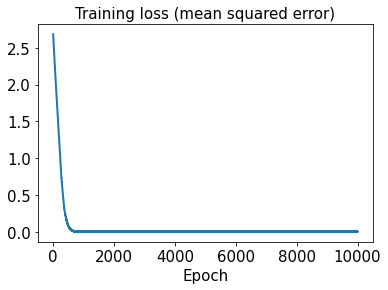

In [68]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

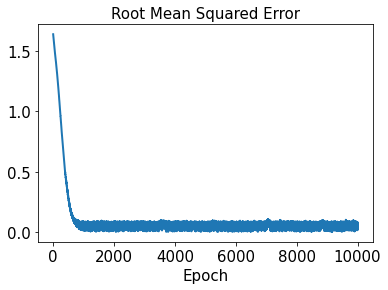

In [69]:
plt.plot(hist2['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [70]:
test_results2 = sd2.evaluate(x_test2)

1/1 [==============================] - 0s 82ms/step - loss: 9.1215e-06 - rmse: 0.0000e+00


In [71]:
decoded_sensor_train2 = sensor_pred2.predict(t_train)

In [72]:
decoded_sensor_test2 = sensor_pred2.predict(t_test)

In [73]:
decoded_train2 = sd2.predict(decoded_sensor_train2)

In [74]:
decoded_test2 = sd2.predict(decoded_sensor_test2)

In [75]:
error_train_abs2 = np.abs(decoded_train2 - y_train2)

In [76]:
error_test_abs2 = np.abs(decoded_test2 - y_test2)

In [77]:
l2_error_train2 = np.sqrt(np.sum((decoded_train2 - y_train2)**2) / np.sum(y_train2**2))
print(l2_error_train2)

0.13180852870481455


In [78]:
l2_error_test2 = np.sqrt(np.sum((decoded_test2 - y_test2)**2) / np.sum(y_test2**2))
print(l2_error_test2)

0.11783604085625272


In [79]:
l2_error_train_list2 = []
for i in range(0, len(x_train2)):
    l2_error_train_data2 = np.sqrt(np.sum((decoded_train2[i] - y_train2[i])**2) / np.sum(y_train2[i]**2))
    l2_error_train_list2.append(l2_error_train_data2)
print(l2_error_train_list2)

[0.12457520562197522, 0.2488478688423448, 0.08740535511415978, 0.14482403071405062, 0.03746393832358455, 0.21525129793506276, 0.07826664106505175, 0.13559488519522442, 0.05753069736247055, 0.12100688353588897, 0.12677639333551788, 0.19165255737912948, 0.10188558750041356, 0.24341206734130433, 0.1691448088771471, 0.20943373823129416, 0.12952368588205235, 0.023238166552788923, 0.22582203508147594, 0.13323074203735905, 0.1085314879919519, 0.23190821921568427, 0.11457512396974166, 0.046312100942134095, 0.13266778418109829, 0.1922886357596445, 0.03494861797190748, 0.01803677109718007, 0.01116353053688885, 0.2540856073927345, 0.09970443845084286, 0.11031939404847584, 0.10173042248978133]


In [80]:
l2_error_test_list2 = []
for i in range(0, len(x_test2)):
    l2_error_test_data2 = np.sqrt(np.sum((decoded_test2[i] - y_test2[i])**2) / np.sum(y_test2[i]**2))
    l2_error_test_list2.append(l2_error_test_data2)
print(l2_error_test_list2)

[0.05734204979449378, 0.12187759766279171, 0.2392588102510814, 0.07238750050816742, 0.23776836634714485, 0.08875005668246272, 0.00131190975146981, 0.09513830461590529]


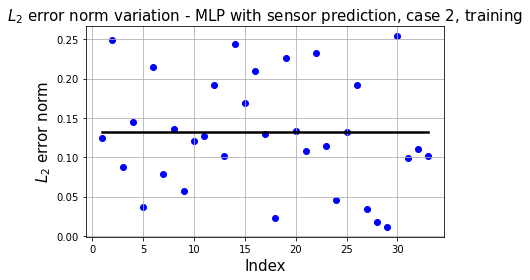

In [81]:
plt.plot(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train2*np.ones(x_train2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

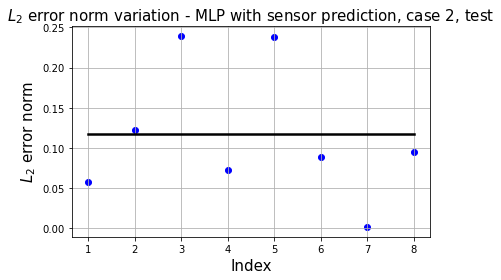

In [82]:
plt.plot(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test2*np.ones(x_test2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

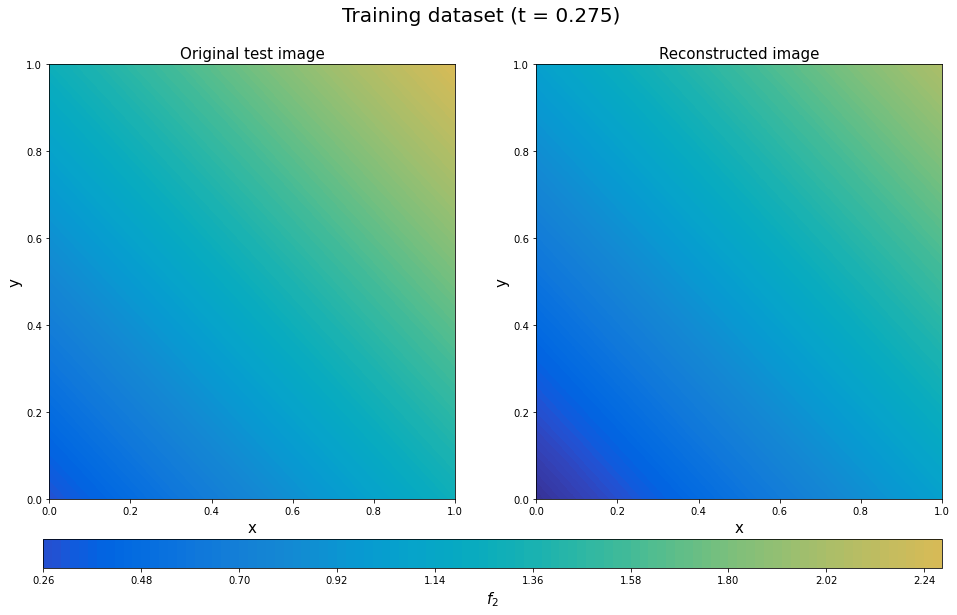

In [83]:
plt.figure(figsize=(16, 8))
y_train2_14_rotate = y_train2[14].T.reshape(101,101)
decoded_rotate2 = decoded_train2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_14_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[11]),fontsize=20)
plt.show()

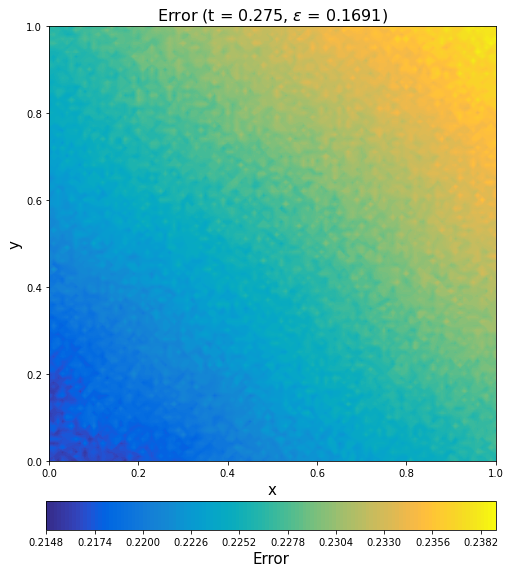

In [84]:
error_train_abs2_rotate14 = error_train_abs2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate14, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.275, $\epsilon$ = %.4f)' %(l2_error_train_list2[14]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

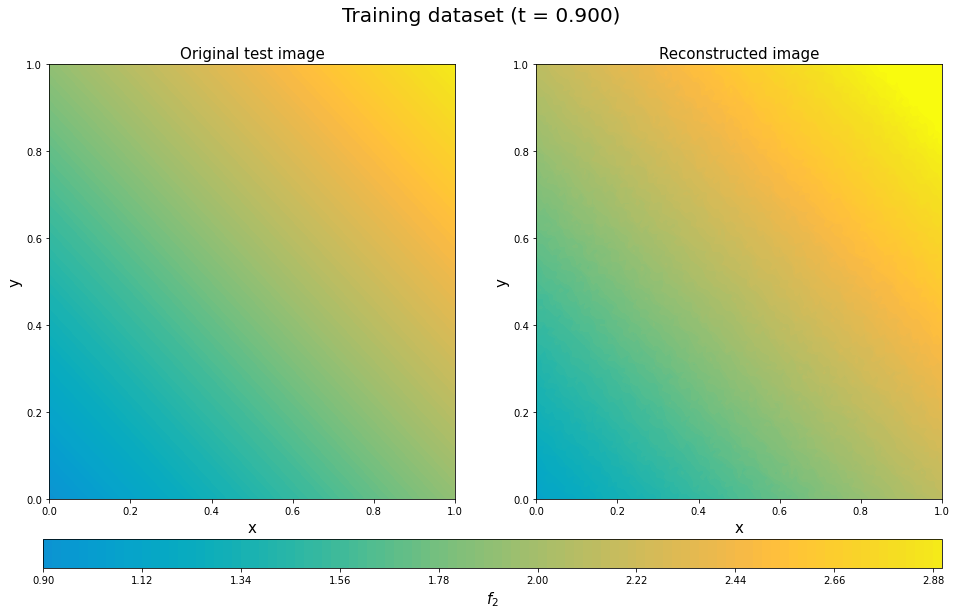

In [85]:
plt.figure(figsize=(16, 8))
y_train2_22_rotate = y_train2[22].T.reshape(101,101)
decoded_rotate2 = decoded_train2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_22_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[36]), fontsize=20)
plt.show()

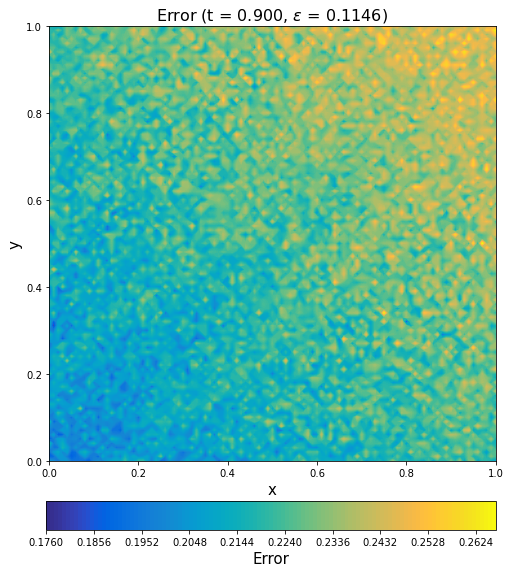

In [86]:
error_train_abs2_rotate22 = error_train_abs2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate22, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.900, $\epsilon$ = %.4f)' %(l2_error_train_list2[22]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

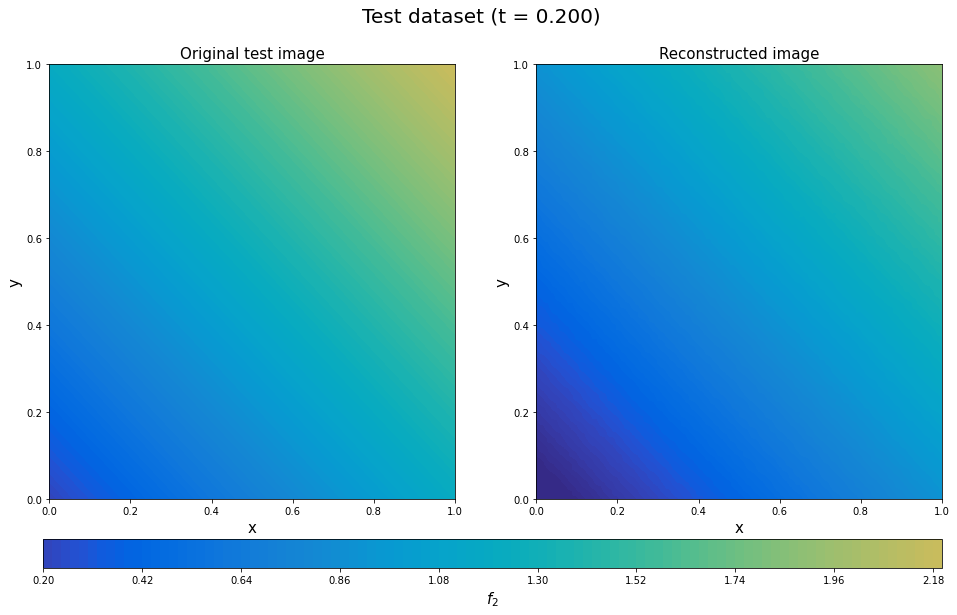

In [87]:
plt.figure(figsize=(16, 8))
y_test2_2_rotate = y_test2[2].T.reshape(101,101)
decoded_rotate2 = decoded_test2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

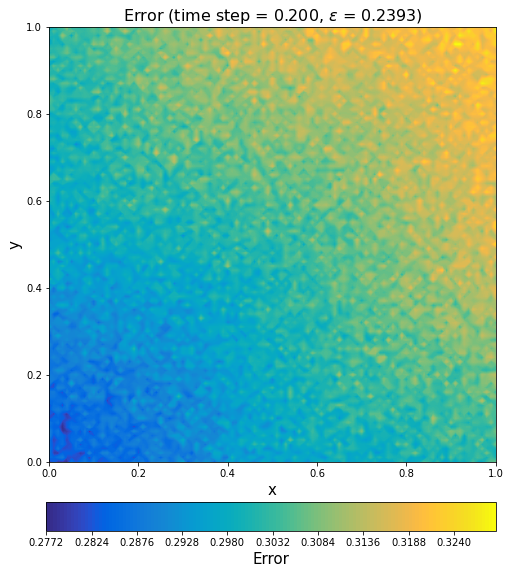

In [88]:
error_test_abs2_rotate2 = error_test_abs2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (time step = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list2[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

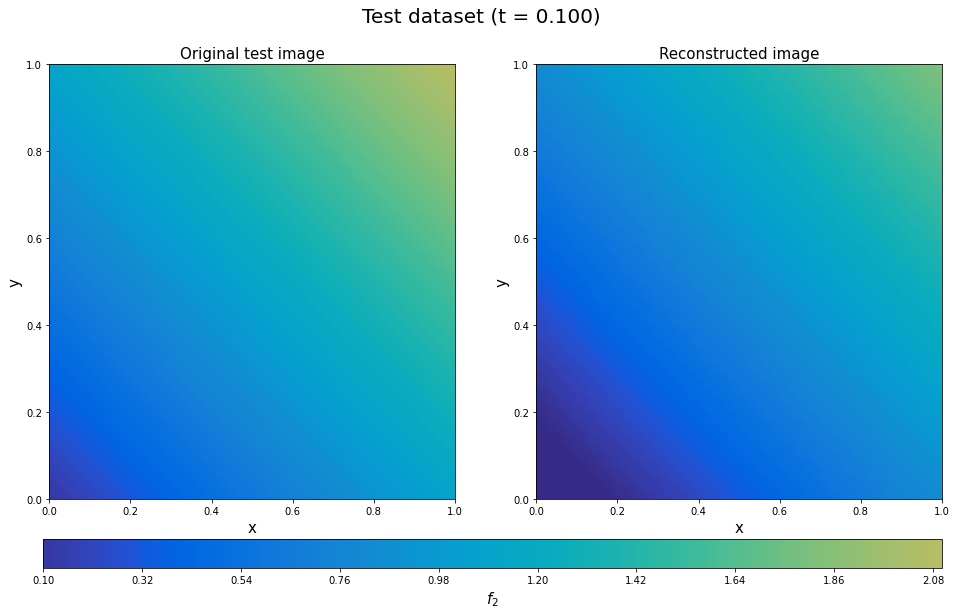

In [89]:
plt.figure(figsize=(16, 8))
y_test2_4_rotate = y_test2[4].T.reshape(101,101)
decoded_rotate2 = decoded_test2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_4_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[4]),fontsize=20)
plt.show()

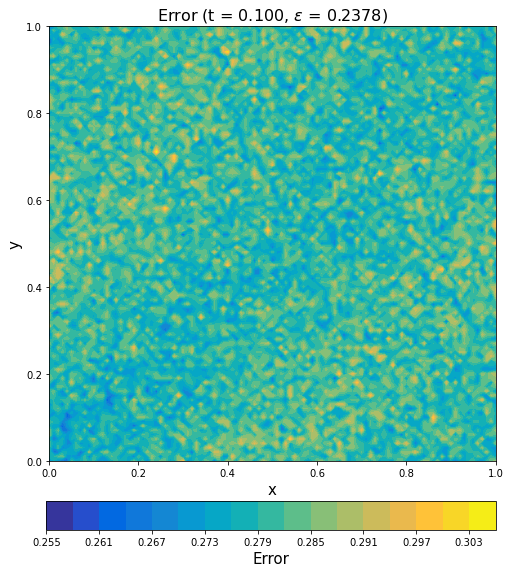

In [90]:
error_test_abs2_rotate4 = error_test_abs2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate4, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.100, $\epsilon$ = %.4f)' %(l2_error_test_list2[4]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 3: f3

In [91]:
out3 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out3[i, j, k] = np.exp(-t[i])*(2*np.sin(2*np.pi*x[j]) + np.sin(2*np.pi*x[j])*np.cos(2*np.pi*y[k]))

In [92]:
sensor3 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor3[i, j, k] = out3[i, 20*(j+1)+1, 20*(k+1)+1]

In [93]:
sensor3 = sensor3.reshape((41, 16, 1))

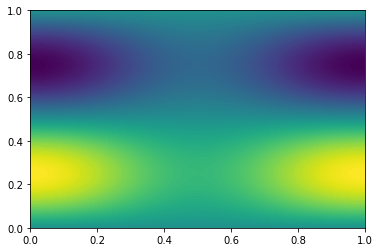

In [94]:
plt.contourf(xmesh, ymesh, out3[0,:,:], levels=128)

In [95]:
x_train3, x_test3, y_train3, y_test3, t_train, t_test = train_test_split(sensor3, out3, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [96]:
x_test3

array([[[ 1.19533543],
        [ 0.61432027],
        [ 0.65355792],
        [ 1.25882328],
        [ 0.66126769],
        [ 0.33984615],
        [ 0.36155269],
        [ 0.6963896 ],
        [-0.78664952],
        [-0.4042838 ],
        [-0.43010607],
        [-0.82843084],
        [-1.14744383],
        [-0.58970728],
        [-0.62737286],
        [-1.20838802]],

       [[ 1.57369576],
        [ 0.80877148],
        [ 0.86042905],
        [ 1.65727946],
        [ 0.8705792 ],
        [ 0.44741788],
        [ 0.4759952 ],
        [ 0.91681827],
        [-1.03564822],
        [-0.53225202],
        [-0.56624783],
        [-1.09065461],
        [-1.510645  ],
        [-0.77636772],
        [-0.82595561],
        [-1.59087989]],

       [[ 1.78323092],
        [ 0.91645815],
        [ 0.97499384],
        [ 1.87794366],
        [ 0.98649548],
        [ 0.50699088],
        [ 0.53937323],
        [ 1.03889121],
        [-1.17354318],
        [-0.60312055],
        [-0.64164286],
       

In [97]:
sensor_pred3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [98]:
start3 = datetime.datetime.now()
history3 = sensor_pred3.fit(t_train, x_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 11ms/step - loss: 3.8526 - rmse: 1.9625
Epoch 2/10000
2/2 [==============================] - 0s 59ms/step - loss: 3.8130 - rmse: 1.9524
Epoch 3/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.7873 - rmse: 1.9458
Epoch 4/10000
2/2 [==============================] - 0s 19ms/step - loss: 3.7700 - rmse: 1.9414
Epoch 5/10000
2/2 [==============================] - 0s 30ms/step - loss: 3.7589 - rmse: 1.9385
Epoch 6/10000
2/2 [==============================] - 0s 20ms/step - loss: 3.7505 - rmse: 1.9364
Epoch 7/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7434 - rmse: 1.9345
Epoch 8/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.7351 - rmse: 1.9324
Epoch 9/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.7265 - rmse: 1.9302
Epoch 10/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.7169 - rmse: 1.9277
Epoch 11/10000
2/2 [====================

2/2 [==============================] - 0s 8ms/step - loss: 3.2205 - rmse: 1.7943
Epoch 87/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2134 - rmse: 1.7923
Epoch 88/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2062 - rmse: 1.7903
Epoch 89/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2022 - rmse: 1.7892
Epoch 90/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1946 - rmse: 1.7871
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1915 - rmse: 1.7862
Epoch 92/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1839 - rmse: 1.7841
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1799 - rmse: 1.7829
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1728 - rmse: 1.7809
Epoch 95/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1682 - rmse: 1.7797
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 8ms/step - loss: 2.7956 - rmse: 1.6717
Epoch 171/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7910 - rmse: 1.6703
Epoch 172/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.7870 - rmse: 1.6691
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7841 - rmse: 1.6682
Epoch 174/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.7797 - rmse: 1.6669
Epoch 175/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.7744 - rmse: 1.6653
Epoch 176/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7697 - rmse: 1.6639
Epoch 177/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.7676 - rmse: 1.6633
Epoch 178/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.7599 - rmse: 1.6610
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7564 - rmse: 1.6599
Epoch 180/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 2.4516 - rmse: 1.5654
Epoch 255/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.4476 - rmse: 1.5641
Epoch 256/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4428 - rmse: 1.5626
Epoch 257/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4392 - rmse: 1.5615
Epoch 258/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.4371 - rmse: 1.5608
Epoch 259/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.4371 - rmse: 1.5608
Epoch 260/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4281 - rmse: 1.5579
Epoch 261/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4257 - rmse: 1.5571
Epoch 262/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4226 - rmse: 1.5562
Epoch 263/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4169 - rmse: 1.5543
Epoch 264/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 2.1625 - rmse: 1.4702
Epoch 339/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1595 - rmse: 1.4692
Epoch 340/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1564 - rmse: 1.4681
Epoch 341/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1538 - rmse: 1.4672
Epoch 342/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1506 - rmse: 1.4661
Epoch 343/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1484 - rmse: 1.4654
Epoch 344/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1448 - rmse: 1.4642
Epoch 345/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1415 - rmse: 1.4630
Epoch 346/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1387 - rmse: 1.4621
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1366 - rmse: 1.4613
Epoch 348/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 1.9246 - rmse: 1.3869
Epoch 423/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9179 - rmse: 1.3845
Epoch 424/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9191 - rmse: 1.3849
Epoch 425/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9120 - rmse: 1.3824
Epoch 426/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9106 - rmse: 1.3819
Epoch 427/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9059 - rmse: 1.3802
Epoch 428/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9049 - rmse: 1.3798
Epoch 429/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9022 - rmse: 1.3788
Epoch 430/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8973 - rmse: 1.3770
Epoch 431/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8972 - rmse: 1.3770
Epoch 432/10000
2/2 [====================

2/2 [==============================] - 0s 8ms/step - loss: 1.7070 - rmse: 1.3061
Epoch 507/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7039 - rmse: 1.3049
Epoch 508/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7016 - rmse: 1.3041
Epoch 509/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7014 - rmse: 1.3040
Epoch 510/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.6975 - rmse: 1.3025
Epoch 511/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.6966 - rmse: 1.3022
Epoch 512/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6932 - rmse: 1.3008
Epoch 513/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6909 - rmse: 1.2999
Epoch 514/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6876 - rmse: 1.2987
Epoch 515/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6912 - rmse: 1.3001
Epoch 516/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 1.5267 - rmse: 1.2352
Epoch 591/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5229 - rmse: 1.2337
Epoch 592/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5209 - rmse: 1.2328
Epoch 593/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5190 - rmse: 1.2321
Epoch 594/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5160 - rmse: 1.2308
Epoch 595/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5167 - rmse: 1.2311
Epoch 596/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5127 - rmse: 1.2295
Epoch 597/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5105 - rmse: 1.2286
Epoch 598/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5091 - rmse: 1.2281
Epoch 599/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5062 - rmse: 1.2269
Epoch 600/10000
2/2 [====================

2/2 [==============================] - 0s 8ms/step - loss: 1.3640 - rmse: 1.1675
Epoch 675/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3659 - rmse: 1.1683
Epoch 676/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3597 - rmse: 1.1656
Epoch 677/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3596 - rmse: 1.1656
Epoch 678/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3605 - rmse: 1.1660
Epoch 679/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3564 - rmse: 1.1642
Epoch 680/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3524 - rmse: 1.1625
Epoch 681/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3512 - rmse: 1.1620
Epoch 682/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3487 - rmse: 1.1609
Epoch 683/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3469 - rmse: 1.1601
Epoch 684/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 1.2209 - rmse: 1.1045
Epoch 759/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2209 - rmse: 1.1045
Epoch 760/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2224 - rmse: 1.1051
Epoch 761/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2165 - rmse: 1.1025
Epoch 762/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2140 - rmse: 1.1014
Epoch 763/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2150 - rmse: 1.1018
Epoch 764/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2152 - rmse: 1.1019
Epoch 765/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2097 - rmse: 1.0994
Epoch 766/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2089 - rmse: 1.0990
Epoch 767/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2109 - rmse: 1.1000
Epoch 768/10000
2/2 [===================

2/2 [==============================] - 0s 12ms/step - loss: 1.0961 - rmse: 1.0464
Epoch 843/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.0909 - rmse: 1.0440
Epoch 844/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0889 - rmse: 1.0430
Epoch 845/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.0877 - rmse: 1.0425
Epoch 846/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0856 - rmse: 1.0414
Epoch 847/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0870 - rmse: 1.0421
Epoch 848/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0874 - rmse: 1.0423
Epoch 849/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0825 - rmse: 1.0399
Epoch 850/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0801 - rmse: 1.0388
Epoch 851/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0806 - rmse: 1.0390
Epoch 852/10000
2/2 [==================

2/2 [==============================] - 0s 10ms/step - loss: 0.9784 - rmse: 0.9886
Epoch 927/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.9743 - rmse: 0.9865
Epoch 928/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9729 - rmse: 0.9858
Epoch 929/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.9721 - rmse: 0.9854
Epoch 930/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.9713 - rmse: 0.9850
Epoch 931/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9698 - rmse: 0.9843
Epoch 932/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.9696 - rmse: 0.9842
Epoch 933/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.9665 - rmse: 0.9826
Epoch 934/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9663 - rmse: 0.9825
Epoch 935/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.9638 - rmse: 0.9812
Epoch 936/10000
2/2 [===================

Epoch 1010/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8725 - rmse: 0.9336
Epoch 1011/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.8747 - rmse: 0.9347
Epoch 1012/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8691 - rmse: 0.9317
Epoch 1013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8696 - rmse: 0.9320
Epoch 1014/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8658 - rmse: 0.9299
Epoch 1015/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8661 - rmse: 0.9301
Epoch 1016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8651 - rmse: 0.9296
Epoch 1017/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.8617 - rmse: 0.9277
Epoch 1018/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8606 - rmse: 0.9271
Epoch 1019/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8596 - rmse: 0.9266
Epoch 1020/100

2/2 [==============================] - 0s 8ms/step - loss: 0.7774 - rmse: 0.8811
Epoch 1094/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.7764 - rmse: 0.8806
Epoch 1095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7749 - rmse: 0.8797
Epoch 1096/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.7734 - rmse: 0.8789
Epoch 1097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7767 - rmse: 0.8807
Epoch 1098/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7710 - rmse: 0.8775
Epoch 1099/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7707 - rmse: 0.8773
Epoch 1100/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7715 - rmse: 0.8778
Epoch 1101/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7721 - rmse: 0.8781
Epoch 1102/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7667 - rmse: 0.8750
Epoch 1103/10000
2/2 [==========

2/2 [==============================] - 0s 12ms/step - loss: 0.6906 - rmse: 0.8304
Epoch 1177/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6914 - rmse: 0.8309
Epoch 1178/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6911 - rmse: 0.8307
Epoch 1179/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6886 - rmse: 0.8292
Epoch 1180/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6892 - rmse: 0.8296
Epoch 1181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6858 - rmse: 0.8275
Epoch 1182/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6847 - rmse: 0.8269
Epoch 1183/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6851 - rmse: 0.8271
Epoch 1184/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6849 - rmse: 0.8270
Epoch 1185/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6827 - rmse: 0.8257
Epoch 1186/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.6117 - rmse: 0.7814
Epoch 1260/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6106 - rmse: 0.7808
Epoch 1261/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6100 - rmse: 0.7804
Epoch 1262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6100 - rmse: 0.7804
Epoch 1263/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6103 - rmse: 0.7806
Epoch 1264/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6083 - rmse: 0.7793
Epoch 1265/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6051 - rmse: 0.7772
Epoch 1266/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6052 - rmse: 0.7773
Epoch 1267/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6032 - rmse: 0.7760
Epoch 1268/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6023 - rmse: 0.7755
Epoch 1269/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.5378 - rmse: 0.7327
Epoch 1343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5371 - rmse: 0.7322
Epoch 1344/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5373 - rmse: 0.7323
Epoch 1345/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5376 - rmse: 0.7325
Epoch 1346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5353 - rmse: 0.7310
Epoch 1347/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5351 - rmse: 0.7308
Epoch 1348/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5339 - rmse: 0.7300
Epoch 1349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5331 - rmse: 0.7295
Epoch 1350/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5343 - rmse: 0.7303
Epoch 1351/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5330 - rmse: 0.7294
Epoch 1352/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.4734 - rmse: 0.6873
Epoch 1426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4723 - rmse: 0.6866
Epoch 1427/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4697 - rmse: 0.6846
Epoch 1428/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4710 - rmse: 0.6856
Epoch 1429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4695 - rmse: 0.6845
Epoch 1430/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4683 - rmse: 0.6836
Epoch 1431/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4701 - rmse: 0.6849
Epoch 1432/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4717 - rmse: 0.6861
Epoch 1433/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4662 - rmse: 0.6821
Epoch 1434/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4677 - rmse: 0.6831
Epoch 1435/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.4158 - rmse: 0.6440
Epoch 1509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4116 - rmse: 0.6408
Epoch 1510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4120 - rmse: 0.6411
Epoch 1511/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4130 - rmse: 0.6419
Epoch 1512/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4102 - rmse: 0.6397
Epoch 1513/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4098 - rmse: 0.6394
Epoch 1514/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4080 - rmse: 0.6380
Epoch 1515/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4075 - rmse: 0.6376
Epoch 1516/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4097 - rmse: 0.6393
Epoch 1517/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4095 - rmse: 0.6391
Epoch 1518/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.3544 - rmse: 0.5945
Epoch 1592/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3529 - rmse: 0.5932
Epoch 1593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3573 - rmse: 0.5969
Epoch 1594/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3527 - rmse: 0.5930
Epoch 1595/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3587 - rmse: 0.5981
Epoch 1596/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3511 - rmse: 0.5917
Epoch 1597/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3563 - rmse: 0.5961
Epoch 1598/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3555 - rmse: 0.5954
Epoch 1599/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3511 - rmse: 0.5917
Epoch 1600/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3522 - rmse: 0.5927
Epoch 1601/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.3031 - rmse: 0.5497
Epoch 1675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3016 - rmse: 0.5483
Epoch 1676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3015 - rmse: 0.5482
Epoch 1677/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3015 - rmse: 0.5482
Epoch 1678/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3067 - rmse: 0.5529
Epoch 1679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3043 - rmse: 0.5507
Epoch 1680/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3016 - rmse: 0.5483
Epoch 1681/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2981 - rmse: 0.5451
Epoch 1682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2976 - rmse: 0.5447
Epoch 1683/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2968 - rmse: 0.5439
Epoch 1684/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.2583 - rmse: 0.5073
Epoch 1758/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2562 - rmse: 0.5052
Epoch 1759/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2547 - rmse: 0.5037
Epoch 1760/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2556 - rmse: 0.5046
Epoch 1761/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2543 - rmse: 0.5033
Epoch 1762/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2560 - rmse: 0.5050
Epoch 1763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2554 - rmse: 0.5045
Epoch 1764/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2552 - rmse: 0.5042
Epoch 1765/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2584 - rmse: 0.5074
Epoch 1766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2536 - rmse: 0.5027
Epoch 1767/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.2202 - rmse: 0.4682
Epoch 1841/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2169 - rmse: 0.4647
Epoch 1842/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2181 - rmse: 0.4660
Epoch 1843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2126 - rmse: 0.4600
Epoch 1844/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2120 - rmse: 0.4593
Epoch 1845/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2148 - rmse: 0.4625
Epoch 1846/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2172 - rmse: 0.4650
Epoch 1847/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2131 - rmse: 0.4606
Epoch 1848/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2113 - rmse: 0.4586
Epoch 1849/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2113 - rmse: 0.4587
Epoch 1850/10000
2/2 [=========

2/2 [==============================] - 0s 13ms/step - loss: 0.1801 - rmse: 0.4232
Epoch 1924/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1808 - rmse: 0.4241
Epoch 1925/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1775 - rmse: 0.4202
Epoch 1926/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1784 - rmse: 0.4212
Epoch 1927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1769 - rmse: 0.4195
Epoch 1928/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1799 - rmse: 0.4230
Epoch 1929/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1780 - rmse: 0.4208
Epoch 1930/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1756 - rmse: 0.4178
Epoch 1931/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1758 - rmse: 0.4182
Epoch 1932/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1745 - rmse: 0.4166
Epoch 1933/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.1473 - rmse: 0.3826
Epoch 2007/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1457 - rmse: 0.3805
Epoch 2008/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1469 - rmse: 0.3821
Epoch 2009/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1450 - rmse: 0.3795
Epoch 2010/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1445 - rmse: 0.3789
Epoch 2011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1465 - rmse: 0.3815
Epoch 2012/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1438 - rmse: 0.3780
Epoch 2013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1466 - rmse: 0.3817
Epoch 2014/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1434 - rmse: 0.3774
Epoch 2015/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1438 - rmse: 0.3779
Epoch 2016/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.1235 - rmse: 0.3501
Epoch 2090/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1191 - rmse: 0.3437
Epoch 2091/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1214 - rmse: 0.3471
Epoch 2092/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1201 - rmse: 0.3451
Epoch 2093/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1166 - rmse: 0.3401
Epoch 2094/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1238 - rmse: 0.3505
Epoch 2095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1176 - rmse: 0.3416
Epoch 2096/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1173 - rmse: 0.3411
Epoch 2097/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1189 - rmse: 0.3435
Epoch 2098/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1215 - rmse: 0.3472
Epoch 2099/10000
2/2 [=========

2/2 [==============================] - 0s 13ms/step - loss: 0.0952 - rmse: 0.3070
Epoch 2173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0945 - rmse: 0.3059
Epoch 2174/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0938 - rmse: 0.3047
Epoch 2175/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0946 - rmse: 0.3060
Epoch 2176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0947 - rmse: 0.3062
Epoch 2177/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0930 - rmse: 0.3034
Epoch 2178/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1012 - rmse: 0.3166
Epoch 2179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0939 - rmse: 0.3048
Epoch 2180/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0943 - rmse: 0.3055
Epoch 2181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0918 - rmse: 0.3015
Epoch 2182/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0753 - rmse: 0.2727
Epoch 2256/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0724 - rmse: 0.2674
Epoch 2257/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0759 - rmse: 0.2737
Epoch 2258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0727 - rmse: 0.2679
Epoch 2259/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0734 - rmse: 0.2692
Epoch 2260/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0790 - rmse: 0.2793
Epoch 2261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0739 - rmse: 0.2701
Epoch 2262/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0712 - rmse: 0.2650
Epoch 2263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0721 - rmse: 0.2667
Epoch 2264/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0720 - rmse: 0.2665
Epoch 2265/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0567 - rmse: 0.2362
Epoch 2339/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0572 - rmse: 0.2372
Epoch 2340/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0560 - rmse: 0.2347
Epoch 2341/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0559 - rmse: 0.2345
Epoch 2342/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0589 - rmse: 0.2407
Epoch 2343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0558 - rmse: 0.2343
Epoch 2344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0580 - rmse: 0.2388
Epoch 2345/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0590 - rmse: 0.2409
Epoch 2346/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0571 - rmse: 0.2369
Epoch 2347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0565 - rmse: 0.2356
Epoch 2348/10000
2/2 [==========

2/2 [==============================] - 0s 8ms/step - loss: 0.0444 - rmse: 0.2086
Epoch 2422/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0464 - rmse: 0.2132
Epoch 2423/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0446 - rmse: 0.2090
Epoch 2424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0471 - rmse: 0.2149
Epoch 2425/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0455 - rmse: 0.2111
Epoch 2426/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0430 - rmse: 0.2050
Epoch 2427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0492 - rmse: 0.2197
Epoch 2428/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0454 - rmse: 0.2109
Epoch 2429/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0478 - rmse: 0.2165
Epoch 2430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0496 - rmse: 0.2207
Epoch 2431/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0347 - rmse: 0.1836
Epoch 2505/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0330 - rmse: 0.1792
Epoch 2506/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0367 - rmse: 0.1892
Epoch 2507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0366 - rmse: 0.1889
Epoch 2508/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0336 - rmse: 0.1807
Epoch 2509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0334 - rmse: 0.1803
Epoch 2510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0335 - rmse: 0.1804
Epoch 2511/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0362 - rmse: 0.1878
Epoch 2512/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0324 - rmse: 0.1775
Epoch 2513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0356 - rmse: 0.1863
Epoch 2514/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0323 - rmse: 0.1771
Epoch 2588/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0267 - rmse: 0.1604
Epoch 2589/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0247 - rmse: 0.1540
Epoch 2590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0280 - rmse: 0.1644
Epoch 2591/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0266 - rmse: 0.1601
Epoch 2592/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0277 - rmse: 0.1635
Epoch 2593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0262 - rmse: 0.1590
Epoch 2594/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0281 - rmse: 0.1649
Epoch 2595/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0255 - rmse: 0.1568
Epoch 2596/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0245 - rmse: 0.1535
Epoch 2597/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0226 - rmse: 0.1472
Epoch 2671/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0200 - rmse: 0.1379
Epoch 2672/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0186 - rmse: 0.1329
Epoch 2673/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0214 - rmse: 0.1431
Epoch 2674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0227 - rmse: 0.1474
Epoch 2675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0270 - rmse: 0.1616
Epoch 2676/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0248 - rmse: 0.1546
Epoch 2677/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0217 - rmse: 0.1441
Epoch 2678/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0192 - rmse: 0.1351
Epoch 2679/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0186 - rmse: 0.1329
Epoch 2680/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0166 - rmse: 0.1254
Epoch 2754/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0169 - rmse: 0.1263
Epoch 2755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0169 - rmse: 0.1263
Epoch 2756/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0177 - rmse: 0.1296
Epoch 2757/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0138 - rmse: 0.1136
Epoch 2758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0136 - rmse: 0.1128
Epoch 2759/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0135 - rmse: 0.1121
Epoch 2760/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0143 - rmse: 0.1158
Epoch 2761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0145 - rmse: 0.1165
Epoch 2762/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0147 - rmse: 0.1173
Epoch 2763/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0106 - rmse: 0.0984
Epoch 2837/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0117 - rmse: 0.1036
Epoch 2838/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0117 - rmse: 0.1036
Epoch 2839/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0129 - rmse: 0.1097
Epoch 2840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0103 - rmse: 0.0966
Epoch 2841/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0115 - rmse: 0.1026
Epoch 2842/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0131 - rmse: 0.1103
Epoch 2843/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0108 - rmse: 0.0992
Epoch 2844/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0102 - rmse: 0.0963
Epoch 2845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0118 - rmse: 0.1044
Epoch 2846/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0880
Epoch 2920/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0085 - rmse: 0.0870
Epoch 2921/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0075 - rmse: 0.0814
Epoch 2922/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0086 - rmse: 0.0874
Epoch 2923/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0816
Epoch 2924/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0150 - rmse: 0.1188
Epoch 2925/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0129 - rmse: 0.1096
Epoch 2926/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0160 - rmse: 0.1226
Epoch 2927/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0831
Epoch 2928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0812
Epoch 2929/10000
2/2 [=========

2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0681
Epoch 3003/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0081 - rmse: 0.0849
Epoch 3004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0752
Epoch 3005/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0093 - rmse: 0.0916
Epoch 3006/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0720
Epoch 3007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0845
Epoch 3008/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0678
Epoch 3009/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0842
Epoch 3010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0742
Epoch 3011/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0055 - rmse: 0.0680
Epoch 3012/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0576
Epoch 3086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0108 - rmse: 0.0995
Epoch 3087/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0847
Epoch 3088/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0107 - rmse: 0.0988
Epoch 3089/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0597
Epoch 3090/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0679
Epoch 3091/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0582
Epoch 3092/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0658
Epoch 3093/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0097 - rmse: 0.0938
Epoch 3094/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0681
Epoch 3095/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0506
Epoch 3169/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0111 - rmse: 0.1009
Epoch 3170/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0648
Epoch 3171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0659
Epoch 3172/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0687
Epoch 3173/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0100 - rmse: 0.0952
Epoch 3174/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0491
Epoch 3175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0107 - rmse: 0.0990
Epoch 3176/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0649
Epoch 3177/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0762
Epoch 3178/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0676
Epoch 3252/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0479
Epoch 3253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0425
Epoch 3254/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0673
Epoch 3255/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0535
Epoch 3256/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0840
Epoch 3257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0840
Epoch 3258/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0608
Epoch 3259/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0894
Epoch 3260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0667
Epoch 3261/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0592
Epoch 3335/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0614
Epoch 3336/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0377
Epoch 3337/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0495
Epoch 3338/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0329
Epoch 3339/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0649
Epoch 3340/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0373
Epoch 3341/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0611
Epoch 3342/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0585
Epoch 3343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0813
Epoch 3344/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0082 - rmse: 0.0852
Epoch 3418/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0683
Epoch 3419/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0327
Epoch 3420/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0922
Epoch 3421/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0610
Epoch 3422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0593
Epoch 3423/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0092 - rmse: 0.0909
Epoch 3424/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0560
Epoch 3425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0276
Epoch 3426/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0315
Epoch 3427/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0484
Epoch 3501/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0342
Epoch 3502/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0611
Epoch 3503/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0058 - rmse: 0.0701
Epoch 3504/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0657
Epoch 3505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0681
Epoch 3506/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0662
Epoch 3507/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0358
Epoch 3508/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0379
Epoch 3509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0669
Epoch 3510/10000
2/2 [===========

2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0491
Epoch 3584/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0292
Epoch 3585/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0915
Epoch 3586/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0574
Epoch 3587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0901
Epoch 3588/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0841
Epoch 3589/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0574
Epoch 3590/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0475
Epoch 3591/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0675
Epoch 3592/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0613
Epoch 3593/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0384
Epoch 3667/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0521
Epoch 3668/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0186
Epoch 3669/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0203
Epoch 3670/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0493
Epoch 3671/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0598
Epoch 3672/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0653
Epoch 3673/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0491
Epoch 3674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0264
Epoch 3675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0177
Epoch 3676/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0508
Epoch 3750/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0538
Epoch 3751/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0156
Epoch 3752/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0821
Epoch 3753/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0817
Epoch 3754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0364
Epoch 3755/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0588
Epoch 3756/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0226
Epoch 3757/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0481
Epoch 3758/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0818
Epoch 3759/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0415
Epoch 3833/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0237
Epoch 3834/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0098 - rmse: 0.0945
Epoch 3835/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0508
Epoch 3836/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0182
Epoch 3837/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0161
Epoch 3838/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0197
Epoch 3839/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0184
Epoch 3840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0344
Epoch 3841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0221
Epoch 3842/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0350
Epoch 3916/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0825
Epoch 3917/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0096 - rmse: 0.0936
Epoch 3918/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0942
Epoch 3919/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0408
Epoch 3920/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0364
Epoch 3921/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0374
Epoch 3922/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0590
Epoch 3923/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0577
Epoch 3924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0647
Epoch 3925/10000
2/2 [=========

2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0417
Epoch 3999/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0384
Epoch 4000/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0147
Epoch 4001/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0534
Epoch 4002/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0205
Epoch 4003/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0582
Epoch 4004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0501
Epoch 4005/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0291
Epoch 4006/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0148
Epoch 4007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0644
Epoch 4008/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 9.6649e-04 - rmse: 0.0103
Epoch 4082/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0499
Epoch 4083/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0223
Epoch 4084/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0319
Epoch 4085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0658
Epoch 4086/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0382
Epoch 4087/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0146
Epoch 4088/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0500
Epoch 4089/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0472
Epoch 4090/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0334
Epoch 4091/10000
2/2 [====

2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0414
Epoch 4165/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0941
Epoch 4166/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0482
Epoch 4167/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0385
Epoch 4168/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0447
Epoch 4169/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0642
Epoch 4170/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0814
Epoch 4171/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0761
Epoch 4172/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0459
Epoch 4173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0644
Epoch 4174/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0508
Epoch 4248/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0426
Epoch 4249/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0557
Epoch 4250/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0660
Epoch 4251/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0584
Epoch 4252/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0229
Epoch 4253/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0199
Epoch 4254/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0140
Epoch 4255/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0086 - rmse: 0.0882
Epoch 4256/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0365
Epoch 4257/10000
2/2 [==========

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0421
Epoch 4331/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0589
Epoch 4332/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0480
Epoch 4333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0758
Epoch 4334/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0510
Epoch 4335/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0365
Epoch 4336/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0565
Epoch 4337/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0539
Epoch 4338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0181
Epoch 4339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0149
Epoch 4340/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0430
Epoch 4414/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0473
Epoch 4415/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0330
Epoch 4416/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0530
Epoch 4417/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0553
Epoch 4418/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0581
Epoch 4419/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0175
Epoch 4420/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0527
Epoch 4421/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0133
Epoch 4422/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0635
Epoch 4423/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0242
Epoch 4497/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0818
Epoch 4498/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0476
Epoch 4499/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0527
Epoch 4500/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0874
Epoch 4501/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0172
Epoch 4502/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0238
Epoch 4503/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0676
Epoch 4504/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0097 - rmse: 0.0939
Epoch 4505/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0499
Epoch 4506/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0321
Epoch 4580/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0659
Epoch 4581/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0550
Epoch 4582/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0468
Epoch 4583/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0579
Epoch 4584/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0157
Epoch 4585/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0440
Epoch 4586/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0580
Epoch 4587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0498
Epoch 4588/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0330
Epoch 4589/10000
2/2 [========

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0194
Epoch 4663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0221
Epoch 4664/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0423
Epoch 4665/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0420
Epoch 4666/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0411
Epoch 4667/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0188
Epoch 4668/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0411
Epoch 4669/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.3831e-04 - rmse: 0.0106
Epoch 4670/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0096 - rmse: 0.0939
Epoch 4671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0591
Epoch 4672/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0572
Epoch 4746/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0249
Epoch 4747/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0054 - rmse: 0.0679
Epoch 4748/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0260
Epoch 4749/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0686
Epoch 4750/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0046 - rmse: 0.0612
Epoch 4751/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0222
Epoch 4752/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0781
Epoch 4753/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0331
Epoch 4754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0890
Epoch 4755/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0327
Epoch 4829/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0084 - rmse: 0.0874
Epoch 4830/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0586
Epoch 4831/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0222
Epoch 4832/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0292
Epoch 4833/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0154
Epoch 4834/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0384
Epoch 4835/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0582
Epoch 4836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0290
Epoch 4837/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0659
Epoch 4838/10000
2/2 [========

2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0509
Epoch 4912/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0085 - rmse: 0.0876
Epoch 4913/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0347
Epoch 4914/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0211
Epoch 4915/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0481
Epoch 4916/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0387
Epoch 4917/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0065 - rmse: 0.0757
Epoch 4918/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0440
Epoch 4919/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0755
Epoch 4920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0813
Epoch 4921/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 9.4273e-04 - rmse: 0.0116
Epoch 4995/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0384
Epoch 4996/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0200
Epoch 4997/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0213
Epoch 4998/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0338
Epoch 4999/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0661
Epoch 5000/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0453
Epoch 5001/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0333
Epoch 5002/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0594
Epoch 5003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0223
Epoch 5004/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0382
Epoch 5078/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0196
Epoch 5079/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0440
Epoch 5080/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0189
Epoch 5081/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0656
Epoch 5082/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.9386e-04 - rmse: 0.0138
Epoch 5083/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0758
Epoch 5084/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0373
Epoch 5085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0553
Epoch 5086/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0284
Epoch 5087/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 8.7771e-04 - rmse: 0.0088
Epoch 5161/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0309
Epoch 5162/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0340
Epoch 5163/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0576
Epoch 5164/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0189
Epoch 5165/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0418
Epoch 5166/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0341
Epoch 5167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0074 - rmse: 0.0813
Epoch 5168/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0164
Epoch 5169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0405
Epoch 5170/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0759
Epoch 5244/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0635
Epoch 5245/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0227
Epoch 5246/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0350
Epoch 5247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0391
Epoch 5248/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0820
Epoch 5249/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0563
Epoch 5250/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0637
Epoch 5251/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0812
Epoch 5252/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5962e-04 - rmse: 0.0129
Epoch 5253/10000
2/2 [======

2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0472
Epoch 5327/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0168
Epoch 5328/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0414
Epoch 5329/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6375e-04 - rmse: 0.0132
Epoch 5330/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0606
Epoch 5331/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0355
Epoch 5332/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5064e-04 - rmse: 0.0127
Epoch 5333/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0759
Epoch 5334/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0220
Epoch 5335/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0633
Epoch 5336/10000
2/2 [===

Epoch 5409/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0281
Epoch 5410/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0279
Epoch 5411/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0372
Epoch 5412/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7212e-04 - rmse: 0.0137
Epoch 5413/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0224
Epoch 5414/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2691e-04 - rmse: 0.0119
Epoch 5415/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0413
Epoch 5416/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0169
Epoch 5417/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0085 - rmse: 0.0877
Epoch 5418/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0585
Epoch 

2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0288
Epoch 5492/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0324
Epoch 5493/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0754
Epoch 5494/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0382
Epoch 5495/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0162
Epoch 5496/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0289
Epoch 5497/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0086 - rmse: 0.0885
Epoch 5498/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0756
Epoch 5499/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0547
Epoch 5500/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0189
Epoch 5501/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0208
Epoch 5575/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0438
Epoch 5576/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0652
Epoch 5577/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0452
Epoch 5578/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0086 - rmse: 0.0883
Epoch 5579/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0500
Epoch 5580/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0546
Epoch 5581/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0452
Epoch 5582/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0183
Epoch 5583/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0827
Epoch 5584/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0497
Epoch 5658/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0581
Epoch 5659/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0226
Epoch 5660/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0437
Epoch 5661/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0373
Epoch 5662/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0551
Epoch 5663/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0810
Epoch 5664/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0532
Epoch 5665/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0633
Epoch 5666/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3568e-04 - rmse: 0.0128
Epoch 5667/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0096 - rmse: 0.0941
Epoch 5740/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0629
Epoch 5741/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0584
Epoch 5742/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0417
Epoch 5743/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0529
Epoch 5744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0752
Epoch 5745/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0297
Epoch 5746/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0628
Epoch 5747/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.8659e-04 - rmse: 0.0148
Epoch 5748/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0820
Epoch 5749/10000
2/2 [====

2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0757
Epoch 5822/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0356
Epoch 5823/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0809
Epoch 5824/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0095 - rmse: 0.0933
Epoch 5825/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0476
Epoch 5826/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0934
Epoch 5827/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0280
Epoch 5828/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0493
Epoch 5829/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0523
Epoch 5830/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0340
Epoch 5831/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0415
Epoch 5904/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0356
Epoch 5905/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0657
Epoch 5906/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0181
Epoch 5907/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0377
Epoch 5908/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0097 - rmse: 0.0946
Epoch 5909/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0580
Epoch 5910/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0343
Epoch 5911/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0325
Epoch 5912/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0534
Epoch 5913/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0630
Epoch 5986/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0573
Epoch 5987/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.0039e-04 - rmse: 0.0121
Epoch 5988/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0547
Epoch 5989/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0095 - rmse: 0.0937
Epoch 5990/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5650e-04 - rmse: 0.0142
Epoch 5991/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0805
Epoch 5992/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0868
Epoch 5993/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0170
Epoch 5994/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0519
Epoch 5995/10000
2/2 [

2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0236
Epoch 6068/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0478
Epoch 6069/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2965e-04 - rmse: 0.0134
Epoch 6070/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0537
Epoch 6071/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0635
Epoch 6072/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0096 - rmse: 0.0938
Epoch 6073/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0231
Epoch 6074/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0210
Epoch 6075/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0440
Epoch 6076/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0194
Epoch 6077/10000
2/2 [====

2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0285
Epoch 6151/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0480
Epoch 6152/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0675
Epoch 6153/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0458
Epoch 6154/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0304
Epoch 6155/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0852
Epoch 6156/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0256
Epoch 6157/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0569
Epoch 6158/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0358
Epoch 6159/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0670
Epoch 6160/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0398
Epoch 6234/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0649
Epoch 6235/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0483
Epoch 6236/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0232
Epoch 6237/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0225
Epoch 6238/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0423
Epoch 6239/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0482
Epoch 6240/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0193
Epoch 6241/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0210
Epoch 6242/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0331
Epoch 6243/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0199
Epoch 6316/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0316
Epoch 6317/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0523
Epoch 6318/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0208
Epoch 6319/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0807
Epoch 6320/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0380
Epoch 6321/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0371
Epoch 6322/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0812
Epoch 6323/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0375
Epoch 6324/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0201
Epoch 6325/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0808
Epoch 6398/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0746
Epoch 6399/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0500
Epoch 6400/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0808
Epoch 6401/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0747
Epoch 6402/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.4292e-04 - rmse: 0.0105
Epoch 6403/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0374
Epoch 6404/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0551
Epoch 6405/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0492
Epoch 6406/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0651
Epoch 6407/10000
2/2 [====

2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0634
Epoch 6481/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0084 - rmse: 0.0875
Epoch 6482/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0424
Epoch 6483/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0557
Epoch 6484/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0323
Epoch 6485/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8344e-04 - rmse: 0.0124
Epoch 6486/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0758
Epoch 6487/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0295
Epoch 6488/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0504
Epoch 6489/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0174
Epoch 6490/10000
2/2 [=====

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0279
Epoch 6564/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0193
Epoch 6565/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0438
Epoch 6566/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0754
Epoch 6567/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0285
Epoch 6568/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0176
Epoch 6569/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0581
Epoch 6570/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0583
Epoch 6571/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.1457e-04 - rmse: 0.0138
Epoch 6572/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0605
Epoch 6573/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0370
Epoch 6646/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0431
Epoch 6647/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0319
Epoch 6648/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0625
Epoch 6649/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0933
Epoch 6650/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0300
Epoch 6651/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0519
Epoch 6652/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0309
Epoch 6653/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.0277e-04 - rmse: 0.0090
Epoch 6654/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0073 - rmse: 0.0813
Epoch 6655/10000
2/2 [====

2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0565
Epoch 6728/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0954
Epoch 6729/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0513
Epoch 6730/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0641
Epoch 6731/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0334
Epoch 6732/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0201
Epoch 6733/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0349
Epoch 6734/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0291
Epoch 6735/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0351
Epoch 6736/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0522
Epoch 6737/10000
2/2 [=========

Epoch 6810/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0584
Epoch 6811/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0469
Epoch 6812/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8930e-04 - rmse: 0.0133
Epoch 6813/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0430
Epoch 6814/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0551
Epoch 6815/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0750
Epoch 6816/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0335
Epoch 6817/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0605
Epoch 6818/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0552
Epoch 6819/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0371
Epoch 682

2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0370
Epoch 6893/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0754
Epoch 6894/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.8860e-04 - rmse: 0.0134
Epoch 6895/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0577
Epoch 6896/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0466
Epoch 6897/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0655
Epoch 6898/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0312
Epoch 6899/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0323
Epoch 6900/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0463
Epoch 6901/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0403
Epoch 6902/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0345
Epoch 6975/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0628
Epoch 6976/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0374
Epoch 6977/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0627
Epoch 6978/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.7837e-04 - rmse: 0.0085
Epoch 6979/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0490
Epoch 6980/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0576
Epoch 6981/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0366
Epoch 6982/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2335e-04 - rmse: 0.0108
Epoch 6983/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.1970e-04 - rmse: 0.0107
Epoch 6984/10000
2

2/2 [==============================] - 0s 9ms/step - loss: 9.8965e-04 - rmse: 0.0170
Epoch 7057/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0644
Epoch 7058/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0192
Epoch 7059/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0874
Epoch 7060/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0584
Epoch 7061/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4043e-04 - rmse: 0.0154
Epoch 7062/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0323
Epoch 7063/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0411
Epoch 7064/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0759
Epoch 7065/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0864e-04 - rmse: 0.0103
Epoch 7066/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0880
Epoch 7139/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0228
Epoch 7140/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0426
Epoch 7141/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0600
Epoch 7142/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0618
Epoch 7143/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0182
Epoch 7144/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0456
Epoch 7145/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0562
Epoch 7146/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0950
Epoch 7147/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0351
Epoch 7148/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0340
Epoch 7221/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0499
Epoch 7222/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0602
Epoch 7223/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0438
Epoch 7224/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0073 - rmse: 0.0813
Epoch 7225/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0750
Epoch 7226/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0354
Epoch 7227/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0495
Epoch 7228/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0292
Epoch 7229/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0583
Epoch 7230/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0283
Epoch 7303/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0220
Epoch 7304/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0585
Epoch 7305/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0638
Epoch 7306/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0421
Epoch 7307/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0750
Epoch 7308/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0500
Epoch 7309/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0221
Epoch 7310/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0440
Epoch 7311/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.3534e-04 - rmse: 0.0120
Epoch 7312/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0220
Epoch 7385/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0366
Epoch 7386/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2437e-04 - rmse: 0.0117
Epoch 7387/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0555
Epoch 7388/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0627
Epoch 7389/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0209
Epoch 7390/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0465
Epoch 7391/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0550
Epoch 7392/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0753
Epoch 7393/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0410
Epoch 7394/10000
2/2 [====

2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0653
Epoch 7467/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0601
Epoch 7468/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0871
Epoch 7469/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0584
Epoch 7470/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0603
Epoch 7471/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0550
Epoch 7472/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0198
Epoch 7473/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0528
Epoch 7474/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7079e-04 - rmse: 0.0170
Epoch 7475/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9528e-04 - rmse: 0.0106
Epoch 7476/10000
2/2 [

2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0424
Epoch 7549/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0509
Epoch 7550/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0075 - rmse: 0.0824
Epoch 7551/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0045 - rmse: 0.0618
Epoch 7552/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0215
Epoch 7553/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0184
Epoch 7554/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0324
Epoch 7555/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0627
Epoch 7556/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0220
Epoch 7557/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0249
Epoch 7558/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0194
Epoch 7631/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0580
Epoch 7632/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1491e-04 - rmse: 0.0119
Epoch 7633/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0419
Epoch 7634/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0406
Epoch 7635/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0434
Epoch 7636/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0373
Epoch 7637/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.0851e-04 - rmse: 0.0116
Epoch 7638/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0373
Epoch 7639/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0322
Epoch 7640/10000
2/2 [

2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0420
Epoch 7713/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0481
Epoch 7714/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0406
Epoch 7715/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0220
Epoch 7716/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0590
Epoch 7717/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0546
Epoch 7718/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0582
Epoch 7719/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0746
Epoch 7720/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0869
Epoch 7721/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.6524e-04 - rmse: 0.0172
Epoch 7722/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0187
Epoch 7795/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0212
Epoch 7796/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0589
Epoch 7797/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0533
Epoch 7798/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0368
Epoch 7799/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0660
Epoch 7800/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0341
Epoch 7801/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0945
Epoch 7802/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0644
Epoch 7803/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0210
Epoch 7804/10000
2/2 [========

2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0525
Epoch 7877/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0405
Epoch 7878/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.7675e-04 - rmse: 0.0147
Epoch 7879/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0627
Epoch 7880/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.8528e-04 - rmse: 0.0180
Epoch 7881/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0520
Epoch 7882/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0547
Epoch 7883/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0492
Epoch 7884/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0373
Epoch 7885/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0063 - rmse: 0.0753
Epoch 7886/10000
2/2 [

2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0395
Epoch 7959/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0219
Epoch 7960/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0074 - rmse: 0.0823
Epoch 7961/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.8299e-04 - rmse: 0.0180
Epoch 7962/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0377
Epoch 7963/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8191e-04 - rmse: 0.0150
Epoch 7964/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0569
Epoch 7965/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0307
Epoch 7966/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0396
Epoch 7967/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0879
Epoch 7968/10000
2/2 [==

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0349
Epoch 8041/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0381
Epoch 8042/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.4847e-04 - rmse: 0.0140
Epoch 8043/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0755
Epoch 8044/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0299
Epoch 8045/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0531
Epoch 8046/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0639
Epoch 8047/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0529
Epoch 8048/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0230
Epoch 8049/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0381
Epoch 8050/10000
2/2 [====

2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0491
Epoch 8123/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0311
Epoch 8124/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0548
Epoch 8125/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0271
Epoch 8126/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0272
Epoch 8127/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7114e-04 - rmse: 0.0110
Epoch 8128/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0518
Epoch 8129/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5347e-04 - rmse: 0.0102
Epoch 8130/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0575
Epoch 8131/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0747
Epoch 8132/10000
2/2 [

2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0369
Epoch 8205/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0436
Epoch 8206/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0466
Epoch 8207/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0189
Epoch 8208/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6222e-04 - rmse: 0.0147
Epoch 8209/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0401
Epoch 8210/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0308
Epoch 8211/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0524
Epoch 8212/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0599
Epoch 8213/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0626
Epoch 8214/10000
2/2 [====

2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0948
Epoch 8287/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0276
Epoch 8288/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.4244e-04 - rmse: 0.0174
Epoch 8289/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0618
Epoch 8290/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0361
Epoch 8291/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0646
Epoch 8292/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0231
Epoch 8293/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.1514e-04 - rmse: 0.0166
Epoch 8294/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0096 - rmse: 0.0946
Epoch 8295/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0533
Epoch 8296/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0950
Epoch 8369/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0588
Epoch 8370/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0645
Epoch 8371/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0209
Epoch 8372/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0298
Epoch 8373/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0621
Epoch 8374/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0206
Epoch 8375/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.7639e-04 - rmse: 0.0184
Epoch 8376/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6400e-04 - rmse: 0.0151
Epoch 8377/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0559
Epoch 8378/10000
2/2 [

2/2 [==============================] - 0s 12ms/step - loss: 0.0095 - rmse: 0.0943
Epoch 8451/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0347
Epoch 8452/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.5302e-04 - rmse: 0.0179
Epoch 8453/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0201
Epoch 8454/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0476
Epoch 8455/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0528
Epoch 8456/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0580
Epoch 8457/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0869
Epoch 8458/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0082 - rmse: 0.0870
Epoch 8459/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0397
Epoch 8460/10000
2/2 [====

2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0658
Epoch 8533/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0426
Epoch 8534/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0498
Epoch 8535/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0937
Epoch 8536/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0527
Epoch 8537/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0474
Epoch 8538/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0324
Epoch 8539/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0096 - rmse: 0.0947
Epoch 8540/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0443
Epoch 8541/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0416
Epoch 8542/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0095 - rmse: 0.0941
Epoch 8615/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0753
Epoch 8616/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0255
Epoch 8617/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0206
Epoch 8618/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0827
Epoch 8619/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0581
Epoch 8620/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.1562e-04 - rmse: 0.0171
Epoch 8621/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0631
Epoch 8622/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0374
Epoch 8623/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.4185e-04 - rmse: 0.0148
Epoch 8624/10000
2/2 [

2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0878
Epoch 8697/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0345
Epoch 8698/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0220
Epoch 8699/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3266e-04 - rmse: 0.0146
Epoch 8700/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0958
Epoch 8701/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0812
Epoch 8702/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0535
Epoch 8703/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0196
Epoch 8704/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0647
Epoch 8705/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0446
Epoch 8706/10000
2/2 [====

2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0431
Epoch 8779/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.1464e-04 - rmse: 0.0141
Epoch 8780/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0309
Epoch 8781/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0307
Epoch 8782/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0633
Epoch 8783/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0327
Epoch 8784/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.7345e-04 - rmse: 0.0161
Epoch 8785/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0312
Epoch 8786/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0635
Epoch 8787/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0324
Epoch 8788/10000
2/2 [

2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0407
Epoch 8861/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.0899e-04 - rmse: 0.0099
Epoch 8862/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0756
Epoch 8863/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0411
Epoch 8864/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0525
Epoch 8865/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2235e-04 - rmse: 0.0105
Epoch 8866/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0348
Epoch 8867/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0822
Epoch 8868/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.7613e-04 - rmse: 0.0128
Epoch 8869/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0214
Epoch 8870/10000
2

2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0606
Epoch 8943/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.5029e-04 - rmse: 0.0156
Epoch 8944/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0480
Epoch 8945/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0352
Epoch 8946/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.0746e-04 - rmse: 0.0141
Epoch 8947/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0497
Epoch 8948/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0879
Epoch 8949/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0529
Epoch 8950/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0607
Epoch 8951/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0424
Epoch 8952/10000
2/2 [=

2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0813
Epoch 9025/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0632
Epoch 9026/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.9375e-04 - rmse: 0.0138
Epoch 9027/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0421
Epoch 9028/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0755
Epoch 9029/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0581
Epoch 9030/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0391
Epoch 9031/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0582
Epoch 9032/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0755
Epoch 9033/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5051e-04 - rmse: 0.0186
Epoch 9034/10000
2/2 [

2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0492
Epoch 9107/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0400
Epoch 9108/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0753
Epoch 9109/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0520
Epoch 9110/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0351
Epoch 9111/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0082 - rmse: 0.0870
Epoch 9112/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0932
Epoch 9113/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0339
Epoch 9114/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7415e-04 - rmse: 0.0194
Epoch 9115/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0551
Epoch 9116/10000
2/2 [====

2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0528
Epoch 9189/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0809
Epoch 9190/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0332
Epoch 9191/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0413
Epoch 9192/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8967e-04 - rmse: 0.0172
Epoch 9193/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0434
Epoch 9194/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0444
Epoch 9195/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0429
Epoch 9196/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0447
Epoch 9197/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0291
Epoch 9198/10000
2/2 [====

2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0396
Epoch 9271/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0416
Epoch 9272/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2652e-04 - rmse: 0.0116
Epoch 9273/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0759
Epoch 9274/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0520
Epoch 9275/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0368
Epoch 9276/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0312
Epoch 9277/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0380
Epoch 9278/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0641
Epoch 9279/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0549
Epoch 9280/10000
2/2 [====

2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0374
Epoch 9353/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.6020e-04 - rmse: 0.0132
Epoch 9354/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0751
Epoch 9355/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0938
Epoch 9356/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4342e-04 - rmse: 0.0160
Epoch 9357/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0281
Epoch 9358/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0750
Epoch 9359/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0749
Epoch 9360/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0868
Epoch 9361/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0810
Epoch 9362/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0214
Epoch 9435/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4024e-04 - rmse: 0.0076
Epoch 9436/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0814
Epoch 9437/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9265e-04 - rmse: 0.0105
Epoch 9438/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.4702e-04 - rmse: 0.0128
Epoch 9439/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0602
Epoch 9440/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8842e-04 - rmse: 0.0143
Epoch 9441/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0309
Epoch 9442/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.5726e-04 - rmse: 0.0087
Epoch 9443/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0463
Epoch 9444/

2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0662
Epoch 9517/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8767e-04 - rmse: 0.0145
Epoch 9518/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0094 - rmse: 0.0941
Epoch 9519/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0354
Epoch 9520/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0815
Epoch 9521/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0340
Epoch 9522/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0206
Epoch 9523/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0338
Epoch 9524/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0474
Epoch 9525/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0228
Epoch 9526/10000
2/2 [====

2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0759
Epoch 9599/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0531
Epoch 9600/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0640
Epoch 9601/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0342
Epoch 9602/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1140e-04 - rmse: 0.0154
Epoch 9603/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0388
Epoch 9604/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5767e-04 - rmse: 0.0136
Epoch 9605/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0385
Epoch 9606/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0416
Epoch 9607/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0293
Epoch 9608/10000
2/2 [

2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0603
Epoch 9681/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0407
Epoch 9682/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0344
Epoch 9683/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0421
Epoch 9684/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0494
Epoch 9685/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0373
Epoch 9686/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0522
Epoch 9687/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0522
Epoch 9688/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0549
Epoch 9689/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0548
Epoch 9690/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 8.3811e-04 - rmse: 0.0165
Epoch 9763/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0496
Epoch 9764/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0425
Epoch 9765/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0750
Epoch 9766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0479
Epoch 9767/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0577
Epoch 9768/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0377
Epoch 9769/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0332
Epoch 9770/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0526
Epoch 9771/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2434e-04 - rmse: 0.0126
Epoch 9772/10000
2/2 [

2/2 [==============================] - 0s 12ms/step - loss: 6.4561e-04 - rmse: 0.0092
Epoch 9845/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0369
Epoch 9846/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0576
Epoch 9847/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0870
Epoch 9848/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0806
Epoch 9849/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.5369e-04 - rmse: 0.0171
Epoch 9850/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.7784e-04 - rmse: 0.0147
Epoch 9851/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0763
Epoch 9852/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0372
Epoch 9853/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0747
Epoch 9854/10000
2

2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0421
Epoch 9927/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0525
Epoch 9928/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0326
Epoch 9929/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0752
Epoch 9930/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0240
Epoch 9931/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6360e-04 - rmse: 0.0144
Epoch 9932/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0445
Epoch 9933/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0443
Epoch 9934/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0378
Epoch 9935/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0607
Epoch 9936/10000
2/2 [===

In [99]:
time3_sensor = end3 - start3
print("Training time (Case 3, sensor prediction):", time3_sensor)

Training time (Case 3, sensor prediction): 0:03:40.742992


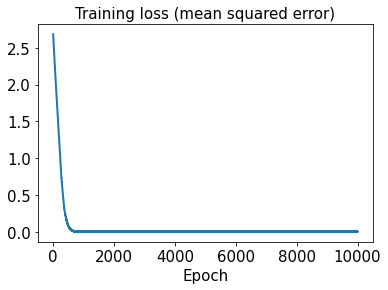

In [100]:
hist3 = history3.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

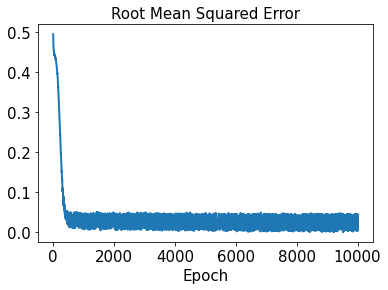

In [101]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [102]:
sd3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [103]:
start3 = datetime.datetime.now()
history3 = sd3.fit(x_train3, y_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 19ms/step - loss: 3.8073 - rmse: 1.9512
Epoch 2/10000
2/2 [==============================] - 0s 55ms/step - loss: 3.7867 - rmse: 1.9459
Epoch 3/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.7661 - rmse: 1.9406
Epoch 4/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.7455 - rmse: 1.9353
Epoch 5/10000
2/2 [==============================] - 0s 19ms/step - loss: 3.7250 - rmse: 1.9300
Epoch 6/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7046 - rmse: 1.9247
Epoch 7/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.6842 - rmse: 1.9194
Epoch 8/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.6639 - rmse: 1.9141
Epoch 9/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6438 - rmse: 1.9089
Epoch 10/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6236 - rmse: 1.9036
Epoch 11/10000
2/2 [=====================

2/2 [==============================] - 0s 9ms/step - loss: 2.4059 - rmse: 1.5511
Epoch 87/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3935 - rmse: 1.5471
Epoch 88/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3823 - rmse: 1.5434
Epoch 89/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3694 - rmse: 1.5393
Epoch 90/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3591 - rmse: 1.5359
Epoch 91/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3459 - rmse: 1.5316
Epoch 92/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3370 - rmse: 1.5287
Epoch 93/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3230 - rmse: 1.5241
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3122 - rmse: 1.5206
Epoch 95/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3026 - rmse: 1.5174
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 7ms/step - loss: 1.6316 - rmse: 1.2772
Epoch 171/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6245 - rmse: 1.2744
Epoch 172/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6189 - rmse: 1.2723
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6115 - rmse: 1.2693
Epoch 174/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.6070 - rmse: 1.2676
Epoch 175/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5988 - rmse: 1.2643
Epoch 176/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5952 - rmse: 1.2629
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5861 - rmse: 1.2593
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5769 - rmse: 1.2556
Epoch 179/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.5701 - rmse: 1.2529
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 1.1512 - rmse: 1.0728
Epoch 255/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1527 - rmse: 1.0735
Epoch 256/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1434 - rmse: 1.0691
Epoch 257/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1455 - rmse: 1.0701
Epoch 258/10000
2/2 [==============================] - 0s 17ms/step - loss: 1.1331 - rmse: 1.0643
Epoch 259/10000
2/2 [==============================] - 0s 19ms/step - loss: 1.1301 - rmse: 1.0629
Epoch 260/10000
2/2 [==============================] - 0s 19ms/step - loss: 1.1308 - rmse: 1.0632
Epoch 261/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1208 - rmse: 1.0585
Epoch 262/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1181 - rmse: 1.0572
Epoch 263/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1116 - rmse: 1.0542
Epoch 264/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 0.8316 - rmse: 0.9117
Epoch 339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8301 - rmse: 0.9109
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8247 - rmse: 0.9079
Epoch 341/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8215 - rmse: 0.9062
Epoch 342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8185 - rmse: 0.9045
Epoch 343/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8156 - rmse: 0.9029
Epoch 344/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8152 - rmse: 0.9027
Epoch 345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8156 - rmse: 0.9029
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8126 - rmse: 0.9012
Epoch 347/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8044 - rmse: 0.8967
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 10ms/step - loss: 0.6077 - rmse: 0.7793
Epoch 423/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6067 - rmse: 0.7787
Epoch 424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6094 - rmse: 0.7804
Epoch 425/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5997 - rmse: 0.7742
Epoch 426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5989 - rmse: 0.7737
Epoch 427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5958 - rmse: 0.7717
Epoch 428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5928 - rmse: 0.7697
Epoch 429/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5935 - rmse: 0.7702
Epoch 430/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5913 - rmse: 0.7688
Epoch 431/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5871 - rmse: 0.7660
Epoch 432/10000
2/2 [======================

2/2 [==============================] - 0s 8ms/step - loss: 0.4415 - rmse: 0.6642
Epoch 507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4415 - rmse: 0.6643
Epoch 508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4397 - rmse: 0.6629
Epoch 509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4358 - rmse: 0.6599
Epoch 510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4363 - rmse: 0.6604
Epoch 511/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4324 - rmse: 0.6574
Epoch 512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4316 - rmse: 0.6567
Epoch 513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4279 - rmse: 0.6539
Epoch 514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4293 - rmse: 0.6550
Epoch 515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4335 - rmse: 0.6582
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.3169 - rmse: 0.5628
Epoch 591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3162 - rmse: 0.5622
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3216 - rmse: 0.5669
Epoch 593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3181 - rmse: 0.5638
Epoch 594/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3104 - rmse: 0.5570
Epoch 595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3088 - rmse: 0.5555
Epoch 596/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3106 - rmse: 0.5571
Epoch 597/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3077 - rmse: 0.5545
Epoch 598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3069 - rmse: 0.5538
Epoch 599/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3125 - rmse: 0.5588
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.2141 - rmse: 0.4625
Epoch 675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2131 - rmse: 0.4614
Epoch 676/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2121 - rmse: 0.4604
Epoch 677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2141 - rmse: 0.4626
Epoch 678/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2099 - rmse: 0.4580
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2099 - rmse: 0.4580
Epoch 680/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2116 - rmse: 0.4598
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2110 - rmse: 0.4592
Epoch 682/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2138 - rmse: 0.4622
Epoch 683/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2051 - rmse: 0.4527
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.1392 - rmse: 0.3730
Epoch 759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1420 - rmse: 0.3767
Epoch 760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1376 - rmse: 0.3708
Epoch 761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1384 - rmse: 0.3719
Epoch 762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1364 - rmse: 0.3692
Epoch 763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1385 - rmse: 0.3720
Epoch 764/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1406 - rmse: 0.3749
Epoch 765/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1341 - rmse: 0.3660
Epoch 766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1348 - rmse: 0.3669
Epoch 767/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1337 - rmse: 0.3655
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0893 - rmse: 0.2987
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0871 - rmse: 0.2949
Epoch 844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0865 - rmse: 0.2940
Epoch 845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0898 - rmse: 0.2996
Epoch 846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0873 - rmse: 0.2953
Epoch 847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0885 - rmse: 0.2973
Epoch 848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0867 - rmse: 0.2944
Epoch 849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0840 - rmse: 0.2897
Epoch 850/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0837 - rmse: 0.2891
Epoch 851/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0831 - rmse: 0.2881
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0534 - rmse: 0.2310
Epoch 927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0556 - rmse: 0.2358
Epoch 928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0571 - rmse: 0.2388
Epoch 929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0558 - rmse: 0.2361
Epoch 930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0565 - rmse: 0.2376
Epoch 931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0554 - rmse: 0.2353
Epoch 932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0531 - rmse: 0.2303
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0549 - rmse: 0.2341
Epoch 934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0523 - rmse: 0.2286
Epoch 935/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0528 - rmse: 0.2297
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0299 - rmse: 0.1727
Epoch 1011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0307 - rmse: 0.1751
Epoch 1012/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0312 - rmse: 0.1764
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0352 - rmse: 0.1875
Epoch 1014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0332 - rmse: 0.1821
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0321 - rmse: 0.1789
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0329 - rmse: 0.1812
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0327 - rmse: 0.1807
Epoch 1018/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0311 - rmse: 0.1763
Epoch 1019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0361 - rmse: 0.1898
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0159 - rmse: 0.1260
Epoch 1094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0225 - rmse: 0.1499
Epoch 1095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0247 - rmse: 0.1569
Epoch 1096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0156 - rmse: 0.1246
Epoch 1097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0162 - rmse: 0.1269
Epoch 1098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0159 - rmse: 0.1258
Epoch 1099/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0160 - rmse: 0.1264
Epoch 1100/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0148 - rmse: 0.1215
Epoch 1101/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0148 - rmse: 0.1214
Epoch 1102/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0187 - rmse: 0.1366
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 1177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0103 - rmse: 0.1014
Epoch 1178/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0171 - rmse: 0.1305
Epoch 1179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 1180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0101 - rmse: 0.1005
Epoch 1181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0884
Epoch 1182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0110 - rmse: 0.1047
Epoch 1183/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0106 - rmse: 0.1027
Epoch 1184/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0978
Epoch 1185/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0961
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0855
Epoch 1260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0714
Epoch 1261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0111 - rmse: 0.1054
Epoch 1262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0110 - rmse: 0.1047
Epoch 1263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 1264/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 1265/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0642
Epoch 1266/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 1267/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 1268/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 1269/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 1343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 1344/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0499
Epoch 1345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 1346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 1347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 1348/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0688
Epoch 1349/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 1350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 1351/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0706
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0722
Epoch 1426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 1427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 1428/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 1429/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0110 - rmse: 0.1048
Epoch 1430/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 1431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 1432/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 1433/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 1434/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0045 - rmse: 0.0666
Epoch 1435/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0403
Epoch 1509/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0994
Epoch 1510/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3385e-04 - rmse: 0.0301
Epoch 1511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 1512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 1513/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.9582e-04 - rmse: 0.0311
Epoch 1514/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0996
Epoch 1515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 1516/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 1517/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 1518/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0523
Epoch 1592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 1593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 1594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0862
Epoch 1595/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.0555e-04 - rmse: 0.0260
Epoch 1596/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 1597/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 1598/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 1599/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 1600/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 1601/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 8.8958e-04 - rmse: 0.0294
Epoch 1675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 1676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 1677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 1678/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 1679/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.2236e-04 - rmse: 0.0244
Epoch 1680/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.3776e-04 - rmse: 0.0247
Epoch 1681/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 1682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0701
Epoch 1683/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 1684/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 1757/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0034e-04 - rmse: 0.0165
Epoch 1758/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 1759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0350
Epoch 1760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 1761/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 1762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 1763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 1764/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9123e-04 - rmse: 0.0163
Epoch 1765/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 1766/10000
2/2 [=======

Epoch 1839/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0961
Epoch 1840/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9244e-04 - rmse: 0.0311
Epoch 1841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 1842/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 1843/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5463e-04 - rmse: 0.0151
Epoch 1844/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2531e-04 - rmse: 0.0173
Epoch 1845/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1813e-04 - rmse: 0.0096
Epoch 1846/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 1847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 1848/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0442
Epoc

2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 1922/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4185e-04 - rmse: 0.0178
Epoch 1923/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0094e-04 - rmse: 0.0087
Epoch 1924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 1925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 1926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 1927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 1928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 1929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 1930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 1931/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 2.6931e-04 - rmse: 0.0157
Epoch 2004/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5706e-04 - rmse: 0.0115
Epoch 2005/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9456e-04 - rmse: 0.0164
Epoch 2006/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4725e-04 - rmse: 0.0229
Epoch 2007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 2008/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4043e-04 - rmse: 0.0178
Epoch 2009/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4954e-04 - rmse: 0.0150
Epoch 2010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 2011/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 2012/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 2013/10

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 2086/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4174e-04 - rmse: 0.0109
Epoch 2087/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 2088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 2089/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 2090/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 2091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 2092/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 2093/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 2094/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0233e-04 - rmse: 0.0089
Epoch 2095/10000
2/2 [=======

Epoch 2168/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0100 - rmse: 0.1001
Epoch 2169/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 2170/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 2171/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 2172/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 2173/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0058 - rmse: 0.0762
Epoch 2174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0106 - rmse: 0.1029
Epoch 2175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 2176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 2177/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0052 - rmse: 0.0719
Epoch 2178/10000
2/2

Epoch 2251/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 2252/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8953e-04 - rmse: 0.0192
Epoch 2253/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0428e-04 - rmse: 0.0280
Epoch 2254/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7643e-05 - rmse: 0.0068
Epoch 2255/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3744e-04 - rmse: 0.0178
Epoch 2256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 2257/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3689e-04 - rmse: 0.0178
Epoch 2258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 2259/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3809e-04 - rmse: 0.0147
Epoch 2260/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4362e-04 - rmse:

2/2 [==============================] - 0s 8ms/step - loss: 9.8462e-04 - rmse: 0.0310
Epoch 2334/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 2335/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 2336/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 2337/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1541e-04 - rmse: 0.0222
Epoch 2338/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 2339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 2340/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 2341/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2623e-04 - rmse: 0.0143
Epoch 2342/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3920e-04 - rmse: 0.0228
Epoch 2343/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 2416/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7255e-04 - rmse: 0.0124
Epoch 2417/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 2418/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 2419/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 2420/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.8995e-04 - rmse: 0.0295
Epoch 2421/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5627e-04 - rmse: 0.0209
Epoch 2422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 2423/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 2424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 2425/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 2498/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 2499/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7726e-04 - rmse: 0.0126
Epoch 2500/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8030e-04 - rmse: 0.0190
Epoch 2501/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 2502/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3062e-04 - rmse: 0.0145
Epoch 2503/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 2504/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 2505/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 2506/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 2507/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0086 - rmse: 0.0928
Epoch 2581/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9052e-04 - rmse: 0.0295
Epoch 2582/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 2583/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 2584/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 2585/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0883
Epoch 2586/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0079 - rmse: 0.0886
Epoch 2587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 2588/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 2589/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0106 - rmse: 0.1028
Epoch 2590/10000
2/2 [==========

2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 2664/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 2665/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 2666/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 2667/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 2668/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 2669/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 2670/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 2671/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 2672/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 2673/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 2747/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 2748/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9316e-04 - rmse: 0.0133
Epoch 2749/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 2750/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 2751/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 2752/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2088e-04 - rmse: 0.0143
Epoch 2753/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 2754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 2755/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3022e-04 - rmse: 0.0203
Epoch 2756/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 4.7838e-04 - rmse: 0.0215
Epoch 2829/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0841e-04 - rmse: 0.0171
Epoch 2830/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 2831/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 2832/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6469e-04 - rmse: 0.0234
Epoch 2833/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4083e-04 - rmse: 0.0229
Epoch 2834/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 2835/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 2836/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4495e-04 - rmse: 0.0181
Epoch 2837/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4691e-04 - rmse: 0.0288
Epoch 2838/10

2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 2911/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0722
Epoch 2912/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 2913/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 2914/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - rmse: 0.0994
Epoch 2915/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5408e-04 - rmse: 0.0290
Epoch 2916/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0799
Epoch 2917/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0705
Epoch 2918/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1719e-04 - rmse: 0.0245
Epoch 2919/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7033e-04 - rmse: 0.0236
Epoch 2920/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 1.4915e-04 - rmse: 0.0116
Epoch 2993/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9484e-04 - rmse: 0.0167
Epoch 2994/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 2995/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 2996/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5635e-04 - rmse: 0.0233
Epoch 2997/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 2998/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 2999/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 3000/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 3001/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6721e-04 - rmse: 0.0274
Epoch 3002/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 3075/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.9707e-04 - rmse: 0.0220
Epoch 3076/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9407e-04 - rmse: 0.0195
Epoch 3077/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 3078/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1360e-04 - rmse: 0.0223
Epoch 3079/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4345e-04 - rmse: 0.0151
Epoch 3080/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 3081/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 3082/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 3083/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 3084/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 3.4887e-04 - rmse: 0.0183
Epoch 3157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 3158/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 3159/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0573e-04 - rmse: 0.0171
Epoch 3160/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 3161/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 3162/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 3163/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 3164/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 3165/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8755e-05 - rmse: 0.0039
Epoch 3166/10000
2/2 [==

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 3239/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9400e-04 - rmse: 0.0313
Epoch 3240/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.4556e-04 - rmse: 0.0115
Epoch 3241/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 3242/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 3243/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.4151e-05 - rmse: 0.0090
Epoch 3244/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 3245/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 3246/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.3445e-04 - rmse: 0.0110
Epoch 3247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 3248/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 3321/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 3322/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 3323/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0714
Epoch 3324/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 3325/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7560e-04 - rmse: 0.0276
Epoch 3326/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 3327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 3328/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0862
Epoch 3329/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 3330/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 3.7765e-04 - rmse: 0.0191
Epoch 3403/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 3404/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0969
Epoch 3405/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 3406/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0777
Epoch 3407/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 3408/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2012e-04 - rmse: 0.0104
Epoch 3409/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 3410/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2957e-05 - rmse: 0.0078
Epoch 3411/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 3412/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 5.4361e-04 - rmse: 0.0231
Epoch 3485/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 3486/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 3487/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 3488/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9905e-04 - rmse: 0.0262
Epoch 3489/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7993e-04 - rmse: 0.0216
Epoch 3490/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 3491/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0710
Epoch 3492/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3853e-04 - rmse: 0.0229
Epoch 3493/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 3494/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 3567/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 3568/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 3569/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 3570/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 3571/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 3572/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8805e-05 - rmse: 0.0061
Epoch 3573/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.9028e-04 - rmse: 0.0134
Epoch 3574/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 3575/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8968e-05 - rmse: 0.0069
Epoch 3576/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 2.9697e-04 - rmse: 0.0169
Epoch 3649/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 3650/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 3651/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 3652/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 3653/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 3654/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 3655/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 3656/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 3657/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0114e-04 - rmse: 0.0170
Epoch 3658/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0499
Epoch 3731/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2046e-04 - rmse: 0.0284
Epoch 3732/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 3733/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 3734/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0999
Epoch 3735/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5487e-04 - rmse: 0.0290
Epoch 3736/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0998
Epoch 3737/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7410e-04 - rmse: 0.0310
Epoch 3738/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 3739/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 3740/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0711
Epoch 3814/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 3815/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 3816/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 3817/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 3818/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 3819/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 3820/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0695
Epoch 3821/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0706
Epoch 3822/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0800
Epoch 3823/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 3896/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8522e-04 - rmse: 0.0278
Epoch 3897/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 3898/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 3899/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 3900/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 3901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 3902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 3903/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5192e-04 - rmse: 0.0155
Epoch 3904/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 3905/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 3978/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6851e-04 - rmse: 0.0310
Epoch 3979/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 3980/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4675e-04 - rmse: 0.0252
Epoch 3981/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 3982/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 3983/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 3984/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3546e-04 - rmse: 0.0180
Epoch 3985/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 3986/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.4329e-04 - rmse: 0.0183
Epoch 3987/10000
2/2

2/2 [==============================] - 0s 9ms/step - loss: 0.0092 - rmse: 0.0958
Epoch 4060/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.2158e-04 - rmse: 0.0285
Epoch 4061/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 4062/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 4063/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6016e-04 - rmse: 0.0212
Epoch 4064/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 4065/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 4066/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 4067/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.3442e-04 - rmse: 0.0229
Epoch 4068/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0983
Epoch 4069/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 3.6409e-04 - rmse: 0.0188
Epoch 4143/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 4144/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0702
Epoch 4145/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5442e-04 - rmse: 0.0291
Epoch 4146/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0925
Epoch 4147/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.0060e-04 - rmse: 0.0298
Epoch 4148/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8455e-04 - rmse: 0.0260
Epoch 4149/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9148e-04 - rmse: 0.0280
Epoch 4150/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 4151/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0852
Epoch 4152/10000


2/2 [==============================] - 0s 8ms/step - loss: 8.4255e-04 - rmse: 0.0289
Epoch 4225/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7794e-04 - rmse: 0.0238
Epoch 4226/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7002e-04 - rmse: 0.0276
Epoch 4227/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 4228/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 4229/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 4230/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6549e-04 - rmse: 0.0309
Epoch 4231/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 4232/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 4233/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0850e-04 - rmse: 0.0300
Epoch 4234/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 4307/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 4308/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3877e-04 - rmse: 0.0114
Epoch 4309/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 4310/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7454e-04 - rmse: 0.0163
Epoch 4311/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 4312/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 4313/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 4314/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 4315/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4744e-04 - rmse: 0.0209
Epoch 4316/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 4389/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 4390/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 4391/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 4392/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 4393/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0560e-04 - rmse: 0.0244
Epoch 4394/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 4395/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 4396/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 4397/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 4398/10000
2/2 [===========

2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 4471/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 4472/10000
2/2 [==============================] - 0s 17ms/step - loss: 1.6741e-04 - rmse: 0.0126
Epoch 4473/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.5696e-04 - rmse: 0.0157
Epoch 4474/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 4475/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 4476/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0352
Epoch 4477/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9554e-04 - rmse: 0.0314
Epoch 4478/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 4479/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 4480/10000
2

2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 4553/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 4554/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 4555/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 4556/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0950
Epoch 4557/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0586
Epoch 4558/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 4559/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 4560/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 4561/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1789e-04 - rmse: 0.0302
Epoch 4562/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 4635/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 4636/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 4637/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 4638/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 4639/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0833
Epoch 4640/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0674
Epoch 4641/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 4642/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 4643/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 4644/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 4717/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 4718/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 4719/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 4720/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5400e-04 - rmse: 0.0157
Epoch 4721/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 4722/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 4723/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 4724/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 4725/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 4726/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 4.9816e-04 - rmse: 0.0221
Epoch 4799/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9825e-04 - rmse: 0.0197
Epoch 4800/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7780e-04 - rmse: 0.0239
Epoch 4801/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1510e-04 - rmse: 0.0246
Epoch 4802/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 4803/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 4804/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0845
Epoch 4805/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 4806/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 4807/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 4808/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 4881/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9159e-04 - rmse: 0.0135
Epoch 4882/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5589e-04 - rmse: 0.0186
Epoch 4883/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 4884/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 4885/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 4886/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 4887/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8950e-04 - rmse: 0.0313
Epoch 4888/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 4889/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 4890/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 4963/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 4964/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 4965/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4745e-04 - rmse: 0.0210
Epoch 4966/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 4967/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 4968/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 4969/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 4970/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0092 - rmse: 0.0959
Epoch 4971/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 4972/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 5045/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7059e-04 - rmse: 0.0215
Epoch 5046/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3332e-04 - rmse: 0.0112
Epoch 5047/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5139e-05 - rmse: 0.0069
Epoch 5048/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 5049/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 5050/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 5051/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9703e-04 - rmse: 0.0197
Epoch 5052/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5053/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0970
Epoch 5054/10000
2/2 

2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 5127/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 5128/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7852e-05 - rmse: 0.0063
Epoch 5129/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 5130/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 5131/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.9160e-04 - rmse: 0.0168
Epoch 5132/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 5133/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 5134/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 5135/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.6801e-04 - rmse: 0.0214
Epoch 5136/1000

2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0902
Epoch 5209/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 5210/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 5211/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0514
Epoch 5212/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0485e-04 - rmse: 0.0199
Epoch 5213/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 5214/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 5215/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 5216/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 5217/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 5218/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 5291/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 5292/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 5293/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7312e-04 - rmse: 0.0163
Epoch 5294/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 5295/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6185e-04 - rmse: 0.0188
Epoch 5296/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 5297/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 5298/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 5299/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 5300/10000
2/2 [==

2/2 [==============================] - 0s 7ms/step - loss: 7.9886e-04 - rmse: 0.0281
Epoch 5373/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5302e-04 - rmse: 0.0211
Epoch 5374/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 5375/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 5376/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0960
Epoch 5377/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 5378/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 5379/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 5380/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 5381/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 5382/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 5455/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 5456/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 5457/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 5458/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2950e-04 - rmse: 0.0205
Epoch 5459/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 5460/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 5461/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3725e-04 - rmse: 0.0114
Epoch 5462/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 5463/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 5464/10000
2/2 [

2/2 [==============================] - 0s 8ms/step - loss: 4.5683e-04 - rmse: 0.0212
Epoch 5537/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5059e-04 - rmse: 0.0156
Epoch 5538/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2103e-04 - rmse: 0.0106
Epoch 5539/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 5540/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 5541/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 5542/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 5543/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2213e-04 - rmse: 0.0146
Epoch 5544/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 5545/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 5546/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 2.1695e-04 - rmse: 0.0145
Epoch 5619/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8135e-05 - rmse: 0.0032
Epoch 5620/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 5621/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 5622/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4586e-04 - rmse: 0.0290
Epoch 5623/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 5624/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 5625/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 5626/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0903
Epoch 5627/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0838
Epoch 5628/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 2.7138e-04 - rmse: 0.0162
Epoch 5701/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 5702/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 5703/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 5704/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 5705/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 5706/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 5707/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 5708/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3972e-05 - rmse: 0.0087
Epoch 5709/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4600e-04 - rmse: 0.0118
Epoch 5710/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 5783/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3651e-04 - rmse: 0.0114
Epoch 5784/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2665e-04 - rmse: 0.0148
Epoch 5785/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2123e-04 - rmse: 0.0107
Epoch 5786/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 5787/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 5788/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9762e-04 - rmse: 0.0221
Epoch 5789/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 5790/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 5791/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 5792/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 5865/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 5866/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 5867/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2110e-04 - rmse: 0.0177
Epoch 5868/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 5869/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 5870/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 5871/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0603
Epoch 5872/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0524e-04 - rmse: 0.0223
Epoch 5873/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0096 - rmse: 0.0979
Epoch 5874/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 5947/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 5948/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 5949/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 5950/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 5951/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5943e-04 - rmse: 0.0213
Epoch 5952/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 5953/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 5954/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 5955/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 5956/10000
2/2 [===========

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 6030/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.5901e-04 - rmse: 0.0212
Epoch 6031/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 6032/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 6033/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 6034/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7010e-04 - rmse: 0.0190
Epoch 6035/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 6036/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 6037/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9397e-04 - rmse: 0.0169
Epoch 6038/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 6039/1000

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 6112/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 6113/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 6114/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 6115/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 6116/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 6117/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 6118/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 6119/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 6120/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 6121/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 2.0269e-04 - rmse: 0.0140
Epoch 6194/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7065e-04 - rmse: 0.0215
Epoch 6195/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0838
Epoch 6196/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8741e-04 - rmse: 0.0134
Epoch 6197/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6534e-04 - rmse: 0.0214
Epoch 6198/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 6199/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 6200/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 6201/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 6202/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 6203/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6276/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 6277/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 6278/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 6279/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 6280/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 6281/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 6282/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 6283/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 6284/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 6285/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 3.7393e-04 - rmse: 0.0191
Epoch 6359/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 6360/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 6361/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 6362/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 6363/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0897
Epoch 6364/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 6365/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 6366/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4253e-05 - rmse: 0.0082
Epoch 6367/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 6368/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 4.3124e-04 - rmse: 0.0206
Epoch 6441/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.8701e-04 - rmse: 0.0167
Epoch 6442/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 6443/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 6444/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 6445/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 6446/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 6447/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.5005e-04 - rmse: 0.0185
Epoch 6448/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1461e-04 - rmse: 0.0104
Epoch 6449/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6815e-04 - rmse: 0.0215
Epoch 64

2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 6523/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 6524/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0844e-04 - rmse: 0.0200
Epoch 6525/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 6526/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2009e-04 - rmse: 0.0203
Epoch 6527/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 6528/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4150e-04 - rmse: 0.0183
Epoch 6529/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4104e-05 - rmse: 0.0093
Epoch 6530/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 6531/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 6532/10000
2/2 

2/2 [==============================] - 0s 13ms/step - loss: 7.0384e-04 - rmse: 0.0264
Epoch 6605/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 6606/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0504
Epoch 6607/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 6608/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9857e-04 - rmse: 0.0222
Epoch 6609/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 6610/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1201e-04 - rmse: 0.0246
Epoch 6611/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 6612/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 6613/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0352
Epoch 6614/10000
2/2 [

2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 6687/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 6688/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 6689/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 6690/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0448e-04 - rmse: 0.0300
Epoch 6691/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0999
Epoch 6692/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 6693/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 6694/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 6695/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 6696/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 6769/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0714
Epoch 6770/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 6771/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 6772/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7888e-04 - rmse: 0.0239
Epoch 6773/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 6774/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 6775/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2732e-04 - rmse: 0.0286
Epoch 6776/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2894e-04 - rmse: 0.0269
Epoch 6777/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0701
Epoch 6778/10000
2/2 [===

Epoch 6851/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1874e-04 - rmse: 0.0146
Epoch 6852/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5282e-04 - rmse: 0.0121
Epoch 6853/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 6854/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 6855/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 6856/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 6857/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 6858/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 6859/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 6860/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 686

2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 6934/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 6935/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4280e-04 - rmse: 0.0117
Epoch 6936/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 6937/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 6938/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 6939/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 6940/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 6941/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8737e-04 - rmse: 0.0195
Epoch 6942/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 6943/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 7016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 7017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 7018/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 7019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 7020/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8059e-05 - rmse: 0.0033
Epoch 7021/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 7022/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 7023/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7164e-04 - rmse: 0.0311
Epoch 7024/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 7025/10000
2/2 [======

2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 7098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 7099/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2282e-04 - rmse: 0.0303
Epoch 7100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0473
Epoch 7101/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 7102/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 7103/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2577e-04 - rmse: 0.0286
Epoch 7104/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 7105/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4308e-04 - rmse: 0.0271
Epoch 7106/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 7107/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 7180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 7181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7182/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 7183/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 7184/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6261e-04 - rmse: 0.0256
Epoch 7185/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0978
Epoch 7186/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 7187/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 7188/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8228e-04 - rmse: 0.0194
Epoch 7189/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 7262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 7263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7264/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2398e-04 - rmse: 0.0147
Epoch 7265/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 7266/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3111e-04 - rmse: 0.0206
Epoch 7267/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 7268/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0968
Epoch 7269/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 7270/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8933e-04 - rmse: 0.0241
Epoch 7271/10000
2/2 [

2/2 [==============================] - 0s 7ms/step - loss: 8.4199e-04 - rmse: 0.0289
Epoch 7344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0902
Epoch 7345/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2040e-05 - rmse: 0.0092
Epoch 7346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 7347/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 7348/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8819e-04 - rmse: 0.0280
Epoch 7349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 7350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 7351/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 7352/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8380e-04 - rmse: 0.0194
Epoch 7353/10000
2/2 

2/2 [==============================] - 0s 12ms/step - loss: 8.5556e-04 - rmse: 0.0291
Epoch 7426/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 7427/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 7428/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.1993e-04 - rmse: 0.0227
Epoch 7429/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 7430/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9276e-04 - rmse: 0.0169
Epoch 7431/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0838
Epoch 7432/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 7433/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 7434/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 7435/10000

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 7508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0700
Epoch 7509/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 7510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 7511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 7512/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4228e-04 - rmse: 0.0289
Epoch 7513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0712
Epoch 7514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0991
Epoch 7515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 7516/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 7517/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 7.7728e-04 - rmse: 0.0278
Epoch 7590/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7152e-04 - rmse: 0.0311
Epoch 7591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 7592/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9526e-04 - rmse: 0.0170
Epoch 7593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 7594/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 7595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0771
Epoch 7596/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9857e-05 - rmse: 0.0097
Epoch 7597/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 7598/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7962e-04 - rmse: 0.0312
Epoch 7599/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 7672/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 7673/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 7674/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1119e-04 - rmse: 0.0201
Epoch 7675/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6253e-04 - rmse: 0.0309
Epoch 7676/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2641e-04 - rmse: 0.0205
Epoch 7677/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1790e-05 - rmse: 0.0074
Epoch 7678/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 7679/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 7680/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 7681/10000
2

2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0673
Epoch 7754/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8936e-04 - rmse: 0.0280
Epoch 7755/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5360e-05 - rmse: 0.0054
Epoch 7756/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2526e-05 - rmse: 0.0060
Epoch 7757/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0112e-04 - rmse: 0.0172
Epoch 7758/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 7759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 7760/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3595e-04 - rmse: 0.0182
Epoch 7761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 7762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 7763/10000


2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 7836/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 7837/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 7838/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 7839/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.4911e-05 - rmse: 0.0089
Epoch 7840/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9276e-04 - rmse: 0.0314
Epoch 7841/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 7842/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 7843/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 7844/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 7845/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 7918/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 7919/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 7920/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4124e-04 - rmse: 0.0116
Epoch 7921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 7922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 7923/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 7924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 7925/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6852e-04 - rmse: 0.0127
Epoch 7926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 7927/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 8000/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 8001/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 8002/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0344e-04 - rmse: 0.0199
Epoch 8003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 8004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 8005/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9044e-04 - rmse: 0.0136
Epoch 8006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0959
Epoch 8007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 8008/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 8009/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0907
Epoch 8083/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7110e-04 - rmse: 0.0163
Epoch 8084/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0688
Epoch 8085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 8086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 8087/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8473e-04 - rmse: 0.0241
Epoch 8088/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2105e-04 - rmse: 0.0204
Epoch 8089/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7772e-04 - rmse: 0.0165
Epoch 8090/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0975
Epoch 8091/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0688
Epoch 8092/10000

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 8165/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 8166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 8167/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 8168/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 8169/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 8170/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 8171/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0013e-04 - rmse: 0.0222
Epoch 8172/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6366e-04 - rmse: 0.0189
Epoch 8173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 8174/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0096 - rmse: 0.0978
Epoch 8247/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 8248/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 8249/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 8250/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 8251/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.2242e-05 - rmse: 0.0087
Epoch 8252/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1820e-04 - rmse: 0.0106
Epoch 8253/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.9932e-04 - rmse: 0.0315
Epoch 8254/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 8255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 8256/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 8329/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 8330/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 8331/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 8332/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 8333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8334/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 8335/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 8336/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 8337/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0105 - rmse: 0.1026
Epoch 8338/10000
2/2 [===============

Epoch 8411/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4093e-04 - rmse: 0.0183
Epoch 8412/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 8413/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 8414/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 8415/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3387e-04 - rmse: 0.0230
Epoch 8416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 8417/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7611e-04 - rmse: 0.0192
Epoch 8418/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3300e-04 - rmse: 0.0207
Epoch 8419/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 8420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0834
Epoc

2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 8494/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9734e-04 - rmse: 0.0171
Epoch 8495/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 8496/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2493e-04 - rmse: 0.0205
Epoch 8497/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 8498/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 8499/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 8500/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1964e-04 - rmse: 0.0107
Epoch 8501/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 8502/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 8503/10000
2

2/2 [==============================] - 0s 7ms/step - loss: 1.6782e-04 - rmse: 0.0127
Epoch 8576/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 8577/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 8578/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 8579/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8580/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0314e-04 - rmse: 0.0140
Epoch 8581/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8534e-04 - rmse: 0.0195
Epoch 8582/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 8583/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 8584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 8585/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 8658/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 8659/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 8660/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 8661/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3352e-04 - rmse: 0.0151
Epoch 8662/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6097e-04 - rmse: 0.0124
Epoch 8663/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0839
Epoch 8664/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6116e-04 - rmse: 0.0125
Epoch 8665/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0333e-04 - rmse: 0.0199
Epoch 8666/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 8667/10000

2/2 [==============================] - 0s 7ms/step - loss: 3.5184e-04 - rmse: 0.0186
Epoch 8740/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 8741/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0605e-04 - rmse: 0.0283
Epoch 8742/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 8743/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 8744/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 8745/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0966
Epoch 8746/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 8747/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 8748/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6739e-05 - rmse: 0.0095
Epoch 8749/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 8822/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 8823/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0696
Epoch 8824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 8825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 8826/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0912
Epoch 8827/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 8828/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 8829/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 8830/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 8831/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 1.3759e-04 - rmse: 0.0115
Epoch 8904/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 8905/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 8906/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 8907/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 8908/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 8909/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5493e-04 - rmse: 0.0122
Epoch 8910/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4097e-04 - rmse: 0.0183
Epoch 8911/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 8912/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 8913/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 8986/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0100 - rmse: 0.1001
Epoch 8987/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 8988/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 8989/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 8990/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 8991/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 8992/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 8993/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6922e-04 - rmse: 0.0258
Epoch 8994/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 8995/10000
2/2 [===========

2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 9068/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 9069/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9453e-04 - rmse: 0.0197
Epoch 9070/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1419e-04 - rmse: 0.0104
Epoch 9071/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 9072/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0663e-05 - rmse: 0.0086
Epoch 9073/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 9074/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0619e-04 - rmse: 0.0100
Epoch 9075/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 9076/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 9077/1

2/2 [==============================] - 0s 8ms/step - loss: 5.8368e-04 - rmse: 0.0240
Epoch 9150/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2928e-04 - rmse: 0.0269
Epoch 9151/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 9152/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.1562e-04 - rmse: 0.0247
Epoch 9153/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 9154/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 9155/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 9156/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9281e-04 - rmse: 0.0242
Epoch 9157/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5012e-04 - rmse: 0.0254
Epoch 9158/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7228e-04 - rmse: 0.0294
Epoch 9159/10

2/2 [==============================] - 0s 7ms/step - loss: 2.0188e-04 - rmse: 0.0140
Epoch 9232/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8090e-04 - rmse: 0.0312
Epoch 9233/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 9234/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 9235/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 9236/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5739e-04 - rmse: 0.0187
Epoch 9237/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 9238/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 9239/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6663e-04 - rmse: 0.0190
Epoch 9240/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 9241/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 9314/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 9315/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.3323e-04 - rmse: 0.0207
Epoch 9316/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 9317/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2018e-04 - rmse: 0.0204
Epoch 9318/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 9319/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 9320/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 9321/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 9322/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 9323/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 9396/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 9397/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 9398/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4144e-04 - rmse: 0.0153
Epoch 9399/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 9400/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 9401/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 9402/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 9403/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8184e-04 - rmse: 0.0194
Epoch 9404/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 9405/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 7.8495e-04 - rmse: 0.0279
Epoch 9478/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 9479/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3654e-04 - rmse: 0.0208
Epoch 9480/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0701
Epoch 9481/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 9482/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2609e-04 - rmse: 0.0205
Epoch 9483/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 9484/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 9485/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2006e-04 - rmse: 0.0177
Epoch 9486/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 9487/1

2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 9560/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 9561/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2810e-04 - rmse: 0.0205
Epoch 9562/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 9563/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9954e-04 - rmse: 0.0198
Epoch 9564/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 9565/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8287e-04 - rmse: 0.0218
Epoch 9566/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 9567/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 9568/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 9569/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 4.2942e-04 - rmse: 0.0206
Epoch 9642/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 9643/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 9644/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 9645/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5585e-04 - rmse: 0.0158
Epoch 9646/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 9647/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 9648/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 9649/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1089e-04 - rmse: 0.0143
Epoch 9650/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7000e-05 - rmse: 0.0096
Epoch 9651/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 9724/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 9725/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2500e-04 - rmse: 0.0148
Epoch 9726/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0295e-04 - rmse: 0.0199
Epoch 9727/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1619e-05 - rmse: 0.0081
Epoch 9728/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 9729/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 9730/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3527e-04 - rmse: 0.0152
Epoch 9731/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 9732/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 9733/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 1.4570e-04 - rmse: 0.0118
Epoch 9806/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 9807/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1164e-04 - rmse: 0.0175
Epoch 9808/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 9809/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0393
Epoch 9810/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6853e-04 - rmse: 0.0162
Epoch 9811/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 9812/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 9813/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5049e-04 - rmse: 0.0211
Epoch 9814/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 9815/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 9888/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0643
Epoch 9889/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9890/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 9891/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 9892/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 9893/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0719
Epoch 9894/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0718
Epoch 9895/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 9896/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 9897/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 9970/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 9971/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 9972/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 9973/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1124e-04 - rmse: 0.0175
Epoch 9974/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 9975/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 9976/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 9977/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 9978/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 9979/10000
2/2 [===========

In [104]:
time3 = end3 - start3
print("Training time (Case 3):", time3)

Training time (Case 3): 0:02:59.069122


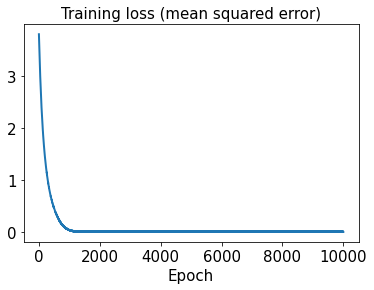

In [105]:
hist3 = history3.history
plt.plot(hist3['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

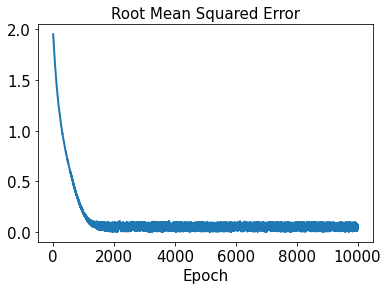

In [106]:
plt.plot(hist3['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [107]:
test_results3 = sd3.evaluate(x_test3)

1/1 [==============================] - 0s 67ms/step - loss: 5.6028e-06 - rmse: 0.0000e+00


In [108]:
decoded_sensor_train3 = sensor_pred3.predict(t_train)

In [109]:
decoded_sensor_test3 = sensor_pred3.predict(t_test)

In [110]:
decoded_train3 = sd3.predict(decoded_sensor_train3)

In [111]:
decoded_test3 = sd3.predict(decoded_sensor_test3)

In [112]:
error_train_abs3 = np.abs(decoded_train3 - y_train3)

In [113]:
error_test_abs3 = np.abs(decoded_test3 - y_test3)

In [114]:
l2_error_train3 = np.sqrt(np.sum((decoded_train3 - y_train3)**2) / np.sum(y_train3**2))
print(l2_error_train3)

0.16640812278313638


In [115]:
l2_error_test3 = np.sqrt(np.sum((decoded_test3 - y_test3)**2) / np.sum(y_test3**2))
print(l2_error_test3)

0.1714521695480996


In [116]:
l2_error_train_list3 = []
for i in range(0, len(x_train3)):
    l2_error_train_data3 = np.sqrt(np.sum((decoded_train3[i] - y_train3[i])**2) / np.sum(y_train3[i]**2))
    l2_error_train_list3.append(l2_error_train_data3)
print(l2_error_train_list3)

[0.16381517285509242, 0.1751021411177863, 0.13873492805887971, 0.10040193004688286, 0.03429056393958931, 0.14288619428788898, 0.058601642354513366, 0.2123294436461812, 0.04705560907551237, 0.262890013206037, 0.24470821087958197, 0.21703695244215465, 0.12923203940701694, 0.18816698598804316, 0.1159797449670832, 0.21418029752173032, 0.18326787666650107, 0.03171245443088207, 0.21039948173388245, 0.19802554530886418, 0.3035310945940602, 0.20564929671515275, 0.28247953159254124, 0.07329430054616468, 0.2278718803020984, 0.1301210737047123, 0.05164494883425795, 0.020353654590746745, 0.01372831747597873, 0.1645213714616276, 0.0689556451459173, 0.14582369499500783, 0.3261114297261053]


In [117]:
l2_error_test_list3 = []
for i in range(0, len(x_test3)):
    l2_error_test_data3 = np.sqrt(np.sum((decoded_test3[i] - y_test3[i])**2) / np.sum(y_test3[i]**2))
    l2_error_test_list3.append(l2_error_test_data3)
print(l2_error_test_list3)

[0.09668024779675423, 0.0833279906152411, 0.15433433769517843, 0.12202538817029183, 0.19987123378694285, 0.3753854751858363, 0.00645466786139238, 0.350279488321236]


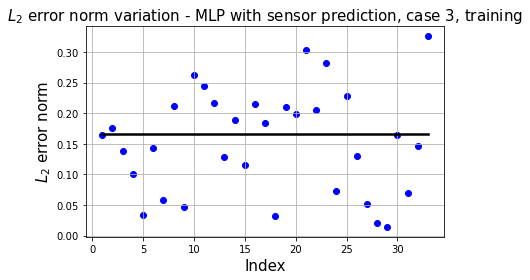

In [118]:
plt.plot(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train3*np.ones(x_train3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

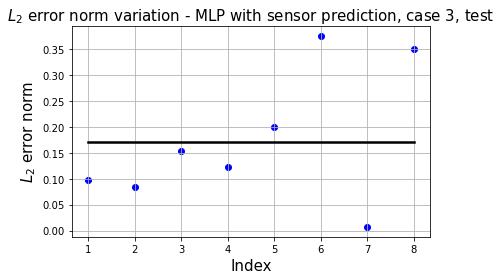

In [119]:
plt.plot(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test3*np.ones(x_test3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

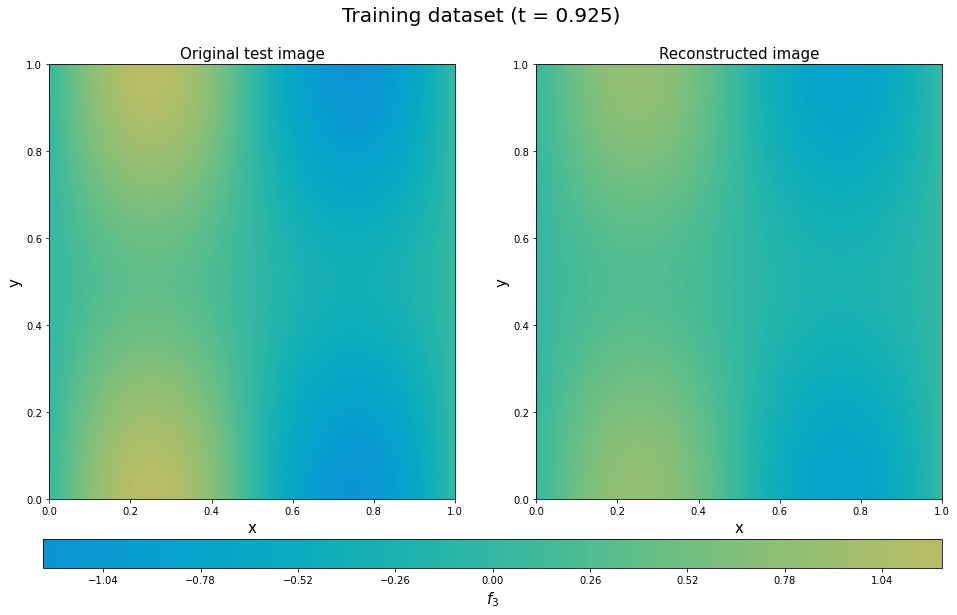

In [120]:
plt.figure(figsize=(16, 8))
y_train3_20_rotate = y_train3[20].T.reshape(101,101)
decoded_rotate3 = decoded_train3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_20_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[37]),fontsize=20)
plt.show()

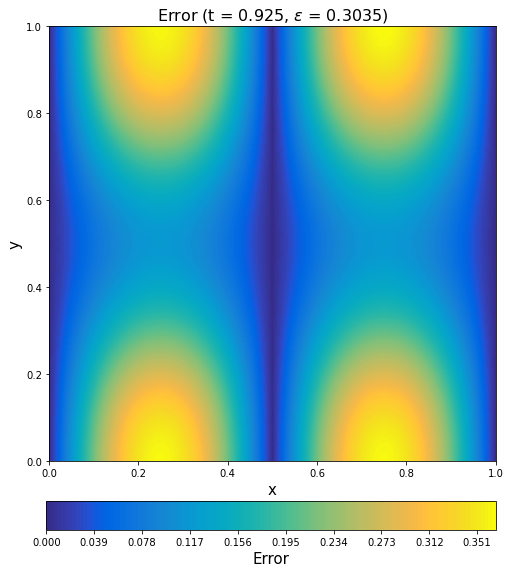

In [121]:
error_train_abs3_rotate20 = error_train_abs3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate20, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.925, $\epsilon$ = %.4f)' %(l2_error_train_list3[20]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

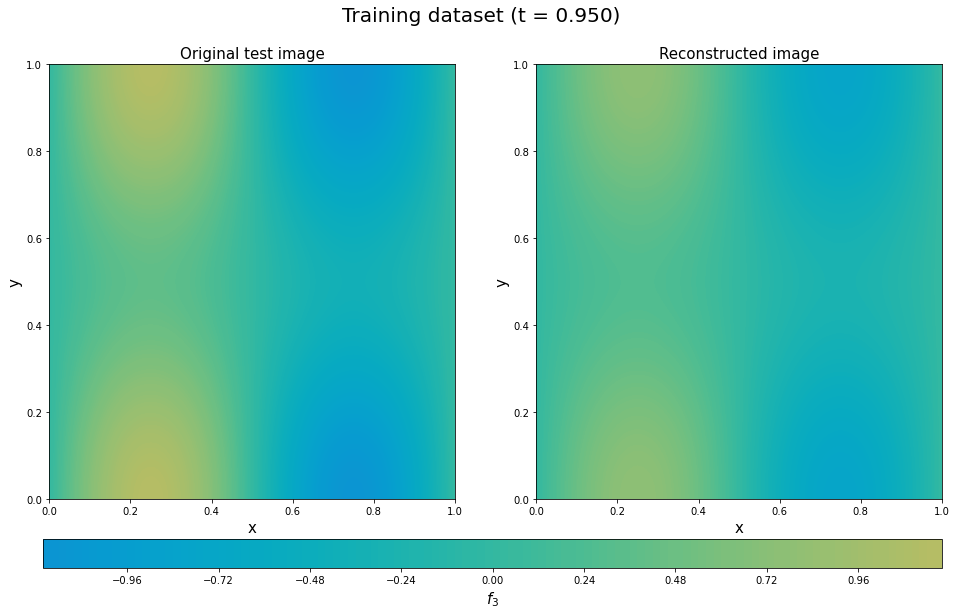

In [122]:
plt.figure(figsize=(16, 8))
y_train3_32_rotate = y_train3[32].T.reshape(101,101)
decoded_rotate3 = decoded_train3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_32_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[38]), fontsize=20)
plt.show()

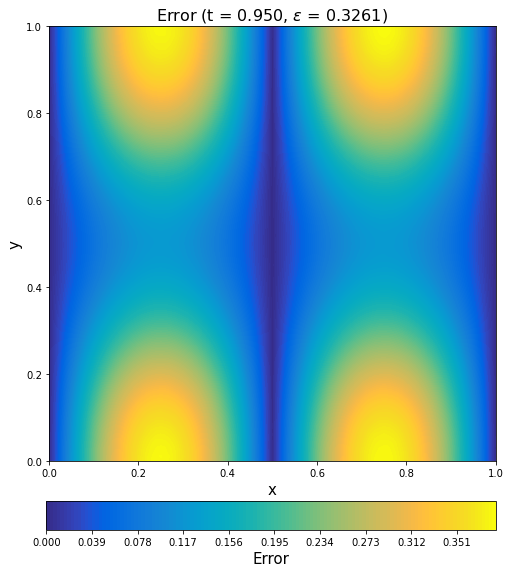

In [123]:
error_train_abs3_rotate32 = error_train_abs3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate32, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.950, $\epsilon$ = %.4f)' %(l2_error_train_list3[32]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

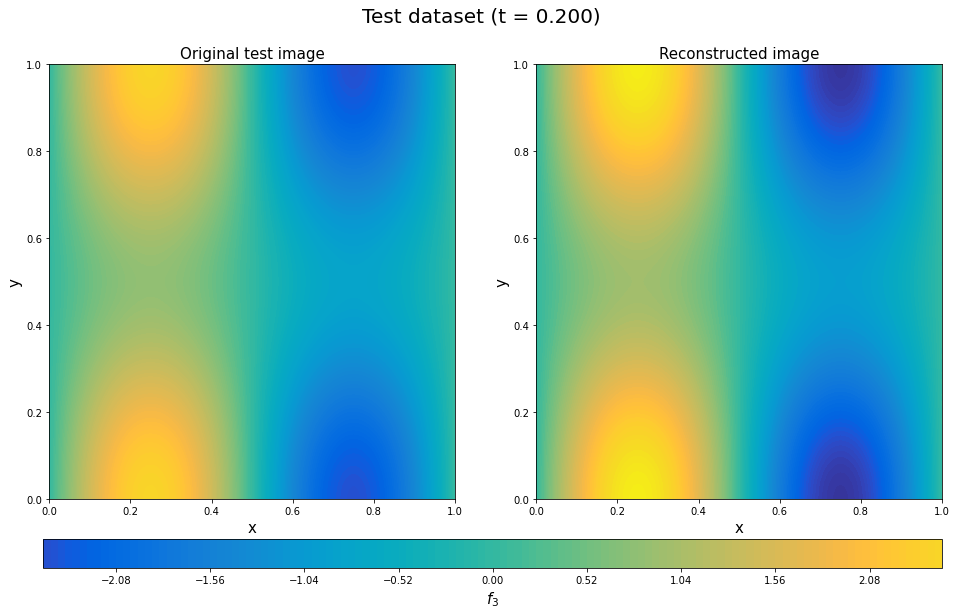

In [124]:
plt.figure(figsize=(16, 8))
y_test3_2_rotate = y_test3[2].T.reshape(101,101)
decoded_rotate3 = decoded_test3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

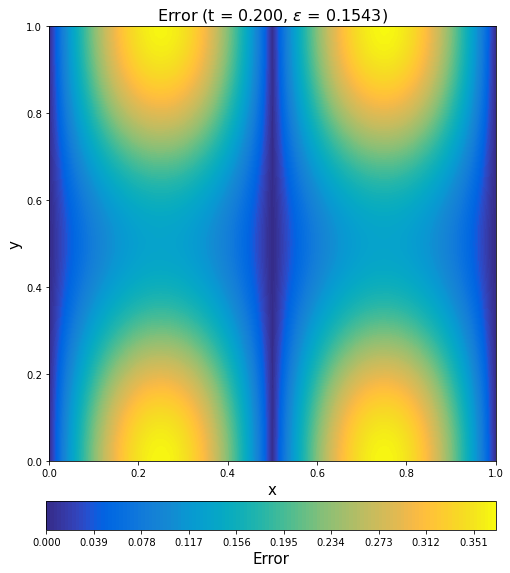

In [125]:
error_test_abs3_rotate2 = error_test_abs3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list3[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

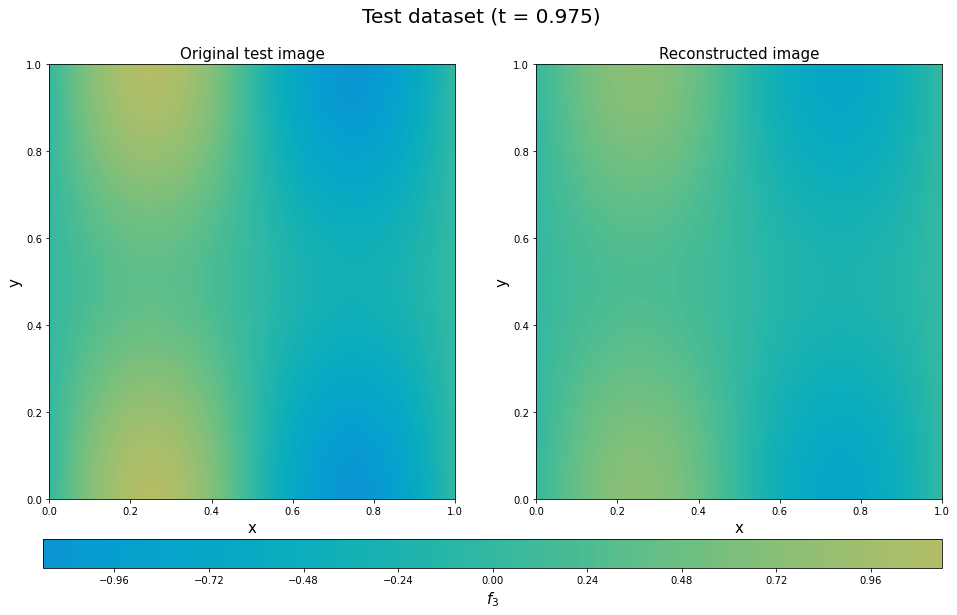

In [126]:
plt.figure(figsize=(16, 8))
y_test3_7_rotate = y_test3[7].T.reshape(101,101)
decoded_rotate3 = decoded_test3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_7_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[39]),fontsize=20)
plt.show()

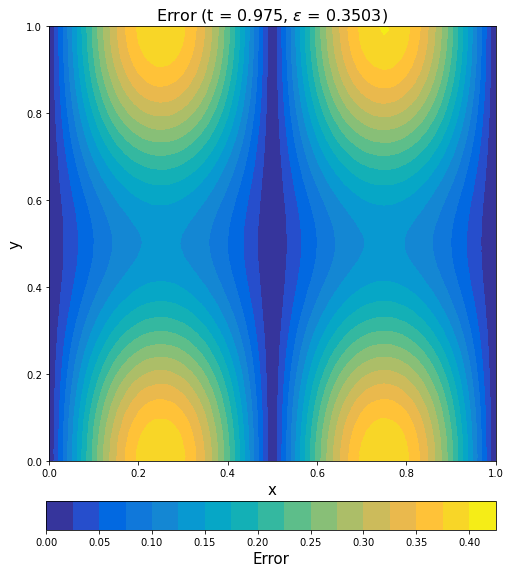

In [127]:
error_test_abs3_rotate7 = error_test_abs3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate7, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.975, $\epsilon$ = %.4f)' %(l2_error_test_list3[7]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()